# Setting up the environment

We'll load the needed libraries:


In [585]:
options(repr.matrix.max.rows=100, repr.matrix.max.cols=300)
options(repr.plot.width = 20, repr.plot.height = 15)
options(width=300)

numcores=8

library(tidyverse)
library(parallel)
library(data.table)
library(fst)
library(comorbidity)
library(zeallot)
library(reshape)
library(dtplyr)
library(haven)
library(vroom)
library(dplyr)
`%!in%` = Negate(`%in%`)

setDTthreads(numcores)

# Codes

First, we will add codes from ICD and Medicare:primary_care_specialty_codes

In [586]:
#diagnosis codes
#from https://www.cms.gov/medicare-coverage-database/view/article.aspx?articleId=52850&ver=26 and https://www.aapc.com/codes/cpt-codes-range/93451-93533/10
angio_codes=c(93451,93452,93453,93454,93455,93456,93457,93458,93459,93460,93461,93462,93463,93464
              ,93503,93505,93530,93531,93532,93533)
#from https://www.cms.gov/medicare-coverage-database/view/article.aspx?articleid=57326&ver=13&keyword=electrocardiogram&keywordType=starts&areaId=all&docType=NCA,CAL,NCD,MEDCAC,TA,MCD,6,3,5,1,F,P&contractOption=all&sortBy=relevance&bc=1
ecg_codes=c(93000,93005,93010,93040,93041,93042)
#from https://scct.org/page/CardiacCTCodes include CTangio
cardiac_ct_codes=c(75571,75572,75573,75574)
#from https://cardiacmri.com/tech-guide/cpt-codes-relevant-to-cardiac-mri/
cardiac_mri_codes=c(75557,75559,75561,75563,75565)
# from https://medicarepaymentandreimbursement.com/2011/07/cardiovascular-stress-testing-cpt-93015.html and https://www.aapc.com/codes/cpt-codes-range/93000-93050/
stress_test_codes=c(93015,93016,93017,93018)
#from https://www.aapc.com/codes/cpt-codes-range/93303-93356/20     includes stress echo
echocardiography_codes=c(93303,93304,93306,93307,93308,93312,93313,93314,93315,93316,93317,93318
                         ,93320,93321,93325,93350,93351,93356,93352,93355,93356)
#from https://www.aapc.com/codes/cpt-codes-range/92920-92979/ and https://www.cms.gov/medicare-coverage-database/view/article.aspx?articleId=57479#:~:text=CPT%20codes%2092928%2C%2092933%2C%2092929,are%20assigned%20to%20APC%200104.    includes balloon and stent
angioplasty_codes=c(92920,92921,92924,92925,92928,92929,92933,92934,92937,92938,92941,92943,92944
                    ,92973,92974,92975,92978,92979,93571,93572,"C9600","C9601","C9602","C9603"
                    ,"C9604","C9605","C9606","C9607","C9608")
#from https://www.medaxiom.com/clientuploads/webcast_handouts/Coding_for_CABG-Open_Heart_Procedures.pdf and https://www.aapc.com/codes/cpt-codes-range/33016-33999/10    did not include 33517-33530 since these are used in conjunction with 33533-33548 and not alone, did not include 33542,33545,33548 since these are also in conjunction )aneurismectomy and vsd resection
CABG_codes=c(33510,33511,33512,33513,33514,33516,33533,33534,33535,33536)
#from http://www.icd9data.com/2015/Volume1/390-459/430-438/default.htm and https://www.icd10data.com/ICD10CM/Codes/I00-I99/I60-I69/I63-
stroke_icd_9_codes=c(43301,43311,43321,43331,43381,43391,43401,43411,43491)
office_visit_codes=c("99201","99202","99203","99204","99205","99211","99212","99213","99214"
                     ,"99215")
IHD_icd_9_codes=c(410, 411, 412,413,414)
IHD_icd_10_codes=c("I20", "I21", "I22", "I23", "I24", "I25")

non_us_state_codes=c(40,54,56,57,58,59,60,61,62,63,64,65,66,97,98,99)

primary_care_specialty_codes=c("01", "08", "11", "38")
surgery_specialty_codes=c("02","04","14","19","20","24","28","33","34","40","48","77","78","85","91")

#http://www.icd9data.com/2015/Volume1/390-459/401-405/default.htm
#https://www.icd10data.com/ICD10CM/Codes/I00-I99/I10-I16
hypertension_icd_9_codes=c("401","402","403","404","405")
hypertension_icd_10_codes=c("I10","I11","I12","I13","I15","I16")

#http://www.icd9data.com/2014/Volume1/460-519/490-496/default.htm
#https://www.icd10data.com/ICD10CM/Codes/J00-J99/J40-J47
copd_icd_9_codes=c("490","491","492","493","494","495","496")
copd_icd_10_codes=c("J40","J41","J42","J43","J44","J45","J47")

#http://www.icd9data.com/2015/Volume1/240-279/270-279/278/278.htm?__hstc=93424706.cdd51240e438a5219319ce13ccb23860.1648603374124.1648603374124.1648607295327.2&__hssc=93424706.9.1648607295327&__hsfp=908776442
#https://www.icd10data.com/ICD10CM/Codes/E00-E89/E65-E68/E66-
obesity_icd_9_codes=c("278")
obesity_icd_10_codes=c("E66")

#http://www.icd9data.com/2014/Volume1/290-319/295-299/296/default.htm
#https://www.icd10data.com/ICD10CM/Codes/F01-F99/F30-F39
depression_icd_9_codes=c("2962","2963")
depression_icd_10_codes=c("F32","F33")

#http://www.icd9data.com/2015/Volume1/240-279/249-259/default.htm
#https://www.icd10data.com/ICD10CM/Codes/E00-E89/E08-E13
diabetes_icd_9_codes=c("250")
diabetes_icd_10_codes=c("E08","E09","E10","E11","E13")

census_and_state_codes=read.csv("./results_mar/census_and_state_codes.csv")
census_and_state_codes[1:9,"state_code"] = paste("0",census_and_state_codes[1:9,"state_code"],sep="")

race_codes=data.frame(race_code = seq(0,6),
                      race = c("Unknown", "White", "Black", "Other", "Asian", "Hispanic", "North American Native")
                      )

sex_codes=data.frame(sex_code = seq(0,2),
                    sex = c("Unknown","Male","Female"))
                      
                      
                      

# Comparisons and analyses

I will compare the patients who were treated by the integrated vs non-integrated physicians, cardiologists and interventionists during the study period. Year 2013 did not divide cardiologists and inteventionists. So, We will not include this year in our comparisons of cardiologists and inteventionists.



## Reading the patient and physician integration results

In [587]:
yearly_calculations_stable_angina =
read_fst("results_may/yearly_calculations_stable_angina_with_integration.fst"
         ,as.data.table = T) 
yearly_calculations_unstable_angina =
read_fst("results_may/yearly_calculations_unstable_angina_with_integration.fst"
         ,as.data.table = T)
#physician_integration_stats = 
#read_fst("results_feb/physician_integration_stats.fst"
#        ,as.data.table = T)
#melted_physician_integration_stats=
#read_fst("results_feb/melted_physician_integration_stats.fst"
#        ,as.data.table = T)

In [588]:
tail(yearly_calculations_stable_angina,5)

DESY_SORT_KEY,first_diagnosis,tot_allowed_carrier,office_visit_count,office_visit_cost_carrier,cardiology_visit_count,distinct_clinicians,distinct_cardiologists,distinct_primary_care_physicians,distinct_surgeons,distinct_other_specialties,catheterization_count,catheterization_cost_carrier,ecg_count,ecg_cost_carrier,cardiac_ct_count,cardiac_ct_cost_carrier,cardiac_mri_count,cardiac_mri_cost_carrier,stress_test_count,stress_test_cost_carrier,echocardiography_count,echocardiography_cost_carrier,angioplasty_count,angioplasty_cost_carrier,CABG_count,CABG_cost_carrier,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,hypertension,copd,obesity,depression,diabetes,icd_9_pure,icd_10_pure,catheterization_date,angioplasty_date,catheterization_doc_NPI,angioplasty_doc_NPI,diagnosing_doc_NPI,year_first_diagnosed,time_difference_angio_cath,angioplasty_with_cath,angioplasty_during_year_after_cath,tot_allowed_carrier_cardiology_related,office_visit_count_cardiology_related,office_visit_cost_carrier_cardiology_related,cardiology_visit_count_cardiology_related,distinct_clinicians_cardiology_related,distinct_cardiologists_cardiology_related,distinct_primary_care_physicians_cardiology_related,distinct_surgeons_cardiology_related,distinct_other_specialties_cardiology_related,catheterization_count_cardiology_related,catheterization_cost_carrier_cardiology_related,ecg_count_cardiology_related,ecg_cost_carrier_cardiology_related,cardiac_ct_count_cardiology_related,cardiac_ct_cost_carrier_cardiology_related,cardiac_mri_count_cardiology_related,cardiac_mri_cost_carrier_cardiology_related,stress_test_count_cardiology_related,stress_test_cost_carrier_cardiology_related,echocardiography_count_cardiology_related,echocardiography_cost_carrier_cardiology_related,angioplasty_count_cardiology_related,angioplasty_cost_carrier_cardiology_related,CABG_count_cardiology_related,CABG_cost_carrier_cardiology_related,office_visit_cost_outpatient,catheterization_cost_outpatient,ecg_cost_outpatient,cardiac_ct_cost_outpatient,cardiac_mri_cost_outpatient,stress_test_cost_outpatient,echocardiography_cost_outpatient,angioplasty_cost_outpatient,CABG_cost_outpatient,office_visit_cost_outpatient_cardiology_related,catheterization_cost_outpatient_cardiology_related,ecg_cost_outpatient_cardiology_related,cardiac_ct_cost_outpatient_cardiology_related,cardiac_mri_cost_outpatient_cardiology_related,stress_test_cost_outpatient_cardiology_related,echocardiography_cost_outpatient_cardiology_related,angioplasty_cost_outpatient_cardiology_related,CABG_cost_outpatient_cardiology_related,office_visit_cost,catheterization_cost,ecg_cost,cardiac_ct_cost,cardiac_mri_cost,stress_test_cost,echocardiography_cost,angioplasty_cost,CABG_cost,office_visit_cost_cardiology_related,catheterization_cost_cardiology_related,ecg_cost_cardiology_related,cardiac_ct_cost_cardiology_related,cardiac_mri_cost_cardiology_related,stress_test_cost_cardiology_related,echocardiography_cost_cardiology_related,angioplasty_cost_cardiology_related,CABG_cost_cardiology_related,tot_cheap_prcdr_cost,tot_expensive_prcdr_cost,tot_cheap_prcdr_cost_cardiology_related,tot_expensive_prcdr_cost_cardiology_related,tot_cheap_prcdr_count,tot_expensive_prcdr_count,tot_cheap_prcdr_count_cardiology_related,tot_expensive_prcdr_count_cardiology_related,REFERENCE_YEAR_2013,STATE_CODE_2013,COUNTY_CODE_2013,SEX_CODE_2013,RACE_CODE_2013,AGE_2013,ORIG_REASON_FOR_ENTITLEMENT_2013,CURR_REASON_FOR_ENTITLEMENT_2013,ENTITLEMENT_BUY_IN_IND01_2013,ENTITLEMENT_BUY_IN_IND02_2013,ENTITLEMENT_BUY_IN_IND03_2013,ENTITLEMENT_BUY_IN_IND04_2013,ENTITLEMENT_BUY_IN_IND05_2013,ENTITLEMENT_BUY_IN_IND06_2013,ENTITLEMENT_BUY_IN_IND07_2013,ENTITLEMENT_BUY_IN_IND08_2013,ENTITLEMENT_BUY_IN_IND09_2013,ENTITLEMENT_BUY_IN_IND10_2013,ENTITLEMENT_BUY_IN_IND11_2013,ENTITLEMENT_BUY_IN_IND12_2013,HMO_INDICATOR01_2013,HMO_INDICATOR02_2013,HMO_INDICATOR03_2013,HMO_INDICATOR04_2013,HMO_INDICATOR05_2013,HMO_INDICATOR06_2013,HMO_INDICATOR07_2013,HMO_INDICATOR08_2013,HMO_INDICA

In [589]:
colnames(yearly_calculations_stable_angina)

[1] "DESY_SORT_KEY"                                                                               "first_diagnosis"                                                                             "tot_allowed_carrier"                                                                        
  [4] "office_visit_count"                                                                          "office_visit_cost_carrier"                                                                   "cardiology_visit_count"                                                                     
  [7] "distinct_clinicians"                                                                         "distinct_cardiologists"                                                                      "distinct_primary_care_physicians"                                                           
 [10] "distinct_surgeons"                                                                           "distinct_other_specialties"                                                                  "catheterization_count"                                                                      
 [13] "catheterization_cost_carrier"                                                                "ecg_count"                                                                                   "ecg_cost_carrier"                                                                           
 [16] "cardiac_ct_count"                                                                            "cardiac_ct_cost_carrier"                                                                     "cardiac_mri_count"                                                                          
 [19] "cardiac_mri_cost_carrier"                                                                    "stress_test_count"                                                                           "stress_test_cost_carrier"                                                                   
 [22] "echocardiography_count"                                                                      "echocardiography_cost_carrier"                                                               "angioplasty_count"                                                                          
 [25] "angioplasty_cost_carrier"                                                                    "CABG_count"                                                                                  "CABG_cost_carrier"                                                                          
 [28] "stable_angina"                                                                               "unstable_angina"                                                                             "MI"                                                                                         
 [31] "cardiac_arrest"                                                                              "stroke"                                                                                      "hypertension"                                                                               
 [34] "copd"                                                                                        "obesity"                                                                                     "depression"                                                                                 
 [37] "diabetes"                                                                                    "icd_9_pure"                                                                                  "icd_10_pure"                                                                                
 [40] "catheterization_date"                                                                        "angioplasty_date"                                                                            "catheterization_doc_NPI"                                       

## Adding sex, race, and state names from codes

In [590]:
add_personal_details=function(data){
    
  require(tidyverse)
  require(dtplyr)
  require(lubridate)
  
  result=data %>%
  left_join(.,census_and_state_codes[,-1],by=c("state_code_at_diagnosis"="state_code"))%>%
  left_join(.,race_codes,by=c("race_code_at_diagnosis"="race_code"))%>%
  left_join(.,sex_codes,by=c("sex_code_at_diagnosis"="sex_code"))%>%
  mutate(
    age_group=case_when(
      age_at_diagnosis<75 & age_at_diagnosis>64 ~ "65-74",
      age_at_diagnosis>74 & age_at_diagnosis<85 ~ "75-84",
      age_at_diagnosis>84 ~ "85+"
    )
  )%>%
  as.data.table()
  
  return(result)
}

In [591]:
yearly_calculations_stable_angina=add_personal_details(yearly_calculations_stable_angina)
yearly_calculations_unstable_angina=add_personal_details(yearly_calculations_unstable_angina)

In [592]:
head(yearly_calculations_stable_angina[died_in_one_year_after_diagnosis==T,.(DESY_SORT_KEY,
                                                                             died_in_one_year_after_diagnosis,
                                                                             HMO_INDICATOR_sum,
                                                                             date_difference_diagnosis_death,
                                                                             floor(date_difference_diagnosis_death/30))],10)

DESY_SORT_KEY,died_in_one_year_after_diagnosis,HMO_INDICATOR_sum,date_difference_diagnosis_death,V5
<int>,<lgl>,<dbl>,<int>,<dbl>
100025905,TRUE,9,59,1
100031159,TRUE,11,183,6
100046407,TRUE,9,25,0
100078509,TRUE,12,215,7
100088049,TRUE,12,302,10
100103847,TRUE,8,127,4
100116211,TRUE,8,39,1
100147445,TRUE,4,6,0
100193467,TRUE,10,57,1


## Filtering the data for analysis

In [593]:
data_for_modelling_filter=function(data){
  library(tidyverse)
  library(dtplyr)
  
  data%>%
  filter(state_code_at_diagnosis %!in% non_us_state_codes &
         age_at_diagnosis>=65&
         ((died_in_one_year_after_diagnosis==T & HMO_INDICATOR_sum>=floor(date_difference_diagnosis_death/30)-1) |
          (died_in_one_year_after_diagnosis==F & HMO_INDICATOR_sum==12))&
         ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>=floor(date_difference_diagnosis_death/30)-1) |
          (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))&
         year_first_diagnosed!=2013&
         !is.na(most_common_cardiologist_PRF_PHYSN_NPI)
        )%>%
  as.data.table()
}



In [594]:
yearly_calculations_stable_angina=data_for_modelling_filter(yearly_calculations_stable_angina)
yearly_calculations_unstable_angina=data_for_modelling_filter(yearly_calculations_unstable_angina)

In [595]:
length(unique(yearly_calculations_stable_angina$DESY_SORT_KEY))

[1] 15309

In [596]:
length(unique(yearly_calculations_unstable_angina$DESY_SORT_KEY))

[1] 9683

In [597]:
yearly_calculations_stable_angina[is.na(angioplasty_with_cath),angioplasty_with_cath:=F]
yearly_calculations_unstable_angina[is.na(angioplasty_with_cath),angioplasty_with_cath:=F]
yearly_calculations_stable_angina[is.na(angioplasty_during_year_after_cath),angioplasty_during_year_after_cath:=F]
yearly_calculations_unstable_angina[is.na(angioplasty_during_year_after_cath),angioplasty_during_year_after_cath:=F]

## Adding physician data
This data comes from the CMS national downloadable file

### Stable Angina

In [598]:
physician_data = read.csv(file = "physician_data/National_Downloadable_File_2020.csv")
physician_data$NPI=as.character(physician_data$NPI)
physician_data=as.data.table(physician_data)

In [599]:
physician_data=
physician_data[,.(NPI,gndr,Grd_yr)]%>%
group_by(NPI)%>%
slice(1)%>%
as.data.table

In [600]:
tail(physician_data)

NPI,gndr,Grd_yr
<chr>,<chr>,<int>
1902864390,M,1979
1235603606,F,2018
1033648944,M,2015
1407245814,F,2014
1679669436,M,2001
1710963681,M,1976


In [601]:
yearly_calculations_stable_angina=
left_join(yearly_calculations_stable_angina,physician_data,by=c("most_common_cardiologist_PRF_PHYSN_NPI"="NPI"))%>%
dplyr::rename(cardiologist_gndr=gndr,
       cardiologist_grd_yr=Grd_yr)%>%
as.data.table()

In [602]:
yearly_calculations_stable_angina=
yearly_calculations_stable_angina%>%
mutate(cardiologist_experience_at_diagnosis=year_first_diagnosed-cardiologist_grd_yr)%>%
as.data.table()
head(yearly_calculations_stable_angina)

DESY_SORT_KEY,first_diagnosis,tot_allowed_carrier,office_visit_count,office_visit_cost_carrier,cardiology_visit_count,distinct_clinicians,distinct_cardiologists,distinct_primary_care_physicians,distinct_surgeons,distinct_other_specialties,catheterization_count,catheterization_cost_carrier,ecg_count,ecg_cost_carrier,cardiac_ct_count,cardiac_ct_cost_carrier,cardiac_mri_count,cardiac_mri_cost_carrier,stress_test_count,stress_test_cost_carrier,echocardiography_count,echocardiography_cost_carrier,angioplasty_count,angioplasty_cost_carrier,CABG_count,CABG_cost_carrier,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,hypertension,copd,obesity,depression,diabetes,icd_9_pure,icd_10_pure,catheterization_date,angioplasty_date,catheterization_doc_NPI,angioplasty_doc_NPI,diagnosing_doc_NPI,year_first_diagnosed,time_difference_angio_cath,angioplasty_with_cath,angioplasty_during_year_after_cath,tot_allowed_carrier_cardiology_related,office_visit_count_cardiology_related,office_visit_cost_carrier_cardiology_related,cardiology_visit_count_cardiology_related,distinct_clinicians_cardiology_related,distinct_cardiologists_cardiology_related,distinct_primary_care_physicians_cardiology_related,distinct_surgeons_cardiology_related,distinct_other_specialties_cardiology_related,catheterization_count_cardiology_related,catheterization_cost_carrier_cardiology_related,ecg_count_cardiology_related,ecg_cost_carrier_cardiology_related,cardiac_ct_count_cardiology_related,cardiac_ct_cost_carrier_cardiology_related,cardiac_mri_count_cardiology_related,cardiac_mri_cost_carrier_cardiology_related,stress_test_count_cardiology_related,stress_test_cost_carrier_cardiology_related,echocardiography_count_cardiology_related,echocardiography_cost_carrier_cardiology_related,angioplasty_count_cardiology_related,angioplasty_cost_carrier_cardiology_related,CABG_count_cardiology_related,CABG_cost_carrier_cardiology_related,office_visit_cost_outpatient,catheterization_cost_outpatient,ecg_cost_outpatient,cardiac_ct_cost_outpatient,cardiac_mri_cost_outpatient,stress_test_cost_outpatient,echocardiography_cost_outpatient,angioplasty_cost_outpatient,CABG_cost_outpatient,office_visit_cost_outpatient_cardiology_related,catheterization_cost_outpatient_cardiology_related,ecg_cost_outpatient_cardiology_related,cardiac_ct_cost_outpatient_cardiology_related,cardiac_mri_cost_outpatient_cardiology_related,stress_test_cost_outpatient_cardiology_related,echocardiography_cost_outpatient_cardiology_related,angioplasty_cost_outpatient_cardiology_related,CABG_cost_outpatient_cardiology_related,office_visit_cost,catheterization_cost,ecg_cost,cardiac_ct_cost,cardiac_mri_cost,stress_test_cost,echocardiography_cost,angioplasty_cost,CABG_cost,office_visit_cost_cardiology_related,catheterization_cost_cardiology_related,ecg_cost_cardiology_related,cardiac_ct_cost_cardiology_related,cardiac_mri_cost_cardiology_related,stress_test_cost_cardiology_related,echocardiography_cost_cardiology_related,angioplasty_cost_cardiology_related,CABG_cost_cardiology_related,tot_cheap_prcdr_cost,tot_expensive_prcdr_cost,tot_cheap_prcdr_cost_cardiology_related,tot_expensive_prcdr_cost_cardiology_related,tot_cheap_prcdr_count,tot_expensive_prcdr_count,tot_cheap_prcdr_count_cardiology_related,tot_expensive_prcdr_count_cardiology_related,REFERENCE_YEAR_2013,STATE_CODE_2013,COUNTY_CODE_2013,SEX_CODE_2013,RACE_CODE_2013,AGE_2013,ORIG_REASON_FOR_ENTITLEMENT_2013,CURR_REASON_FOR_ENTITLEMENT_2013,ENTITLEMENT_BUY_IN_IND01_2013,ENTITLEMENT_BUY_IN_IND02_2013,ENTITLEMENT_BUY_IN_IND03_2013,ENTITLEMENT_BUY_IN_IND04_2013,ENTITLEMENT_BUY_IN_IND05_2013,ENTITLEMENT_BUY_IN_IND06_2013,ENTITLEMENT_BUY_IN_IND07_2013,ENTITLEMENT_BUY_IN_IND08_2013,ENTITLEMENT_BUY_IN_IND09_2013,ENTITLEMENT_BUY_IN_IND10_2013,ENTITLEMENT_BUY_IN_IND11_2013,ENTITLEMENT_BUY_IN_IND12_2013,HMO_INDICATOR01_2013,HMO_INDICATOR02_2013,HMO_INDICATOR03_2013,HMO_INDICATOR04_2013,HMO_INDICATOR05_2013,HMO_INDICATOR06_2013,HMO_INDICATOR07_2013,HMO_INDICATOR08_2013,HMO_INDICA

## Adding metropolitan status
I will add the metropolitan statuses of the patient counties using the USDA data

In [603]:
rural_urban_data = readxl::read_xls("physician_data/ruralurbancodes2013.xls")%>%as.data.table()
head(rural_urban_data)
cross_walk_rural_urban=read.csv(file = "physician_data/xwalk2018.csv")%>%as.data.table()
head(cross_walk_rural_urban)

FIPS,State,County_Name,Population_2010,RUCC_2013,Description
<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>
01001,AL,Autauga County,54571,2,"Metro - Counties in metro areas of 250,000 to 1 million population"
01003,AL,Baldwin County,182265,3,"Metro - Counties in metro areas of fewer than 250,000 population"
01005,AL,Barbour County,27457,6,"Nonmetro - Urban population of 2,500 to 19,999, adjacent to a metro area"
01007,AL,Bibb County,22915,1,Metro - Counties in metro areas of 1 million population or more
01009,AL,Blount County,57322,1,Metro - Counties in metro areas of 1 million population or more
01011,AL,Bullock County,10914,6,"Nonmetro - Urban population of 2,500 to 19,999, adjacent to a metro area"
01013,AL,Butler County,20947,6,"Nonmetro - Urban population of 2,500 to 19,999, adjacent to a metro area"
01015,AL,Calhoun County,118572,3,"Metro - Counties in metro areas of fewer than 250,000 population"
01017,AL,Chambers County,34215,6,"Nonmetro - Urban population of 2,500 to 19,999, adjacent to a metro area"


In [606]:
yearly_calculations_stable_angina[,SSACD:=as.integer(paste(state_code_at_diagnosis,county_code_at_diagnosis,sep=""))]
yearly_calculations_stable_angina=left_join(yearly_calculations_stable_angina,cross_walk_rural_urban,by="SSACD")%>%
mutate(FIPS.County.Code=as.character(FIPS.County.Code))%>%
left_join(.,rural_urban_data,by=c("FIPS.County.Code"="FIPS"))%>%
as.data.table()
yearly_calculations_stable_angina[,c("SSACD","County.Name","State.x","FIPS.County.Code","CBSA","CBSA.Name","State.y","County_Name","Population_2010","Description"):=NULL]
head(yearly_calculations_stable_angina)

DESY_SORT_KEY,first_diagnosis,tot_allowed_carrier,office_visit_count,office_visit_cost_carrier,cardiology_visit_count,distinct_clinicians,distinct_cardiologists,distinct_primary_care_physicians,distinct_surgeons,distinct_other_specialties,catheterization_count,catheterization_cost_carrier,ecg_count,ecg_cost_carrier,cardiac_ct_count,cardiac_ct_cost_carrier,cardiac_mri_count,cardiac_mri_cost_carrier,stress_test_count,stress_test_cost_carrier,echocardiography_count,echocardiography_cost_carrier,angioplasty_count,angioplasty_cost_carrier,CABG_count,CABG_cost_carrier,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,hypertension,copd,obesity,depression,diabetes,icd_9_pure,icd_10_pure,catheterization_date,angioplasty_date,catheterization_doc_NPI,angioplasty_doc_NPI,diagnosing_doc_NPI,year_first_diagnosed,time_difference_angio_cath,angioplasty_with_cath,angioplasty_during_year_after_cath,tot_allowed_carrier_cardiology_related,office_visit_count_cardiology_related,office_visit_cost_carrier_cardiology_related,cardiology_visit_count_cardiology_related,distinct_clinicians_cardiology_related,distinct_cardiologists_cardiology_related,distinct_primary_care_physicians_cardiology_related,distinct_surgeons_cardiology_related,distinct_other_specialties_cardiology_related,catheterization_count_cardiology_related,catheterization_cost_carrier_cardiology_related,ecg_count_cardiology_related,ecg_cost_carrier_cardiology_related,cardiac_ct_count_cardiology_related,cardiac_ct_cost_carrier_cardiology_related,cardiac_mri_count_cardiology_related,cardiac_mri_cost_carrier_cardiology_related,stress_test_count_cardiology_related,stress_test_cost_carrier_cardiology_related,echocardiography_count_cardiology_related,echocardiography_cost_carrier_cardiology_related,angioplasty_count_cardiology_related,angioplasty_cost_carrier_cardiology_related,CABG_count_cardiology_related,CABG_cost_carrier_cardiology_related,office_visit_cost_outpatient,catheterization_cost_outpatient,ecg_cost_outpatient,cardiac_ct_cost_outpatient,cardiac_mri_cost_outpatient,stress_test_cost_outpatient,echocardiography_cost_outpatient,angioplasty_cost_outpatient,CABG_cost_outpatient,office_visit_cost_outpatient_cardiology_related,catheterization_cost_outpatient_cardiology_related,ecg_cost_outpatient_cardiology_related,cardiac_ct_cost_outpatient_cardiology_related,cardiac_mri_cost_outpatient_cardiology_related,stress_test_cost_outpatient_cardiology_related,echocardiography_cost_outpatient_cardiology_related,angioplasty_cost_outpatient_cardiology_related,CABG_cost_outpatient_cardiology_related,office_visit_cost,catheterization_cost,ecg_cost,cardiac_ct_cost,cardiac_mri_cost,stress_test_cost,echocardiography_cost,angioplasty_cost,CABG_cost,office_visit_cost_cardiology_related,catheterization_cost_cardiology_related,ecg_cost_cardiology_related,cardiac_ct_cost_cardiology_related,cardiac_mri_cost_cardiology_related,stress_test_cost_cardiology_related,echocardiography_cost_cardiology_related,angioplasty_cost_cardiology_related,CABG_cost_cardiology_related,tot_cheap_prcdr_cost,tot_expensive_prcdr_cost,tot_cheap_prcdr_cost_cardiology_related,tot_expensive_prcdr_cost_cardiology_related,tot_cheap_prcdr_count,tot_expensive_prcdr_count,tot_cheap_prcdr_count_cardiology_related,tot_expensive_prcdr_count_cardiology_related,REFERENCE_YEAR_2013,STATE_CODE_2013,COUNTY_CODE_2013,SEX_CODE_2013,RACE_CODE_2013,AGE_2013,ORIG_REASON_FOR_ENTITLEMENT_2013,CURR_REASON_FOR_ENTITLEMENT_2013,ENTITLEMENT_BUY_IN_IND01_2013,ENTITLEMENT_BUY_IN_IND02_2013,ENTITLEMENT_BUY_IN_IND03_2013,ENTITLEMENT_BUY_IN_IND04_2013,ENTITLEMENT_BUY_IN_IND05_2013,ENTITLEMENT_BUY_IN_IND06_2013,ENTITLEMENT_BUY_IN_IND07_2013,ENTITLEMENT_BUY_IN_IND08_2013,ENTITLEMENT_BUY_IN_IND09_2013,ENTITLEMENT_BUY_IN_IND10_2013,ENTITLEMENT_BUY_IN_IND11_2013,ENTITLEMENT_BUY_IN_IND12_2013,HMO_INDICATOR01_2013,HMO_INDICATOR02_2013,HMO_INDICATOR03_2013,HMO_INDICATOR04_2013,HMO_INDICATOR05_2013,HMO_INDICATOR06_2013,HMO_INDICATOR07_2013,HMO_INDICATOR08_2013,HMO_INDICA

## Finding racial differences in outcomes in the year of diagnosis

In [96]:
compare_races_by_outcome=function(data){
  require(tidyverse)
  require(dtplyr)
  require(lubridate)
  
  results_prp=
  data %>%
  filter(state_code_at_diagnosis %!in% non_us_state_codes &
        HMO_INDICATOR_sum == 12 &
        ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
         (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
        )%>%
  group_by(race)%>%
  summarise(
    death_in_12_months_after_diagnosis=sum(na.rm = T,died_in_one_year_after_diagnosis)/nrow(.[!is.na(died_in_one_year_after_diagnosis)]),
    death_in_24_months_after_diagnosis=sum(na.rm = T,died_in_two_years_after_diagnosis)/nrow(.[!is.na(died_in_two_years_after_diagnosis)])
  )%>%
  as.data.table()

  results_prp
}

In [99]:
compare_races_by_outcome(yearly_calculations_stable_angina)


race,death_in_12_months_after_diagnosis,death_in_24_months_after_diagnosis
<chr>,<dbl>,<dbl>
Asian,0.031613977,0.09477756
Black,0.063851699,0.14367596
Hispanic,0.057142857,0.13501484
North American Native,0.034482759,0.15131579
Other,0.034090909,0.06313131
Unknown,0.009771987,0.04597701
White,0.054612786,0.12163464


In [98]:
compare_races_by_outcome(yearly_calculations_unstable_angina)

race,death_in_12_months_after_diagnosis,death_in_24_months_after_diagnosis
<chr>,<dbl>,<dbl>
Asian,0.04095563,0.11026616
Black,0.06690871,0.14269663
Hispanic,0.08720930,0.12461059
North American Native,0.07446809,0.13636364
Other,0.07359307,0.11538462
Unknown,0.02259887,0.05442177
White,0.05558093,0.12474892


In [34]:
plot_changes_in_cumsum_stable_patients_cardiologists=ggplot(data=changes_in_cumsum_stable_patients_cardiologists)+
geom_histogram(aes(cumsum_change_in_year_of_diagnosis),bins=4)+ggtitle("Stable Angina Patients")
plotly::ggplotly(plot_changes_in_cumsum_stable_patients_cardiologists)

plot_changes_in_cumsum_unstable_patients_cardiologists=ggplot(data=changes_in_cumsum_unstable_patients_cardiologists)+
geom_histogram(aes(cumsum_change_in_year_of_diagnosis),bins=4)+ggtitle("Unstable Angina Patients")
plotly::ggplotly(plot_changes_in_cumsum_unstable_patients_cardiologists)

ERROR: Error in ggplot(data = changes_in_cumsum_stable_patients_cardiologists): object 'changes_in_cumsum_stable_patients_cardiologists' not found


Warning message:
“Removed 7520 rows containing non-finite values (stat_bin).”
Warning message:
“Removed 3111 rows containing non-finite values (stat_bin).”


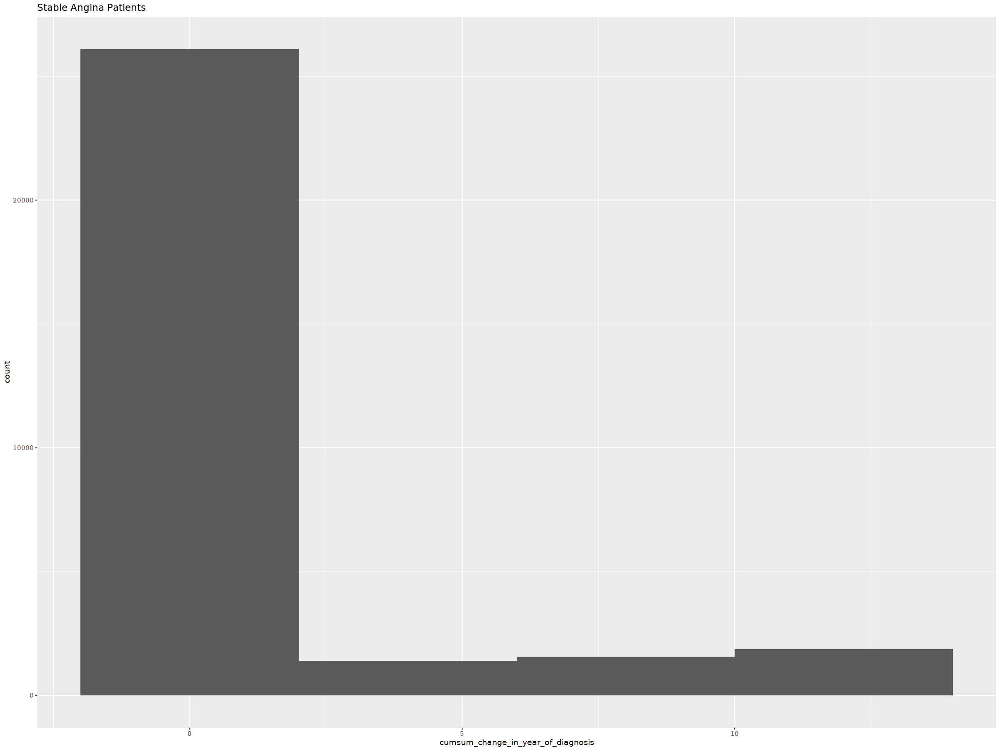

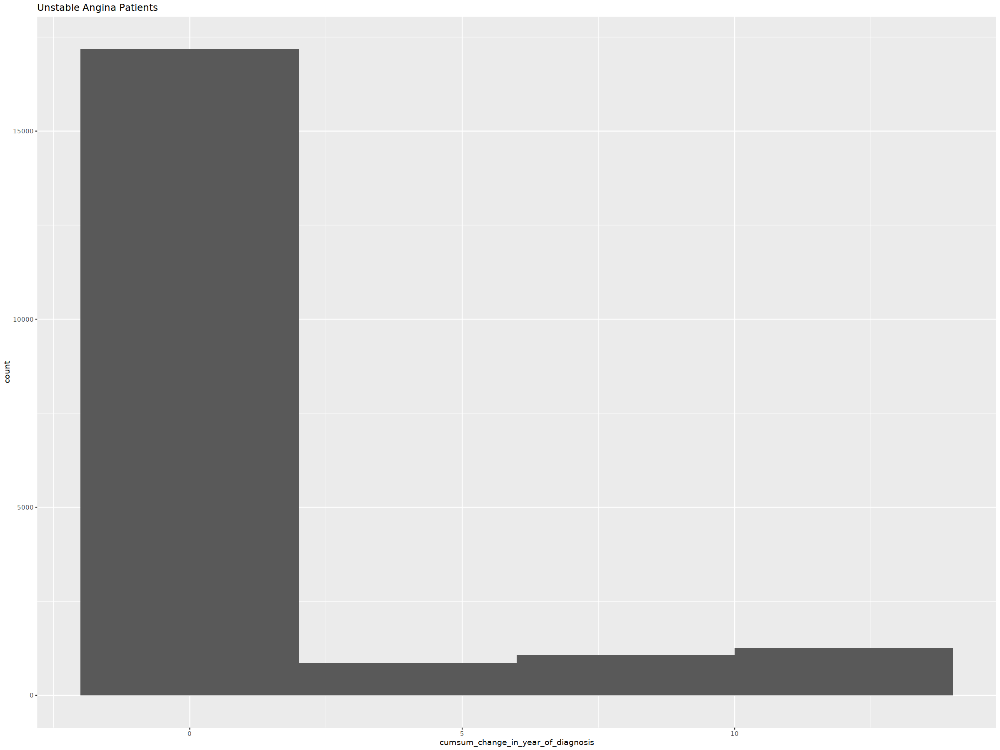

In [127]:
plot_changes_in_cumsum_stable_patients_cardiologists
plot_changes_in_cumsum_unstable_patients_cardiologists

## Finding how many of the services were billed from hospital for each patient

Here, I will show how many of the patients had a proportion of in-facility care in a certain range.

In [5]:
yearly_calculator_patient_billings = function(data,diagnosis,time_frame=365yearly_unstable_angina_billings = yearly_calculator_patient_billings(carrier_data_all_years, diagnosis = "unstable_angina"),
                                        integrated_place_of_service_codes = c("19", "22"),
                                        all_place_of_service_codes = c("11", "19", "22")){
  
  #requirements
  require(data.table)
  require(dtplyr)
  require(tidyverse)
  require(lubridate)
  
  data %>%
    mutate(
      is_facility = LINE_PLACE_OF_SRVC_CD %in% integrated_place_of_service_codes,
      is_all = LINE_PLACE_OF_SRVC_CD %in% all_place_of_service_codes,
      is_stable_angina = ifelse(
        LINE_ICD_DGNS_VRSN_CD == 0,
        LINE_ICD_DGNS_CD %in% c ("I208", "I209"),
        ifelse(LINE_ICD_DGNS_VRSN_CD == 9, LINE_ICD_DGNS_CD == "4139", NA)),
      is_unstable_angina = ifelse(
        LINE_ICD_DGNS_VRSN_CD == 0,
        LINE_ICD_DGNS_CD == "I200",
        ifelse(LINE_ICD_DGNS_VRSN_CD == 9, LINE_ICD_DGNS_CD == "4111", NA)),
      is_IHD = if_else(
        LINE_ICD_DGNS_VRSN_CD == 0,
        substr(LINE_ICD_DGNS_CD, 0, 3) %in% IHD_icd_10_codes,
        if_else(
          LINE_ICD_DGNS_VRSN_CD == 9,
          substr(LINE_ICD_DGNS_CD, 0, 3) %in% IHD_icd_9_codes,NA))
    )%>%
    group_by(DESY_SORT_KEY) %>%
    filter(sum(eval(parse(
      text = paste("is_", diagnosis, sep = "")
    )), na.rm = T) == T) %>%
    mutate(first_diagnosis = min(date[eval(parse(text = paste("is_", diagnosis, sep = ""))) ==
                                        T]), na.rm = T) %>%
    mutate( had_IHD = (
      date - first_diagnosis < 0 &
        first_diagnosis - date < time_frame &
        is_IHD
    ))%>%
    filter(date - first_diagnosis >= 0 &
             date - first_diagnosis < time_frame &
             had_IHD == F, #we are excluding patients who had IHD in the year before diagnosis
           .preserve = T) %>%
    summarise(
      in_facility_count = sum(is_facility, na.rm = T),
      in_all_count = sum(is_all, na.rm = T),
    ) %>%
    mutate(
      in_facility_prp = in_facility_count / in_all_count,
    )%>%
    as.data.table()
}

yearly_stable_angina_billings = yearly_calculator_patient_billings(carrier_data_all_years, diagnosis = "stable_angina")
yearly_unstable_angina_billings = yearly_calculator_patient_billings(carrier_data_all_years, diagnosis = "unstable_angina")

ERROR: Error in parse(text = x, srcfile = src): <text>:1:76: unexpected symbol
1: yearly_calculator_patient_billings = function(data,diagnosis,time_frame=365yearly_unstable_angina_billings
                                                                               ^


In [50]:
plot_yearly_stable_angina_billings=ggplot(data=yearly_stable_angina_billings)+
geom_histogram(aes(in_facility_prp),bins=5)+ggtitle("Stable Angina Patients")
plotly::ggplotly(plot_yearly_stable_angina_billings)

plot_yearly_unstable_angina_billings=ggplot(data=yearly_unstable_angina_billings)+
geom_histogram(aes(in_facility_prp),bins=5)+ggtitle("Unstable Angina Patients")
plotly::ggplotly(plot_yearly_unstable_angina_billings)

Warning message:
“Removed 1185 rows containing non-finite values (stat_bin).”


HTML widgets cannot be represented in plain text (need html)

Warning message:
“Removed 1068 rows containing non-finite values (stat_bin).”


HTML widgets cannot be represented in plain text (need html)

Warning message:
“Removed 1185 rows containing non-finite values (stat_bin).”
Warning message:
“Removed 1068 rows containing non-finite values (stat_bin).”


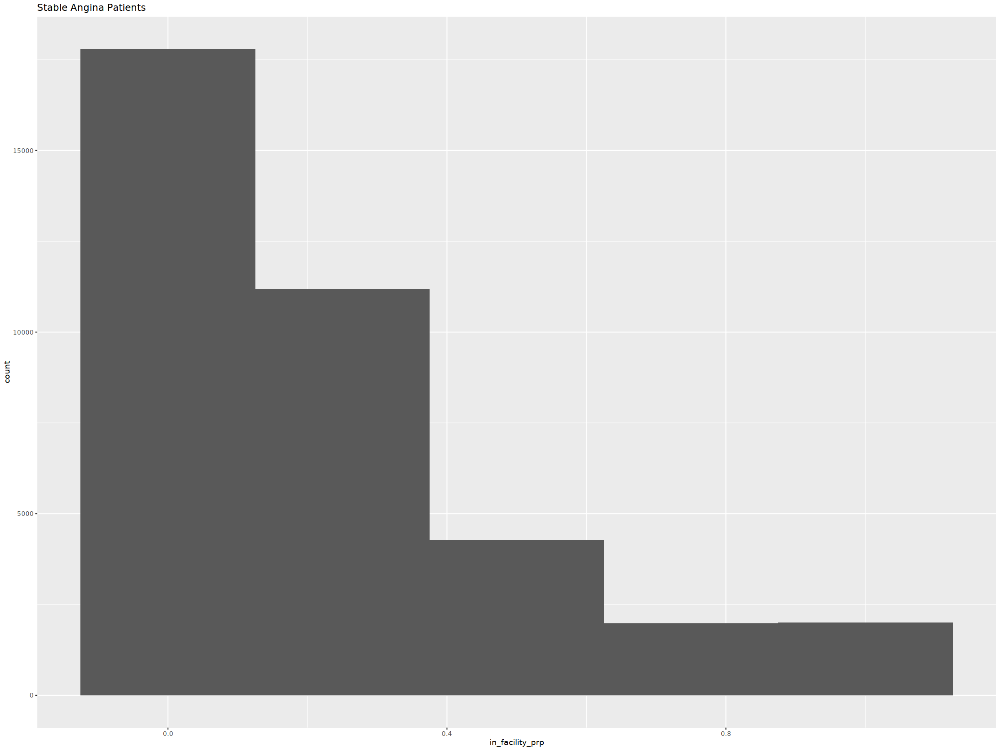

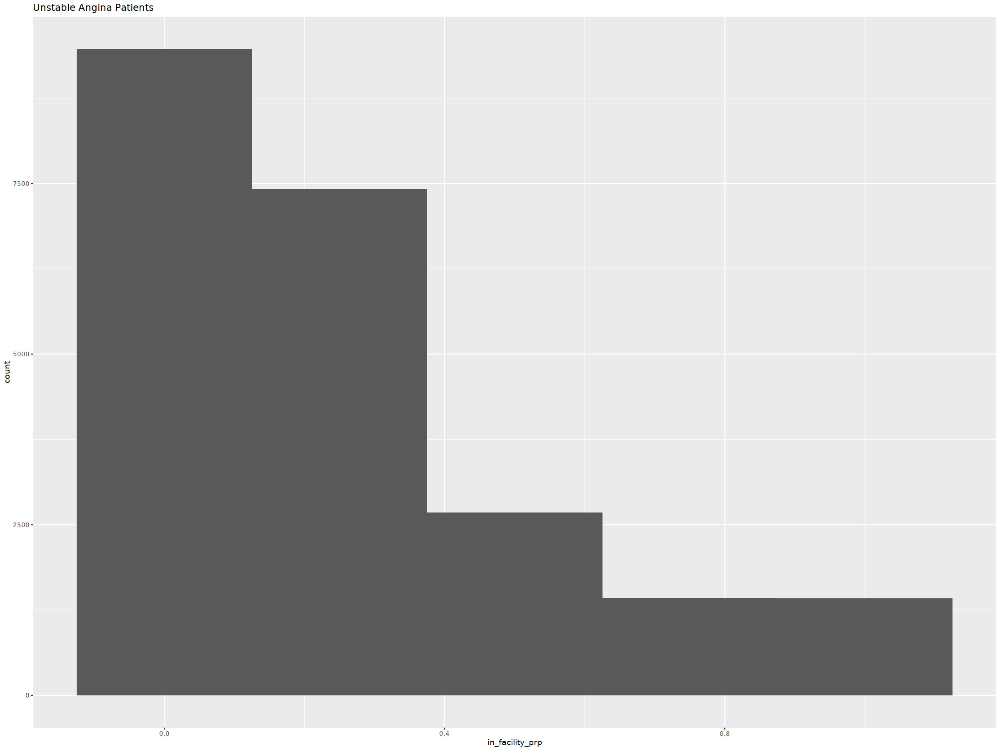

In [128]:
plot_yearly_stable_angina_billings
plot_yearly_unstable_angina_billings

## Comparing medical and interventional cardiologists

In [23]:
interventional_vs_medical_stable_angina=read_fst("results_may/interventional_vs_medical_stable_angina.fst",as.data.table = T)
interventional_vs_medical_unstable_angina=read_fst("results_may/interventional_vs_medical_unstable_angina.fst",as.data.table = T)

In [24]:
tail(interventional_vs_medical_stable_angina)
tail(interventional_vs_medical_unstable_angina)

DESY_SORT_KEY,n_service_by_medical,n_service_by_interventional,n_visit_by_medical,n_visit_by_interventional,prp_service_by_medical,prp_service_by_interventional,prp_visit_by_medical,prp_visit_by_interventional,n_service_by_dominant_medical,n_service_by_dominant_interventional,n_visit_by_dominant_medical,n_visit_by_dominant_interventional,prp_service_by_dominant_medical,prp_service_by_dominant_interventional,prp_visit_by_dominant_medical,prp_visit_by_dominant_interventional,prp_service_by_dominant_medical_within_cardiologists,prp_service_by_dominant_interventional_within_cardiologists,prp_visit_by_dominant_medical_within_cardiologists,prp_visit_by_dominant_interventional_within_cardiologists,distinct_medical_all_services,distinct_interventional_all_services,distinct_medical_visits,distinct_interventional_all_visits,has_both_medical_and_interventional,only_has_medical,only_has_interventional,has_no_medical_no_interventional,n_service_by_medical_cardiology_related,n_service_by_interventional_cardiology_related,n_visit_by_medical_cardiology_related,n_visit_by_interventional_cardiology_related,n_service_by_medical_cardiology_related_,n_service_by_interventional_cardiology_related_,n_visit_by_medical_cardiology_related_,n_visit_by_interventional_cardiology_related_,prp_service_by_medical_cardiology_related_,prp_service_by_interventional_cardiology_related_,prp_visit_by_medical_cardiology_related_,prp_visit_by_interventional_cardiology_related_,n_service_by_dominant_medical_cardiology_related_,n_service_by_dominant_interventional_cardiology_related_,n_visit_by_dominant_medical_cardiology_related_,n_visit_by_dominant_interventional_cardiology_related_,prp_service_by_dominant_medical_cardiology_related_,prp_service_by_dominant_interventional_cardiology_related_,prp_visit_by_dominant_medical_cardiology_related_,prp_visit_by_dominant_interventional_cardiology_related_,prp_service_by_dominant_medical_cardiology_related__within_cardiologists,prp_service_by_dominant_interventional_cardiology_related__within_cardiologists,prp_visit_by_dominant_medical_cardiology_related__within_cardiologists,prp_visit_by_dominant_interventional_cardiology_related__within_cardiologists
<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<lgl>,<lgl>,<lgl>,<lgl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
499986215,4,0,2,0,0.1212121,0,0.40000000,0,2,0,2,0,0.06060606,0,0.40000000,0,0.500,0,1,0,2,0,1,0,FALSE,TRUE,FALSE,FALSE,2,0,1,0,2,0,1,0,0.06060606,0,0.50,0,1,0,1,0,0.03030303,0,0.50,0,0.500,0,1,0
499989229,32,0,9,0,0.2882883,0,0.39130435,0,28,0,9,0,0.25225225,0,0.39130435,0,0.875,0,1,0,4,0,1,0,FALSE,TRUE,FALSE,FALSE,10,0,1,0,10,0,1,0,0.09009009,0,0.25,0,9,0,1,0,0.08108108,0,0.25,0,0.900,0,1,0
499989635,6,0,0,0,0.1714286,0,NaN,NaN,0,0,0,0,0.00000000,0,NaN,NaN,0.000,0,NaN,NaN,2,0,0,0,FALSE,TRUE,FALSE,FALSE,6,0,0,0,6,0,0,0,0.17142857,0,NaN,NaN,0,0,0,0,0.00000000,0,NaN,NaN,0.000,0,NaN,NaN
499991079,10,0,2,0,0.0952381,0,0.25000000,0,6,0,2,0,0.05714286,0,0.25000000,0,0.600,0,1,0,4,0,1,0,FALSE,TRUE,FALSE,FALSE,8,0,1,0,8,0,1,0,0.07619048,0,0.50,0,5,0,1,0,0.04761905,0,0.50,0,0.625,0,1,0
499994685,8,0,2,0,0.1403509,0,0.11764706,0,8,0,2,0,0.14035088,0,0.11764706,0,1.000,0,1,0,1,0,1,0,FALSE,TRUE,FALSE,FALSE,0,0,0,0,0,0,0,0,0.00000000,0,0.00,0,0,0,0,0,0.00000000,0,0.00,0,NaN,NaN,NaN,NaN
499995525,5,0,1,0,0.1063830,0,0.09090909,0,4,0,1,0,0.08510638,0,0.09090909,0,0.800,0,1,0,2,0,1,0,FALSE,TRUE,FALSE,FALSE,4,0,1,0,4,0,1,0,0.08510638,0,1.00,0,4,0,1,0,0.08510638,0,1.00,0,1.000,0,1,0


DESY_SORT_KEY,n_service_by_medical,n_service_by_interventional,n_visit_by_medical,n_visit_by_interventional,prp_service_by_medical,prp_service_by_interventional,prp_visit_by_medical,prp_visit_by_interventional,n_service_by_dominant_medical,n_service_by_dominant_interventional,n_visit_by_dominant_medical,n_visit_by_dominant_interventional,prp_service_by_dominant_medical,prp_service_by_dominant_interventional,prp_visit_by_dominant_medical,prp_visit_by_dominant_interventional,prp_service_by_dominant_medical_within_cardiologists,prp_service_by_dominant_interventional_within_cardiologists,prp_visit_by_dominant_medical_within_cardiologists,prp_visit_by_dominant_interventional_within_cardiologists,distinct_medical_all_services,distinct_interventional_all_services,distinct_medical_visits,distinct_interventional_all_visits,has_both_medical_and_interventional,only_has_medical,only_has_interventional,has_no_medical_no_interventional,n_service_by_medical_cardiology_related,n_service_by_interventional_cardiology_related,n_visit_by_medical_cardiology_related,n_visit_by_interventional_cardiology_related,n_service_by_medical_cardiology_related_,n_service_by_interventional_cardiology_related_,n_visit_by_medical_cardiology_related_,n_visit_by_interventional_cardiology_related_,prp_service_by_medical_cardiology_related_,prp_service_by_interventional_cardiology_related_,prp_visit_by_medical_cardiology_related_,prp_visit_by_interventional_cardiology_related_,n_service_by_dominant_medical_cardiology_related_,n_service_by_dominant_interventional_cardiology_related_,n_visit_by_dominant_medical_cardiology_related_,n_visit_by_dominant_interventional_cardiology_related_,prp_service_by_dominant_medical_cardiology_related_,prp_service_by_dominant_interventional_cardiology_related_,prp_visit_by_dominant_medical_cardiology_related_,prp_visit_by_dominant_interventional_cardiology_related_,prp_service_by_dominant_medical_cardiology_related__within_cardiologists,prp_service_by_dominant_interventional_cardiology_related__within_cardiologists,prp_visit_by_dominant_medical_cardiology_related__within_cardiologists,prp_visit_by_dominant_interventional_cardiology_related__within_cardiologists
<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<lgl>,<lgl>,<lgl>,<lgl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
499982955,8,3,3,0,0.061068702,0.02290076,0.07692308,0.0,6,0,2,0,0.04580153,0.00000000,0.05128205,0.00000000,0.5454545,0.000,0.6666667,0.0000000,3,2,2,0,TRUE,FALSE,FALSE,FALSE,4,1,2,0,4,1,2,0,0.03053435,0.007633588,0.1333333,0,3,0,2,0,0.02290076,0,0.1333333,0,0.6,0,1.00,0
499983819,6,0,1,0,0.025210084,0.00000000,0.05882353,0.0,0,0,0,0,0.00000000,0.00000000,0.00000000,0.00000000,0.0000000,0.000,0.0000000,0.0000000,4,0,1,0,FALSE,TRUE,FALSE,FALSE,3,0,1,0,3,0,1,0,0.01260504,0.000000000,0.1111111,0,0,0,0,0,0.00000000,0,0.0000000,0,0.0,0,0.00,0
499985179,1,7,0,3,0.004807692,0.03365385,0.00000000,0.1,0,5,0,2,0.00000000,0.02403846,0.00000000,0.06666667,0.0000000,0.625,0.0000000,0.6666667,1,2,0,2,TRUE,FALSE,FALSE,FALSE,0,1,0,0,0,1,0,0,0.00000000,0.004807692,0.0000000,0,0,0,0,0,0.00000000,0,0.0000000,0,0.0,0,NaN,NaN
499986915,17,0,4,0,0.607142857,0.00000000,0.66666667,0.0,8,0,3,0,0.28571429,0.00000000,0.50000000,0.00000000,0.4705882,0.000,0.7500000,0.0000000,3,0,2,0,FALSE,TRUE,FALSE,FALSE,16,0,4,0,16,0,4,0,0.57142857,0.000000000,0.8000000,0,8,0,3,0,0.28571429,0,0.6000000,0,0.5,0,0.75,0
499990779,6,0,3,0,0.052173913,0.00000000,0.10000000,0.0,6,0,3,0,0.05217391,0.00000000,0.10000000,0.00000000,1.0000000,0.000,1.0000000,0.0000000,1,0,1,0,FALSE,TRUE,FALSE,FALSE,3,0,2,0,3,0,2,0,0.02608696,0.000000000,0.2500000,0,3,0,2,0,0.02608696,0,0.2500000,0,1.0,0,1.00,0
499991509,10,0,3,0,0.227272727,0.00000000,0.27272727,0.0,7,0,2,0,0.15909091,0.00000000,0.18181818,0.00000000,0.7000000,0.000,0

### Comparison function

In [49]:
compare_interventional_medical=function(data){
  require(tidyverse)
  require(dtplyr)
  
  data %>% 
  summarise(
    prp_with_only_medical=sum(na.rm = T, only_has_medical)/nrow(data),
    prp_with_only_interventiopnal=sum(na.rm = T, only_has_interventional)/nrow(data),
    prp_with_both=sum(na.rm= T, has_both_medical_and_interventional)/nrow(data),
    prp_with_none=sum(na.rm = T, has_no_medical_no_interventional)/nrow(data),
    prp_service_by_medical=sum(na.rm = T, prp_service_by_medical)/nrow(data),
    prp_service_by_interventional=sum(na.rm = T,prp_service_by_interventional)/nrow(data),
    prp_visit_by_medical=sum(na.rm = T,prp_visit_by_medical)/nrow(data),
    prp_visit_by_interventional=sum(na.rm = T,prp_visit_by_interventional)/nrow(data),
    prp_service_by_dominant_and_medical=sum(na.rm = T,prp_service_by_dominant_medical)/nrow(data),
    prp_visit_by_dominant_and_interventional=sum(na.rm = T,prp_visit_by_dominant_interventional)/nrow(data),
    prp_service_by_medical_cardiology_related_services_only=sum(na.rm = T,prp_service_by_medical_cardiology_related_)/nrow(data),
    prp_service_by_interventional_cardiology_related_services_only=sum(na.rm = T,prp_service_by_interventional_cardiology_related_)/nrow(data),
    distinct_medicals_by_visits=sum(na.rm = T,distinct_medical_visits)/nrow(data),
    distinct_interventionals_by_visits=sum(na.rm = T,distinct_interventional_all_visits)/nrow(data)
  )%>%
  as.data.table()
}

In [52]:
t(compare_interventional_medical(interventional_vs_medical_stable_angina))


prp_with_only_medical,0.70925844
prp_with_only_interventiopnal,0.04068300
prp_with_both,0.14612561
prp_with_none,0.10393295
prp_service_by_medical,0.13054132
prp_service_by_interventional,0.01700769
prp_visit_by_medical,0.17761817
prp_visit_by_interventional,0.02161607
prp_service_by_dominant_and_medical,0.07518249
prp_visit_by_dominant_and_interventional,0.01936014
prp_service_by_medical_cardiology_related_services_only,0.08770836


In [53]:
t(compare_interventional_medical(interventional_vs_medical_unstable_angina))

prp_with_only_medical,0.73269141
prp_with_only_interventiopnal,0.03101700
prp_with_both,0.18448298
prp_with_none,0.05180861
prp_service_by_medical,0.15347268
prp_service_by_interventional,0.01890698
prp_visit_by_medical,0.18552840
prp_visit_by_interventional,0.02100112
prp_service_by_dominant_and_medical,0.07551991
prp_visit_by_dominant_and_interventional,0.01811684
prp_service_by_medical_cardiology_related_services_only,0.10488563


## Checking number of integrated cardiologists with different criteria

### All data

In [17]:
specialist_counter=function(data,specialty,threshold="05"){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_prp_in_year_of_diagnosis_",threshold,sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=
      case_when(!!rlang::sym(varname)<=0.4 ~ paste("Independent ",specialty,sep=""),
                !!rlang::sym(varname)>=0.6 ~ paste("Integrated ",specialty,sep=""),
                !!rlang::sym(varname)>0.4 & !!rlang::sym(varname)<0.6 ~ paste("Switching ",specialty,sep=""),
                TRUE ~ paste("Missing ",specialty,sep="")
               )) %>%
    group_by(integration_status)%>%
    summarise(
      n=n(),
      distinct_specialist=length(unique(!!rlang::sym(looking_for)))
      )%>%
    as.data.table()
  
  return(result)
}

specialist_counter_avg=function(data,specialty){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_avg_in_year_of_diagnosis",sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=
      case_when(!!rlang::sym(varname)<=0.2 ~ paste("Independent ",specialty,sep=""),
                !!rlang::sym(varname)>=0.5 ~ paste("Integrated ",specialty,sep=""),
                !!rlang::sym(varname)>0.2 & !!rlang::sym(varname)<0.5 ~ paste("Switching ",specialty,sep=""),
                TRUE ~ paste("Missing ",specialty,sep="")
               )) %>%
    group_by(integration_status)%>%
    summarise(
      n=n(),
      distinct_specialist=length(unique(!!rlang::sym(looking_for)))
      )%>%
    as.data.table()
  
  return(result)
}

In [18]:
specialist_counter(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="03")
specialist_counter(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="05")
specialist_counter_avg(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist")

specialist_counter(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="03")
specialist_counter(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="05")
specialist_counter_avg(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist")


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,13314,7118
Integrated cardiologist,6561,4042
Missing cardiologist,1856,27
Switching cardiologist,2351,1752


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,16073,8389
Integrated cardiologist,4659,2992
Missing cardiologist,1856,27
Switching cardiologist,1494,1146


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,11795,6348
Integrated cardiologist,5129,3245
Missing cardiologist,1856,27
Switching cardiologist,5302,3257


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,8290,5294
Integrated cardiologist,4161,2846
Missing cardiologist,461,22
Switching cardiologist,1545,1247


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,10057,6288
Integrated cardiologist,2966,2051
Missing cardiologist,461,22
Switching cardiologist,973,823


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,7259,4651
Integrated cardiologist,3270,2262
Missing cardiologist,461,22
Switching cardiologist,3467,2420


### visists only

In [15]:
specialist_counter_visit=function(data,specialty,threshold="05"){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_prp_in_year_of_diagnosis_",threshold,"_visits",sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=
      case_when(!!rlang::sym(varname)<=0.4 ~ paste("Independent ",specialty,sep=""),
                !!rlang::sym(varname)>=0.6 ~ paste("Integrated ",specialty,sep=""),
                !!rlang::sym(varname)>0.4 & !!rlang::sym(varname)<0.6 ~ paste("Switching ",specialty,sep=""),
                TRUE ~ paste("Missing ",specialty,sep="")
               )) %>%
    group_by(integration_status)%>%
    summarise(
      n=n(),
      distinct_specialist=length(unique(!!rlang::sym(looking_for)))
      )%>%
    as.data.table()
  
  return(result)
}

specialist_counter_avg_visit=function(data,specialty){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_avg_in_year_of_diagnosis_visits",sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=
      case_when(!!rlang::sym(varname)<=0.2 ~ paste("Independent ",specialty,sep=""),
                !!rlang::sym(varname)>=0.5 ~ paste("Integrated ",specialty,sep=""),
                !!rlang::sym(varname)>0.2 & !!rlang::sym(varname)<0.5 ~ paste("Switching ",specialty,sep=""),
                TRUE ~ paste("Missing ",specialty,sep="")
               )) %>%
    group_by(integration_status)%>%
    summarise(
      n=n(),
      distinct_specialist=length(unique(!!rlang::sym(looking_for)))
      )%>%
    as.data.table()
  
  return(result)
}

In [16]:
specialist_counter_visit(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="03")
specialist_counter_visit(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="05")
specialist_counter_avg_visit(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist")

specialist_counter_visit(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="03")
specialist_counter_visit(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="05")
specialist_counter_avg_visit(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist")


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,18284,9455
Integrated cardiologist,3300,2065
Missing cardiologist,2114,214
Switching cardiologist,384,304


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,18523,9566
Integrated cardiologist,3116,1972
Missing cardiologist,2114,214
Switching cardiologist,329,268


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,17970,9311
Integrated cardiologist,3188,2004
Missing cardiologist,2114,214
Switching cardiologist,810,592


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,11556,7185
Integrated cardiologist,2031,1382
Missing cardiologist,620,150
Switching cardiologist,250,201


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,11743,7275
Integrated cardiologist,1907,1318
Missing cardiologist,620,150
Switching cardiologist,187,158


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,11337,7050
Integrated cardiologist,1945,1335
Missing cardiologist,620,150
Switching cardiologist,555,418


### Non-exclusive HCPCS codes only

In [18]:
specialist_counter_non_exclusive_HCPCS=function(data,specialty,threshold="05"){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_prp_in_year_of_diagnosis_",threshold,"_non_exclusive_HCPCS",sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=
      case_when(!!rlang::sym(varname)<=0.4 ~ paste("Independent ",specialty,sep=""),
                !!rlang::sym(varname)>=0.6 ~ paste("Integrated ",specialty,sep=""),
                !!rlang::sym(varname)>0.4 & !!rlang::sym(varname)<0.6 ~ paste("Switching ",specialty,sep=""),
                TRUE ~ paste("Missing ",specialty,sep="")
               )) %>%
    group_by(integration_status)%>%
    summarise(
      n=n(),
      distinct_specialist=length(unique(!!rlang::sym(looking_for)))
      )%>%
    as.data.table()
  
  return(result)
}

specialist_counter_avg_non_exclusive_HCPCS=function(data,specialty){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_avg_in_year_of_diagnosis_non_exclusive_HCPCS",sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=
      case_when(!!rlang::sym(varname)<=0.2 ~ paste("Independent ",specialty,sep=""),
                !!rlang::sym(varname)>=0.5 ~ paste("Integrated ",specialty,sep=""),
                !!rlang::sym(varname)>0.2 & !!rlang::sym(varname)<0.5 ~ paste("Switching ",specialty,sep=""),
                TRUE ~ paste("Missing ",specialty,sep="")
               )) %>%
    group_by(integration_status)%>%
    summarise(
      n=n(),
      distinct_specialist=length(unique(!!rlang::sym(looking_for)))
      )%>%
    as.data.table()
  
  return(result)
}

In [6]:
specialist_counter_non_exclusive_HCPCS(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="03")
specialist_counter_non_exclusive_HCPCS(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="05")
specialist_counter_avg_non_exclusive_HCPCS(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist")

specialist_counter_non_exclusive_HCPCS(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="03")
specialist_counter_non_exclusive_HCPCS(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="05")
specialist_counter_avg_non_exclusive_HCPCS(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist")


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,12518,6748
Integrated cardiologist,7391,4511
Missing cardiologist,1799,39
Switching cardiologist,2374,1738


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,15083,7939
Integrated cardiologist,5366,3402
Missing cardiologist,1799,39
Switching cardiologist,1834,1395


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,10868,5927
Integrated cardiologist,5970,3724
Missing cardiologist,1799,39
Switching cardiologist,5445,3381


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,7738,4978
Integrated cardiologist,4680,3209
Missing cardiologist,446,34
Switching cardiologist,1593,1269


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,9458,5930
Integrated cardiologist,3371,2344
Missing cardiologist,446,34
Switching cardiologist,1182,972


integration_status,n,distinct_specialist
<chr>,<int>,<int>
Independent cardiologist,6710,4316
Integrated cardiologist,3783,2622
Missing cardiologist,446,34
Switching cardiologist,3518,2495


### Running some diagnostics to choose the method

In [9]:
data_specialist_avg=function(data,specialty){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_avg_in_year_of_diagnosis",sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=!!rlang::sym(varname)
               ) %>%
    as.data.table()
  
  return(result)
}

data_specialist_avg_visit=function(data,specialty){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_avg_in_year_of_diagnosis_visits",sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=!!rlang::sym(varname)
               ) %>%
    as.data.table()
  
  return(result)
}

data_specialist_avg_non_exclusive_HCPCS=function(data,specialty){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_avg_in_year_of_diagnosis_non_exclusive_HCPCS",sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=!!rlang::sym(varname)
               ) %>%
    as.data.table()
  
  return(result)
}


In [12]:
#plot_data_specialist_avg=
#data_specialist_avg(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist")
#
#plot_data_specialist_avg_visit=
#data_specialist_avg_visit(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist")

plot_data_avg_non_exclusive_HCPCS=
data_specialist_avg_non_exclusive_HCPCS(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist")

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

Warning message:
“Removed 1799 rows containing non-finite values (stat_bin).”


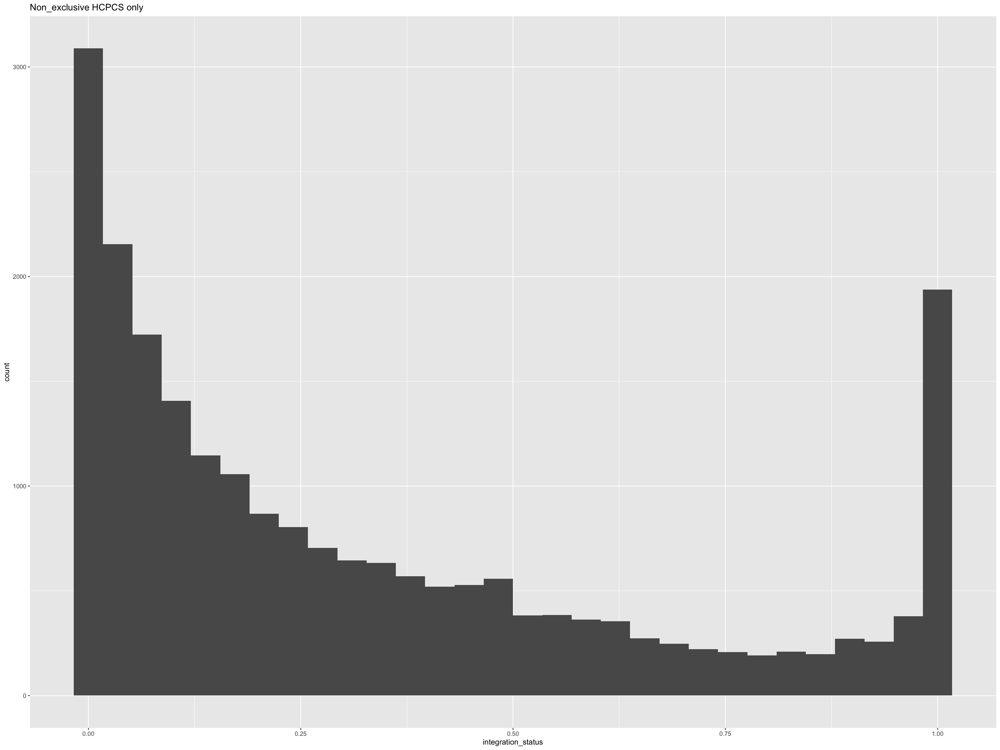

In [13]:
#ggplot(data=plot_data_specialist_avg)+geom_histogram(aes(x=integration_status))+ggtitle("all data")
#ggplot(data=plot_data_specialist_avg_visit)+geom_histogram(aes(x=integration_status))+ggtitle("visits only")
ggplot(data=plot_data_avg_non_exclusive_HCPCS)+geom_histogram(aes(x=integration_status))+ggtitle("Non_exclusive HCPCS only")


### Number of cardiologists that are interventional vs medical

In [20]:
table(yearly_calculations_stable_angina$most_common_cardiologist_PRVDR_SPCLTY)%>%prop.table()


       06        C3 
0.9867085 0.0132915 

So, we will only focus on the medical cardiologists.

## Comparison functions using non-exclusive HCPCS codes

This function is the main function to compare the intensity of care.

### Based on months integrated

In [9]:
intensity_comparator_month_based=function(data, specialty, threshold="05", integration_threshold=0.6, independece_threshold=0.4){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_prp_in_year_of_diagnosis_",threshold,"_non_exclusive_HCPCS",sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=
      case_when(!!rlang::sym(varname)<=independece_threshold ~ paste("Independent ",specialty,sep=""),
                !!rlang::sym(varname)>=integration_threshold ~ paste("Integrated ",specialty,sep=""),
                !!rlang::sym(varname)>independece_threshold &
                !!rlang::sym(varname)<integration_threshold ~ paste("Switching ",specialty,sep=""),
                TRUE ~ paste("Missing ",specialty,sep="")
               )) %>%
    group_by(integration_status)%>%
    summarise(
      n=n(),
      distinct_specialist=length(unique(!!rlang::sym(looking_for))),
      total_exp=sum(na.rm=T,total_exp)/n(),
      tot_allowed_inpatient=sum(na.rm=T,tot_allowed_inpatient)/n(),
      tot_allowed_outpatient=sum(na.rm=T,tot_allowed_outpatient)/n(),
      tot_allowed_carrier=sum(na.rm=T,tot_allowed_carrier)/n(),
      office_visit_count=sum(na.rm=T,office_visit_count)/n(),
      cardiology_visit_count=sum(na.rm=T,cardiology_visit_count)/n(),
      distinct_clinicians=sum(na.rm=T,distinct_clinicians)/n(),
      stable_angina=sum(na.rm=T,stable_angina)/n(),
      unstable_angina=sum(na.rm=T,unstable_angina)/n(),
      MI=sum(na.rm=T,MI)/n(),
      cardiac_arrest=sum(na.rm=T,cardiac_arrest)/n(),
      stroke=sum(na.rm=T,stroke)/n(),
      died_in_one_year_after_diagnosis=sum(na.rm=T,died_in_one_year_after_diagnosis)/n(),
      died_in_two_years_after_diagnosis=sum(na.rm=T,died_in_two_years_after_diagnosis)/n(),
      mean_weighted_charlson=mean(wscore,na.rm=T),
      number_of_hospitalizations=sum(na.rm=T,number_of_hospitalizations)/n(),
      hospitalized_patients=sum(na.rm=T,was_hospitalized)/n(),
      cheap_prcdr=sum(na.rm=T,tot_cheap_prcdr>0)/n(),
      cheap_prcdr_count=sum(na.rm=T,tot_cheap_prcdr)/n(),
      expensive_prcdr=sum(na.rm=T,tot_expensive_prcdr>0)/n(),
      expensive_prcdr_count=sum(na.rm=T,tot_expensive_prcdr)/n(),
      catheterization=sum(na.rm=T,catheterization_count>0)/n(),
      catheterization_count=sum(na.rm=T,catheterization_count)/n(),
      catheterization_cost=sum(na.rm=T,catheterization_cost)/n(),
      ecg=sum(na.rm=T,ecg_count>0)/n(),
      ecg_count=sum(na.rm=T,ecg_count)/n(),
      ecg_cost=sum(na.rm=T,ecg_cost)/n(),
      cardiac_ct=sum(na.rm=T,cardiac_ct_count>0)/n(),
      cardiac_ct_count=sum(na.rm=T,cardiac_ct_count)/n(),
      cardiac_ct_cost=sum(na.rm=T,cardiac_ct_cost)/n(),
      cardiac_mri=sum(na.rm=T,cardiac_mri_count>0)/n(),
      cardiac_mri_count=sum(na.rm=T,cardiac_mri_count)/n(),
      cardiac_mri_cost=sum(na.rm=T,cardiac_mri_cost)/n(),
      stress_test=sum(na.rm=T,stress_test_count>0)/n(),
      stress_test_count=sum(na.rm=T,stress_test_count)/n(),
      stress_test_cost=sum(na.rm=T,stress_test_cost)/n(),
      echocardiography=sum(na.rm=T,echocardiography_count>0)/n(),
      echocardiography_count=sum(na.rm=T,echocardiography_count)/n(),
      echocardiography_cost=sum(na.rm=T,echocardiography_cost)/n(),
      angioplasty=sum(na.rm=T,angioplasty_count>0)/n(),
      angioplasty_count=sum(na.rm=T,angioplasty_count)/n(),
      angioplasty_cost=sum(na.rm=T,angioplasty_cost)/n(),
      CABG=sum(na.rm=T,CABG_count>0)/n(),
      CABG_count=sum(na.rm=T,CABG_count)/n(),
      CABG_cost=sum(na.rm=T,CABG_cost)/n()
    )%>%
    as.data.table()
  
  return(result)
}

### Based on weighted averages of integration in year after diagnosis

In [624]:
head(yearly_calculations_stable_angina)
write.csv(yearly_calculations_stable_angina,"./results_may/stable_data_clean.csv")

DESY_SORT_KEY,first_diagnosis,tot_allowed_carrier,office_visit_count,office_visit_cost_carrier,cardiology_visit_count,distinct_clinicians,distinct_cardiologists,distinct_primary_care_physicians,distinct_surgeons,distinct_other_specialties,catheterization_count,catheterization_cost_carrier,ecg_count,ecg_cost_carrier,cardiac_ct_count,cardiac_ct_cost_carrier,cardiac_mri_count,cardiac_mri_cost_carrier,stress_test_count,stress_test_cost_carrier,echocardiography_count,echocardiography_cost_carrier,angioplasty_count,angioplasty_cost_carrier,CABG_count,CABG_cost_carrier,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,hypertension,copd,obesity,depression,diabetes,icd_9_pure,icd_10_pure,catheterization_date,angioplasty_date,catheterization_doc_NPI,angioplasty_doc_NPI,diagnosing_doc_NPI,year_first_diagnosed,time_difference_angio_cath,angioplasty_with_cath,angioplasty_during_year_after_cath,tot_allowed_carrier_cardiology_related,office_visit_count_cardiology_related,office_visit_cost_carrier_cardiology_related,cardiology_visit_count_cardiology_related,distinct_clinicians_cardiology_related,distinct_cardiologists_cardiology_related,distinct_primary_care_physicians_cardiology_related,distinct_surgeons_cardiology_related,distinct_other_specialties_cardiology_related,catheterization_count_cardiology_related,catheterization_cost_carrier_cardiology_related,ecg_count_cardiology_related,ecg_cost_carrier_cardiology_related,cardiac_ct_count_cardiology_related,cardiac_ct_cost_carrier_cardiology_related,cardiac_mri_count_cardiology_related,cardiac_mri_cost_carrier_cardiology_related,stress_test_count_cardiology_related,stress_test_cost_carrier_cardiology_related,echocardiography_count_cardiology_related,echocardiography_cost_carrier_cardiology_related,angioplasty_count_cardiology_related,angioplasty_cost_carrier_cardiology_related,CABG_count_cardiology_related,CABG_cost_carrier_cardiology_related,office_visit_cost_outpatient,catheterization_cost_outpatient,ecg_cost_outpatient,cardiac_ct_cost_outpatient,cardiac_mri_cost_outpatient,stress_test_cost_outpatient,echocardiography_cost_outpatient,angioplasty_cost_outpatient,CABG_cost_outpatient,office_visit_cost_outpatient_cardiology_related,catheterization_cost_outpatient_cardiology_related,ecg_cost_outpatient_cardiology_related,cardiac_ct_cost_outpatient_cardiology_related,cardiac_mri_cost_outpatient_cardiology_related,stress_test_cost_outpatient_cardiology_related,echocardiography_cost_outpatient_cardiology_related,angioplasty_cost_outpatient_cardiology_related,CABG_cost_outpatient_cardiology_related,office_visit_cost,catheterization_cost,ecg_cost,cardiac_ct_cost,cardiac_mri_cost,stress_test_cost,echocardiography_cost,angioplasty_cost,CABG_cost,office_visit_cost_cardiology_related,catheterization_cost_cardiology_related,ecg_cost_cardiology_related,cardiac_ct_cost_cardiology_related,cardiac_mri_cost_cardiology_related,stress_test_cost_cardiology_related,echocardiography_cost_cardiology_related,angioplasty_cost_cardiology_related,CABG_cost_cardiology_related,tot_cheap_prcdr_cost,tot_expensive_prcdr_cost,tot_cheap_prcdr_cost_cardiology_related,tot_expensive_prcdr_cost_cardiology_related,tot_cheap_prcdr_count,tot_expensive_prcdr_count,tot_cheap_prcdr_count_cardiology_related,tot_expensive_prcdr_count_cardiology_related,REFERENCE_YEAR_2013,STATE_CODE_2013,COUNTY_CODE_2013,SEX_CODE_2013,RACE_CODE_2013,AGE_2013,ORIG_REASON_FOR_ENTITLEMENT_2013,CURR_REASON_FOR_ENTITLEMENT_2013,ENTITLEMENT_BUY_IN_IND01_2013,ENTITLEMENT_BUY_IN_IND02_2013,ENTITLEMENT_BUY_IN_IND03_2013,ENTITLEMENT_BUY_IN_IND04_2013,ENTITLEMENT_BUY_IN_IND05_2013,ENTITLEMENT_BUY_IN_IND06_2013,ENTITLEMENT_BUY_IN_IND07_2013,ENTITLEMENT_BUY_IN_IND08_2013,ENTITLEMENT_BUY_IN_IND09_2013,ENTITLEMENT_BUY_IN_IND10_2013,ENTITLEMENT_BUY_IN_IND11_2013,ENTITLEMENT_BUY_IN_IND12_2013,HMO_INDICATOR01_2013,HMO_INDICATOR02_2013,HMO_INDICATOR03_2013,HMO_INDICATOR04_2013,HMO_INDICATOR05_2013,HMO_INDICATOR06_2013,HMO_INDICATOR07_2013,HMO_INDICATOR08_2013,HMO_INDICA

In [611]:
intensity_comparator_averages=function(data, specialty, integration_threshold=0.75, independece_threshold=0.75){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_avg_in_year_of_diagnosis_non_exclusive_HCPCS",sep="")
  looking_for=paste(specialty,"_PRF_PHYSN_NPI",sep="")
  
      
  result=data%>%
    mutate(
    integration_status=
      case_when(!!rlang::sym(varname)<independece_threshold ~ paste("Independent ",specialty,sep=""),
                !!rlang::sym(varname)>=integration_threshold ~ paste("Integrated ",specialty,sep=""),
                !!rlang::sym(varname)>independece_threshold &
                !!rlang::sym(varname)<integration_threshold ~ paste("Switching ",specialty,sep=""),
                TRUE ~ paste("Missing ",specialty,sep="")
               ),
    ) %>%
  
    group_by(integration_status)%>%
    summarise(
      n=n(),
      N_distinct_patients=length(unique(DESY_SORT_KEY)),
      N_distinct_specialist=length(unique(!!rlang::sym(looking_for))),
      Male=mean(sex=="Male",na.rm=T),
      Female=mean(sex=="Female",na.rm=T),
      Asian=mean(race=="Asian",na.rm=T),
      Black=mean(race=="Black",na.rm=T),
      Hispanic=mean(race=="Hispanic",na.rm=T),
      North_American_Native=mean(race=="North American Native",na.rm=T),
      White=mean(race=="White",na.rm=T),
      Other=mean(race=="Other",na.rm=T),
      avg_age=mean(age_at_diagnosis,na.rm=T),
      age_65_74=mean(na.rm=T,age_group=="65-74"),
      age_75_84=mean(na.rm=T,age_group=="75-84"),
      age_85_plus=mean(na.rm=T,age_group=="85+"),
      West=mean(na.rm=T,census_region=="West"),
      South=mean(na.rm=T,census_region=="South"),
      Northeast=mean(na.rm=T,census_region=="Northeast"),
      Midwest=mean(na.rm=T,census_region=="Midwest"),
      
      rural_prp=mean(RUCC_2013>3,na.rm = T),
      urban_prp=mean(RUCC_2013<=3,na.rm = T),
      
      year_of_diagnsosis_2014=mean(na.rm=T,year_first_diagnosed=="2014"),
      year_of_diagnsosis_2015=mean(na.rm=T,year_first_diagnosed=="2015"),
      year_of_diagnsosis_2016=mean(na.rm=T,year_first_diagnosed=="2016"),
      year_of_diagnsosis_2017=mean(na.rm=T,year_first_diagnosed=="2017"),
      year_of_diagnsosis_2018=mean(na.rm=T,year_first_diagnosed=="2018"),
      year_of_diagnsosis_2019=mean(na.rm=T,year_first_diagnosed=="2019"),
      Hypertension=sum(hypertension,na.rm=T)/n(),
      COPD=sum(copd,na.rm=T)/n(),
      Obesity=sum(obesity,na.rm=T)/n(),
      Depression=sum(depression,na.rm=T)/n(),
      Diabetes=sum(diabetes,na.rm=T)/n(),
      mean_weighted_charlson=mean(wscore,na.rm=T),
      primary_care_physician_integrated=
      sum(most_common_primary_care_physician_avg_in_year_of_diagnosis_non_exclusive_HCPCS>=integration_threshold,na.rm=T)/n(),
      distinct_clinicians=sum(na.rm=T,distinct_clinicians)/n(),
      distinct_cardiologists=sum(na.rm=T,distinct_cardiologists)/n(),
      distinct_primary_care_physicians=sum(na.rm=T,distinct_primary_care_physicians)/n(),
      distinct_surgeons=sum(na.rm=T,distinct_surgeons)/n(),
      distinct_other_specialties=sum(na.rm=T,distinct_other_specialties)/n(),
      total_exp=sum(na.rm=T,total_exp)/n(),
      tot_allowed_inpatient=sum(na.rm=T,tot_allowed_inpatient)/n(),
      tot_allowed_outpatient=sum(na.rm=T,tot_allowed_outpatient)/n(),
      tot_allowed_carrier=sum(na.rm=T,tot_allowed_carrier)/n(),
      cheap_prcdr_cost=sum(na.rm=T,tot_cheap_prcdr_cost)/n(),
      expensive_prcdr_cost=sum(na.rm=T,tot_expensive_prcdr_cost)/n(),  
      #stable_angina=sum(na.rm=T,stable_angina)/n(),
      unstable_angina=sum(na.rm=T,unstable_angina)/n(),
      MI_prp=sum(na.rm=T,MI)/n(),
      cardiac_arrest=sum(na.rm=T,cardiac_arrest)/n(),
      stroke=sum(na.rm=T,stroke)/n(),
      died_in_one_year_after_diagnosis=sum(na.rm=T,died_in_one_year_after_diagnosis)/n(),
      died_in_two_years_after_diagnosis=sum(na.rm=T,died_in_two_years_after_diagnosis)/n(),
      number_of_hospitalizations=sum(na.rm=T,number_of_hospitalizations)/n(),
      hospitalized_patients=sum(na.rm=T,was_hospitalized)/n(),
      #cheap_prcdr=sum(na.rm=T,tot_cheap_prcdr_count>0)/n(),
      cardiology_visit=sum(na.rm=T,cardiology_visit_count>0)/n(),      
      stress_test=sum(na.rm=T,stress_test_count>0)/n(),
      echocardiography=sum(na.rm=T,echocardiography_count>0)/n(),
      office_visit_count=sum(na.rm=T,office_visit_count)/n(),
      cheap_prcdr_count=sum(na.rm=T,tot_cheap_prcdr_count)/n(),
      cardiology_visit_count=sum(na.rm=T,cardiology_visit_count)/n(),
      stress_test_count=sum(na.rm=T,stress_test_count)/n(),
      echocardiography_count=sum(na.rm=T,echocardiography_count)/n(),
      expensive_prcdr=sum(na.rm=T,tot_expensive_prcdr_count>0)/n(),
      catheterization=sum(na.rm=T,catheterization_count>0)/n(),
      cardiac_ct=sum(na.rm=T,cardiac_ct_count>0)/n(),
      angioplasty=sum(na.rm=T,angioplasty_count>0)/n(),
      expensive_prcdr_count=sum(na.rm=T,tot_expensive_prcdr_count)/n(),
      catheterization_count=sum(na.rm=T,catheterization_count)/n(),
      
      angioplasty_during_year_after_cath_prp=mean(angioplasty_during_year_after_cath,na.rm=T),
      angioplasty_at_time_of_cath_prp=mean(angioplasty_with_cath,na.rm=T),
      
      angioplasty_during_year_after_cath_no_MI_prp=mean(angioplasty_during_year_after_cath*(MI==F),na.rm=T),
      angioplasty_at_time_of_cath_no_MI_prp=mean(angioplasty_with_cath*(MI==F),na.rm=T),
      
      
      
      cardiac_ct_count=sum(na.rm=T,cardiac_ct_count)/n(),
      angioplasty_count=sum(na.rm=T,angioplasty_count)/n(),
      catheterization_cost=sum(na.rm=T,catheterization_cost)/n(),
      ecg=sum(na.rm=T,ecg_count>0)/n(),
      ecg_count=sum(na.rm=T,ecg_count)/n(),
      ecg_cost=sum(na.rm=T,ecg_cost)/n(),
      cardiac_ct_cost=sum(na.rm=T,cardiac_ct_cost)/n(),
      cardiac_mri=sum(na.rm=T,cardiac_mri_count>0)/n(),
      cardiac_mri_count=sum(na.rm=T,cardiac_mri_count)/n(),
      cardiac_mri_cost=sum(na.rm=T,cardiac_mri_cost)/n(),
      stress_test_cost=sum(na.rm=T,stress_test_cost)/n(),
      echocardiography_cost=sum(na.rm=T,echocardiography_cost)/n(),
      angioplasty_cost=sum(na.rm=T,angioplasty_cost)/n(),
      CABG=sum(na.rm=T,CABG_count>0)/n(),
      CABG_count=sum(na.rm=T,CABG_count)/n(),
      CABG_cost=sum(na.rm=T,CABG_cost)/n(),
      
      cardiologist_male_prp=mean(cardiologist_gndr=="M",na.rm = T),
      cardiologist_female_prp=mean(cardiologist_gndr=="F",na.rm = T),
      cardiologist_experience=mean(cardiologist_experience_at_diagnosis,na.rm = T)
    )%>%
    as.data.table()
  
  return(result)
}



## Comparison tests functions

This function is the main function to compare the intensity of care with T tests and chi square tests.

### Based on months integrated

In [16]:
intensity_comparator_t_test_month_based=function(data, specialty, threshold="05", integration_threshold=0.6, independece_threshold=0.4){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_prp_in_year_of_diagnosis_",threshold,"_non_exclusive_HCPCS",sep="")
  looking_for=paste("most_common_",specialty,"_PRF_PHYSN_NPI",sep="")
  p_and_cnfint=c("p.value","conf.int")
  
  result=data%>%
    filter(state_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
          )%>%
    mutate(
      integration_status=
      case_when(!!rlang::sym(varname)<=independece_threshold ~ paste("Independent ",specialty,sep=""),
                !!rlang::sym(varname)>=integration_threshold ~ paste("Integrated ",specialty,sep="")
               )) %>%
    summarise(
      total_exp=t.test(total_exp~integration_status, data=.)$p.value,
      tot_allowed_inpatient=t.test(tot_allowed_inpatient~integration_status, data=.)$p.value,
      tot_allowed_outpatient=t.test(tot_allowed_outpatient~integration_status, data=.)$p.value,
      tot_allowed_carrier=t.test(tot_allowed_carrier~integration_status, data=.)$p.value,
      office_visit_count=t.test(office_visit_count~integration_status, data=.)$p.value,
      cardiology_visit_count=t.test(cardiology_visit_count~integration_status, data=.)$p.value,
      distinct_clinicians=t.test(distinct_clinicians~integration_status, data=.)$p.value,
      #stable_angina=t.test(stable_angina~integration_status, data=.)$p.value,
      #unstable_angina=t.test(unstable_angina~integration_status, data=.)$p.value,
      MI=chisq.test(MI,integration_status)$p.value,
      cardiac_arrest=chisq.test(cardiac_arrest,integration_status)$p.value,
      stroke=chisq.test(stroke,integration_status)$p.value,
      died_in_one_year_after_diagnosis=chisq.test(died_in_one_year_after_diagnosis,integration_status)$p.value,
      died_in_two_years_after_diagnosis=chisq.test(died_in_two_years_after_diagnosis,integration_status)$p.value,
      mean_weighted_charlson=t.test(wscore~integration_status, data=.)$p.value,
      number_of_hospitalizations=t.test(number_of_hospitalizations~integration_status, data=.)$p.value,
      hospitalized_patients=t.test(was_hospitalized~integration_status, data=.)$p.value,
      cheap_prcdr=chisq.test(tot_cheap_prcdr>0,integration_status)$p.value,
      cheap_prcdr_count=t.test(tot_cheap_prcdr~integration_status, data=.)$p.value,
      expensive_prcdr=chisq.test(tot_expensive_prcdr>0,integration_status)$p.value,
      expensive_prcdr_count=t.test(tot_expensive_prcdr~integration_status, data=.)$p.value,
      catheterization=chisq.test(catheterization_count>0,integration_status)$p.value,
      catheterization_count=t.test(catheterization_count~integration_status, data=.)$p.value,
      catheterization_cost=t.test(catheterization_cost~integration_status, data=.)$p.value,
      ecg=chisq.test(ecg_count>0,integration_status)$p.value,
      ecg_count=t.test(ecg_count~integration_status, data=.)$p.value,
      ecg_cost=t.test(ecg_cost~integration_status, data=.)$p.value,
      cardiac_ct=chisq.test(cardiac_ct_count>0,integration_status)$p.value,
      cardiac_ct_count=t.test(cardiac_ct_count~integration_status, data=.)$p.value,
      cardiac_ct_cost=t.test(cardiac_ct_cost~integration_status, data=.)$p.value,
      cardiac_mri=chisq.test(cardiac_mri_count>0,integration_status)$p.value,
      cardiac_mri_count=t.test(cardiac_mri_count~integration_status, data=.)$p.value,
      cardiac_mri_cost=t.test(cardiac_mri_cost~integration_status, data=.)$p.value,
      stress_test=chisq.test(stress_test_count>0,integration_status)$p.value,
      stress_test_count=t.test(stress_test_count~integration_status, data=.)$p.value,
      stress_test_cost=t.test(stress_test_cost~integration_status, data=.)$p.value,
      echocardiography=chisq.test(echocardiography_count>0,integration_status)$p.value,
      echocardiography_count=t.test(echocardiography_count~integration_status, data=.)$p.value,
      echocardiography_cost=t.test(echocardiography_cost~integration_status, data=.)$p.value,
      angioplasty=chisq.test(angioplasty_count>0,integration_status)$p.value,
      angioplasty_count=t.test(angioplasty_count~integration_status, data=.)$p.value,
      angioplasty_cost=t.test(angioplasty_cost~integration_status, data=.)$p.value,
      CABG=chisq.test(CABG_count>0,integration_status)$p.value,
      CABG_count=t.test(CABG_count~integration_status, data=.)$p.value,
      CABG_cost=t.test(CABG_cost~integration_status, data=.)$p.value
    )%>%
    as.data.table()
  return(as.data.table(result))
}

### Based on weighted averages of integration in year after diagnosis

In [618]:
intensity_comparator_t_test_averages=function(data, specialty, integration_threshold=0.75, independece_threshold=0.75){
  
  require(tidyverse)
  require(dtplyr)
  varname=paste(specialty,"_avg_in_year_of_diagnosis_non_exclusive_HCPCS",sep="")
  looking_for=paste(specialty,"_PRF_PHYSN_NPI",sep="")
      
  result=data%>%
    mutate(
    integration_status=
      case_when(!!rlang::sym(varname)<independece_threshold ~ paste("Independent ",specialty,sep=""),
                !!rlang::sym(varname)>=integration_threshold ~ paste("Integrated ",specialty,sep="")
               )) %>%
    summarise(      
      Male=chisq.test(sex=="Male",integration_status)$p.value,
      Female=chisq.test(sex=="Female",integration_status)$p.value,
      Asian=chisq.test(race=="Asian",integration_status)$p.value,
      Black=chisq.test(race=="Black",integration_status)$p.value,
      Hispanic=chisq.test(race=="Hispanic",integration_status)$p.value,
      North_American_Native=chisq.test(race=="North American Native",integration_status)$p.value,
      White=chisq.test(race=="White",integration_status)$p.value,
      Other=chisq.test(race=="Other",integration_status)$p.value,
      avg_age=chisq.test(age_at_diagnosis,integration_status)$p.value,
      age_65_74=chisq.test(age_group=="65-74",integration_status)$p.value,
      age_75_84=chisq.test(age_group=="75-84",integration_status)$p.value,
      age_85_plus=chisq.test(age_group=="85+",integration_status)$p.value,
      West=chisq.test(census_region=="West",integration_status)$p.value,
      South=chisq.test(census_region=="South",integration_status)$p.value,
      Northeast=chisq.test(census_region=="Northeast",integration_status)$p.value,
      Midwest=chisq.test(census_region=="Midwest",integration_status)$p.value,
      
      rural_prp=chisq.test(RUCC_2013>3,integration_status)$p.value,
      urban_prp=chisq.test(RUCC_2013<=3,integration_status)$p.value,
      
      year_of_diagnsosis_2014=chisq.test(year_first_diagnosed=="2014",integration_status)$p.value,
      year_of_diagnsosis_2015=chisq.test(year_first_diagnosed=="2015",integration_status)$p.value,
      year_of_diagnsosis_2016=chisq.test(year_first_diagnosed=="2016",integration_status)$p.value,
      year_of_diagnsosis_2017=chisq.test(year_first_diagnosed=="2017",integration_status)$p.value,
      year_of_diagnsosis_2018=chisq.test(year_first_diagnosed=="2018",integration_status)$p.value,
      year_of_diagnsosis_2019=chisq.test(year_first_diagnosed=="2019",integration_status)$p.value,
      Hypertension=chisq.test(hypertension,integration_status)$p.value,
      COPD=chisq.test(copd,integration_status)$p.value,
      Obesity=chisq.test(obesity,integration_status)$p.value,
      Depression=chisq.test(depression,integration_status)$p.value,
      Diabetes=chisq.test(diabetes,integration_status)$p.value,
      mean_weighted_charlson=t.test(wscore~integration_status, data=.)$p.value,
      primary_care_physician_integrated=
      chisq.test(most_common_primary_care_physician_avg_in_year_of_diagnosis_non_exclusive_HCPCS>=integration_threshold
                 ,integration_status)$p.value,
      distinct_clinicians=t.test(distinct_clinicians~integration_status, data=.)$p.value,
      distinct_cardiologists=t.test(distinct_cardiologists~integration_status, data=.)$p.value,
      distinct_primary_care_physicians=t.test(distinct_primary_care_physicians~integration_status, data=.)$p.value,
      distinct_surgeons=t.test(distinct_surgeons~integration_status, data=.)$p.value,
      distinct_other_specialties=t.test(distinct_other_specialties~integration_status, data=.)$p.value,
      total_exp=t.test(total_exp~integration_status, data=.)$p.value,
      tot_allowed_inpatient=t.test(tot_allowed_inpatient~integration_status, data=.)$p.value,
      tot_allowed_outpatient=t.test(tot_allowed_outpatient~integration_status, data=.)$p.value,
      tot_allowed_carrier=t.test(tot_allowed_carrier~integration_status, data=.)$p.value,
      cheap_prcdr_cost=t.test(tot_cheap_prcdr_cost~integration_status, data=.)$p.value,
      expensive_prcdr_cost=t.test(tot_expensive_prcdr_cost~integration_status, data=.)$p.value,
      number_of_hospitalizations=t.test(number_of_hospitalizations~integration_status, data=.)$p.value,
      hospitalized_patients=t.test(was_hospitalized~integration_status, data=.)$p.value,
      #cheap_prcdr=chisq.test(tot_cheap_prcdr_count>0,integration_status)$p.value,
      cardiology_visit=chisq.test(cardiology_visit_count>0,integration_status)$p.value,
      stress_test=chisq.test(stress_test_count>0,integration_status)$p.value,
      echocardiography=chisq.test(echocardiography_count>0,integration_status)$p.value,
      cheap_prcdr_count=t.test(tot_cheap_prcdr_count~integration_status, data=.)$p.value,
      cardiology_visit_count=t.test(cardiology_visit_count~integration_status, data=.)$p.value,
      stress_test_count=t.test(stress_test_count~integration_status, data=.)$p.value,
      echocardiography_count=t.test(echocardiography_count~integration_status, data=.)$p.value,
      expensive_prcdr=chisq.test(tot_expensive_prcdr_count>0,integration_status)$p.value,
      catheterization=chisq.test(catheterization_count>0,integration_status)$p.value,
      cardiac_ct=chisq.test(cardiac_ct_count>0,integration_status)$p.value,
      angioplasty=chisq.test(angioplasty_count>0,integration_status)$p.value,
      expensive_prcdr_count=t.test(tot_expensive_prcdr_count~integration_status, data=.)$p.value,
      catheterization_count=t.test(catheterization_count~integration_status, data=.)$p.value,
      
      angioplasty_during_year_after_cath_prp=chisq.test(angioplasty_during_year_after_cath,integration_status)$p.value,
      angioplasty_at_time_of_cath_prp=chisq.test(angioplasty_with_cath,integration_status)$p.value,
      
      angioplasty_during_year_after_cath_no_MI_prp=chisq.test(angioplasty_during_year_after_cath*(MI==F),integration_status)$p.value,
      angioplasty_at_time_of_cath_no_MI_prp=chisq.test(angioplasty_with_cath*(MI==F),integration_status)$p.value,
      
      cardiac_ct_count=t.test(cardiac_ct_count~integration_status, data=.)$p.value,
      angioplasty_count=t.test(angioplasty_count~integration_status, data=.)$p.value,
      catheterization_cost=t.test(catheterization_cost~integration_status, data=.)$p.value,
      office_visit_count=t.test(office_visit_count~integration_status, data=.)$p.value,
      #stable_angina=t.test(stable_angina~integration_status, data=.)$p.value,
      unstable_angina=t.test(unstable_angina~integration_status, data=.)$p.value,
      MI_prp=chisq.test(MI,integration_status)$p.value,
      cardiac_arrest=chisq.test(cardiac_arrest,integration_status)$p.value,
      stroke=chisq.test(stroke,integration_status)$p.value,
      died_in_one_year_after_diagnosis=chisq.test(died_in_one_year_after_diagnosis,integration_status)$p.value,
      died_in_two_years_after_diagnosis=chisq.test(died_in_two_years_after_diagnosis,integration_status)$p.value,
      ecg=chisq.test(ecg_count>0,integration_status)$p.value,
      ecg_count=t.test(ecg_count~integration_status, data=.)$p.value,
      ecg_cost=t.test(ecg_cost~integration_status, data=.)$p.value,
      cardiac_ct_cost=t.test(cardiac_ct_cost~integration_status, data=.)$p.value,
      cardiac_mri=chisq.test(cardiac_mri_count>0,integration_status)$p.value,
      cardiac_mri_count=t.test(cardiac_mri_count~integration_status, data=.)$p.value,
      cardiac_mri_cost=t.test(cardiac_mri_cost~integration_status, data=.)$p.value,
      stress_test_cost=t.test(stress_test_cost~integration_status, data=.)$p.value,
      echocardiography_cost=t.test(echocardiography_cost~integration_status, data=.)$p.value,
      angioplasty_cost=t.test(angioplasty_cost~integration_status, data=.)$p.value,
      CABG=chisq.test(CABG_count>0,integration_status)$p.value,
      CABG_count=t.test(CABG_count~integration_status, data=.)$p.value,
      CABG_cost=t.test(CABG_cost~integration_status, data=.)$p.value,
      
      cardiologist_male_prp=chisq.test(cardiologist_gndr=="M",integration_status)$p.value,
      cardiologist_female_prp=chisq.test(cardiologist_gndr=="F",integration_status)$p.value,
      cardiologist_experience=t.test(cardiologist_experience_at_diagnosis~integration_status, data=.)$p.value
    )%>%
    as.data.table()
  return(as.data.table(result))
}

## Running the comparisons

### Stable angina comparisons

#### Months based

##### comparisons

In [30]:
stable_angina_physician_comparisons_05_prp_from_months=
intensity_comparator_month_based(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"physician",threshold="05")

stable_angina_primary_care_physician_comparisons_05_prp_from_months=
intensity_comparator_month_based(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"primary_care_physician",threshold="05")

stable_angina_cardiologist_comparisons_05_prp_from_months=
intensity_comparator_month_based(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="05")

stable_angina_interventional_cardiologist_comparisons_05_prp_from_months=
intensity_comparator_month_based(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"interventional_cardiologist",threshold="05")

##### T tests

In [31]:
t_test_stable_angina_physician_comparisons_05_prp_from_months=
intensity_comparator_t_test_month_based(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"physician",threshold="05")

t_test_stable_angina_primary_care_physician_comparisons_05_prp_from_months=
intensity_comparator_t_test_month_based(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"primary_care_physician",threshold="05")

t_test_stable_angina_cardiologist_comparisons_05_prp_from_months=
intensity_comparator_t_test_month_based(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="05")

t_test_stable_angina_interventional_cardiologist_comparisons_05_prp_from_months=
intensity_comparator_t_test_month_based(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"interventional_cardiologist",threshold="05")

##### Combining the comparisons and t-tests

In [32]:
comparison_results_stable_angina_05_prp_from_months=rbind(
  stable_angina_physician_comparisons_05_prp_from_months,
  t_test_stable_angina_physician_comparisons_05_prp_from_months,
  stable_angina_primary_care_physician_comparisons_05_prp_from_months,
  t_test_stable_angina_primary_care_physician_comparisons_05_prp_from_months,
  stable_angina_cardiologist_comparisons_05_prp_from_months,
  t_test_stable_angina_cardiologist_comparisons_05_prp_from_months,
  stable_angina_interventional_cardiologist_comparisons_05_prp_from_months,
  t_test_stable_angina_interventional_cardiologist_comparisons_05_prp_from_months,
  fill=TRUE
)

In [33]:
comparison_results_stable_angina_05_prp_from_months

integration_status,n,distinct_specialist,total_exp,tot_allowed_inpatient,tot_allowed_outpatient,tot_allowed_carrier,office_visit_count,cardiology_visit_count,distinct_clinicians,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,died_in_one_year_after_diagnosis,died_in_two_years_after_diagnosis,mean_weighted_charlson,number_of_hospitalizations,hospitalized_patients,cheap_prcdr,cheap_prcdr_count,expensive_prcdr,expensive_prcdr_count,catheterization,catheterization_count,catheterization_cost,ecg,ecg_count,ecg_cost,cardiac_ct,cardiac_ct_count,cardiac_ct_cost,cardiac_mri,cardiac_mri_count,cardiac_mri_cost,stress_test,stress_test_count,stress_test_cost,echocardiography,echocardiography_count,echocardiography_cost,angioplasty,angioplasty_count,angioplasty_cost,CABG,CABG_count,CABG_cost
<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Independent physician,14716,13224,1.191790e+05,5.712664e+04,5.469896e+04,7.353350e+03,1.378024e+01,2.243884e+00,2.023070e+01,1,0.077466703,8.052460e-02,0.011484099,0.04763523,4.620821e-02,0.094047295,2.1534180580,8.674912e-01,4.343572e-01,0.95494700,6.790704e+00,3.551237e-01,6.877548e-01,3.355531e-01,4.033705e-01,1.059903e+02,0.791519435,3.077806e+00,3.296330e+01,0.015765154,0.017531938,2.492115e+00,2.854036e-03,0.004077195,0.562529899,0.30252786,5.133188e-01,1.486490e+01,5.194346e-01,9.556945e-01,9.125641e+01,1.168796e-01,2.005300e-01,8.233741e+01,3.737429e-02,0.0622451753,7.493232e+01
Integrated physician,1969,1836,1.486681e+05,7.637503e+04,6.661640e+04,5.676665e+03,1.075978e+01,1.884713e+00,2.169782e+01,1,0.098527171,1.137633e-01,0.012696800,0.04621635,7.059421e-02,0.113763332,2.1229656420,1.109700e+00,5.241239e-01,0.95479939,7.265109e+00,4.128999e-01,9.497207e-01,3.936008e-01,5.154901e-01,1.207543e+02,0.810055866,3.544439e+00,3.200023e+01,0.013712544,0.015236160,1.356120e+00,7.110208e-03,0.010665312,0.940091417,0.30167598,5.916709e-01,1.117212e+01,5.688167e-01,1.244286e+00,7.626382e+01,1.681056e-01,3.143728e-01,1.205991e+02,5.891315e-02,0.0939563230,1.184870e+02
Missing physician,7022,2721,1.215112e+05,6.453443e+04,4.931236e+04,7.534607e+03,1.189690e+01,1.900741e+00,2.258602e+01,1,0.065935631,7.533466e-02,0.013956138,0.05425805,5.724865e-02,0.110509826,2.4136972015,9.712333e-01,4.545713e-01,0.94146967,6.443606e+00,2.875249e-01,5.304756e-01,2.647394e-01,3.204215e-01,8.570765e+01,0.794787810,3.153090e+00,3.320612e+01,0.018370835,0.019937340,2.919168e+00,2.990601e-03,0.003987468,0.521079465,0.26530903,4.485901e-01,1.272951e+01,5.061236e-01,9.411848e-01,9.117841e+01,8.373683e-02,1.378525e-01,5.699034e+01,2.833950e-02,0.0482768442,5.764264e+01
Switching physician,375,353,1.302146e+05,7.536742e+04,4.912958e+04,5.717617e+03,9.557333e+00,2.394667e+00,1.903733e+01,1,0.120000000,1.280000e-01,0.013333333,0.04000000,7.466667e-02,0.098666667,1.7632398754,9.520000e-01,4.933333e-01,0.96800000,7.877333e+00,4.933333e-01,1.186667e+00,4.826667e-01,6.800000e-01,1.588329e+02,0.826666667,3.701333e+00,3.719147e+01,0.018666667,0.021333333,1.989787e+00,2.666667e-03,0.002666667,0.341866667,0.31733333,6.320000e-01,1.238861e+01,5.333333e-01,1.149333e+00,7.874152e+01,1.920000e-01,3.680000e-01,1.518031e+02,6.666667e-02,0.1146666667,1.243819e+02
NA,NA,NA,4.594334e-06,4.065052e-06,1.849334e-03,9.770867e-21,4.439351e-42,2.319529e-10,8.265964e-04,NA,NA,7.876388e-07,0.719220969,0.82458828,3.347925e-06,0.003353355,0.5782332472,7.291882e-10,9.108768e-14,1.00000000,4.629372e-03,6.188874e-07,3.195233e-12,3.924021e-07,1.720387e-09,5.652555e-04,0.060195432,2.035631e-05,3.351560e-01,0.551918450,0.482715510,1.200304e-03,4.246292e-03,0.032247085,0.168728885,0.95919096,1.703679e-03,2.406537e-13,4.184852e-05,1.676309e-09,3.020841e-08,1.013883e-10,5.491355e-08,2.064542e-07,6.073587e-06,0.0007381674,1.322773

#### Weighted average based

##### comparisons

In [619]:
#stable_angina_physician_comparisons_averages=
#intensity_comparator_averages(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"physician", integration_threshold=0.5, independece_threshold=0.2)

#stable_angina_primary_care_physician_comparisons_averages=
#intensity_comparator_averages(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"primary_care_physician", integration_threshold=0.5, independece_threshold=0.2)

stable_angina_cardiologist_comparisons_averages=
intensity_comparator_averages(yearly_calculations_stable_angina,"most_common_cardiologist", integration_threshold=0.75, independece_threshold=0.75)

#stable_angina_interventional_cardiologist_comparisons_averages=
#intensity_comparator_averages(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"interventional_cardiologist", integration_threshold=0.5, independece_threshold=0.2)

In [620]:
stable_angina_cardiologist_comparisons_averages

integration_status,n,N_distinct_patients,N_distinct_specialist,Male,Female,Asian,Black,Hispanic,North_American_Native,White,Other,avg_age,age_65_74,age_75_84,age_85_plus,West,South,Northeast,Midwest,rural_prp,urban_prp,year_of_diagnsosis_2014,year_of_diagnsosis_2015,year_of_diagnsosis_2016,year_of_diagnsosis_2017,year_of_diagnsosis_2018,year_of_diagnsosis_2019,Hypertension,COPD,Obesity,Depression,Diabetes,mean_weighted_charlson,primary_care_physician_integrated,distinct_clinicians,distinct_cardiologists,distinct_primary_care_physicians,distinct_surgeons,distinct_other_specialties,total_exp,tot_allowed_inpatient,tot_allowed_outpatient,tot_allowed_carrier,cheap_prcdr_cost,expensive_prcdr_cost,unstable_angina,MI_prp,cardiac_arrest,stroke,died_in_one_year_after_diagnosis,died_in_two_years_after_diagnosis,number_of_hospitalizations,hospitalized_patients,cardiology_visit,stress_test,echocardiography,office_visit_count,cheap_prcdr_count,cardiology_visit_count,stress_test_count,echocardiography_count,expensive_prcdr,catheterization,cardiac_ct,angioplasty,expensive_prcdr_count,catheterization_count,angioplasty_during_year_after_cath_prp,angioplasty_at_time_of_cath_prp,angioplasty_during_year_after_cath_no_MI_prp,angioplasty_at_time_of_cath_no_MI_prp,cardiac_ct_count,angioplasty_count,catheterization_cost,ecg,ecg_count,ecg_cost,cardiac_ct_cost,cardiac_mri,cardiac_mri_count,cardiac_mri_cost,stress_test_cost,echocardiography_cost,angioplasty_cost,CABG,CABG_count,CABG_cost,cardiologist_male_prp,cardiologist_female_prp,cardiologist_experience
<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Independent most_common_cardiologist,13318,13318,7856,0.5077339,0.4922661,0.02177504,0.06697702,0.017344947,0.003153627,0.8634930,0.01636882,75.46328,0.5051810,0.3573359,0.1374831,0.1637115,0.4662660,0.1737791,0.1962434,0.2180789,0.7819211,0.2124944,0.1952996,0.1661661,0.1476948,0.1403364,0.1380087,0.6763778,0.2160234,0.02019823,0.05586424,0.3680733,2.352445,0.03746809,21.22886,2.942934,2.801171,1.617810,13.89082,115815.68,61571.43,46591.83,7652.418,2308.977,6552.131,0.08559844,0.09333233,0.01366572,0.05195975,0.06840366,0.1148070,0.8776093,0.4490164,0.9661361,0.3146118,0.5708815,14.24493,15.87048,3.022751,0.5226010,1.102943,0.3888722,0.3684487,0.01982280,0.1393603,0.7176753,0.4538970,0.1312509,0.1109776,0.0967863,0.08349602,0.02207539,0.2417030,3938.704,0.8298543,3.424538,386.2953,37.68204,0.002778195,0.00390449,4.996704,219.3897,726.6623,2575.745,0.04752966,0.07959153,96.02595,0.9254519,0.07454807,27.21097
Integrated most_common_cardiologist,1985,1985,1424,0.5425693,0.4574307,0.01360202,0.06750630,0.006549118,0.011083123,0.8695214,0.01561713,75.51637,0.4972292,0.3748111,0.1279597,0.1285282,0.3361895,0.1759073,0.3593750,0.2919010,0.7080990,0.1853904,0.1853904,0.1677582,0.1647355,0.1365239,0.1602015,0.5798489,0.1949622,0.01712846,0.05491184,0.3420655,2.199029,0.34458438,22.01411,3.505793,2.769270,1.571788,14.19244,113410.66,58997.34,48190.89,6222.434,2495.297,6828.032,0.08916877,0.11989924,0.01057935,0.04382872,0.06347607,0.1098237,0.9390428,0.4871537,0.9546599,0.2896725,0.5753149,13.07204,14.86902,2.436776,0.5722922,1.224685,0.4397985,0.4246851,0.01662469,0.1783375,0.8795970,0.5476071,0.1707809,0.1410579,0.1224181,0.09924433,0.01813602,0.3138539,3887.362,0.8287154,3.480605,460.7103,22.34272,0.007556675,0.01108312,15.585965,278.2793,1000.5424,2918.328,0.06095718,0.09823678,118.24155,0.8912809,0.10871905,25.41855
Missing most_common_cardiologist,6,6,6,0.3333333,0.6666

##### Tests

In [621]:
#t_test_stable_angina_physician_comparisons_averages=
#intensity_comparator_t_test_averages(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"physician")

#t_test_stable_angina_primary_care_physician_comparisons_averages=
#intensity_comparator_t_test_averages(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"primary_care_physician")

t_test_stable_angina_cardiologist_comparisons_averages=
intensity_comparator_t_test_averages(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"most_common_cardiologist", integration_threshold=0.75, independece_threshold=0.75)

#t_test_stable_angina_interventional_cardiologist_comparisons_averages=
#intensity_comparator_t_test_averages(yearly_calculations_stable_angina[year_first_diagnosed!=2013],"interventional_cardiologist")



Warning message in chisq.test(age_at_diagnosis, integration_status):
“Chi-squared approximation may be incorrect”


##### Combining the comparisons and t-tests

In [622]:
comparison_results_stable_angina_averages=rbind(
  #stable_angina_physician_comparisons_averages,
  #t_test_stable_angina_physician_comparisons_averages,
  #stable_angina_primary_care_physician_comparisons_averages,
  #t_test_stable_angina_primary_care_physician_comparisons_averages,
  stable_angina_cardiologist_comparisons_averages,
  t_test_stable_angina_cardiologist_comparisons_averages,
  #stable_angina_interventional_cardiologist_comparisons_averages,
  #t_test_stable_angina_interventional_cardiologist_comparisons_averages,
  fill=TRUE
)

In [623]:
t(comparison_results_stable_angina_averages[integration_status %in% c("Independent most_common_cardiologist","Integrated most_common_cardiologist",NA)])

integration_status,Independent most_common_cardiologist,Integrated most_common_cardiologist,NA
n,13318,1985,NA
N_distinct_patients,13318,1985,NA
N_distinct_specialist,7856,1424,NA
Male,0.50773389,0.54256927,0.00407162
Female,0.49226611,0.45743073,0.00407162
Asian,0.02177504,0.01360202,0.02141465
Black,0.06697702,0.06750630,0.96820602
Hispanic,0.0173449467,0.0065491184,0.0004899855
North_American_Native,3.153627e-03,1.108312e-02,8.628537e-07
White,0.8634930,0.8695214,0.4861482


### Unstable angina comparisons

#### Months based

##### comparisons

In [26]:
unstable_angina_physician_comparisons_05_prp_from_months=
intensity_comparator_month_based(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"physician",threshold="05")

unstable_angina_primary_care_physician_comparisons_05_prp_from_months=
intensity_comparator_month_based(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"primary_care_physician",threshold="05")

unstable_angina_cardiologist_comparisons_05_prp_from_months=
intensity_comparator_month_based(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="05")

unstable_angina_interventional_cardiologist_comparisons_05_prp_from_months=
intensity_comparator_month_based(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"interventional_cardiologist",threshold="05")

##### T tests

In [27]:
t_test_unstable_angina_physician_comparisons_05_prp_from_months=
intensity_comparator_t_test_month_based(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"physician",threshold="05")

t_test_unstable_angina_primary_care_physician_comparisons_05_prp_from_months=
intensity_comparator_t_test_month_based(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"primary_care_physician",threshold="05")

t_test_unstable_angina_cardiologist_comparisons_05_prp_from_months=
intensity_comparator_t_test_month_based(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist",threshold="05")

t_test_unstable_angina_interventional_cardiologist_comparisons_05_prp_from_months=
intensity_comparator_t_test_month_based(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"interventional_cardiologist",threshold="05")

##### Combining the comparisons and t-tests

In [28]:
comparison_results_unstable_angina_05_prp_from_months=rbind(
  unstable_angina_physician_comparisons_05_prp_from_months,
  t_test_unstable_angina_physician_comparisons_05_prp_from_months,
  unstable_angina_primary_care_physician_comparisons_05_prp_from_months,
  t_test_unstable_angina_primary_care_physician_comparisons_05_prp_from_months,
  unstable_angina_cardiologist_comparisons_05_prp_from_months,
  t_test_unstable_angina_cardiologist_comparisons_05_prp_from_months,
  unstable_angina_interventional_cardiologist_comparisons_05_prp_from_months,
  t_test_unstable_angina_interventional_cardiologist_comparisons_05_prp_from_months,
  fill=TRUE
)

In [29]:
comparison_results_unstable_angina_05_prp_from_months

integration_status,n,distinct_specialist,total_exp,tot_allowed_inpatient,tot_allowed_outpatient,tot_allowed_carrier,office_visit_count,cardiology_visit_count,distinct_clinicians,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,died_in_one_year_after_diagnosis,died_in_two_years_after_diagnosis,mean_weighted_charlson,number_of_hospitalizations,hospitalized_patients,cheap_prcdr,cheap_prcdr_count,expensive_prcdr,expensive_prcdr_count,catheterization,catheterization_count,catheterization_cost,ecg,ecg_count,ecg_cost,cardiac_ct,cardiac_ct_count,cardiac_ct_cost,cardiac_mri,cardiac_mri_count,cardiac_mri_cost,stress_test,stress_test_count,stress_test_cost,echocardiography,echocardiography_count,echocardiography_cost,angioplasty,angioplasty_count,angioplasty_cost,CABG,CABG_count,CABG_cost
<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Independent physician,8902,8286,1.503306e+05,7.947728e+04,6.285645e+04,7.996838e+03,1.425623e+01,2.574028e+00,2.313199e+01,0.13963154,1,1.753539e-01,0.013817120,0.05133678,4.751741e-02,0.09986520,2.40301663,1.222422e+00,5.981802e-01,0.9730398,8.304088969,0.5742529769,1.127949e+00,0.5502134352,6.701865e-01,173.81402606,0.86036846,4.031454e+00,4.204130e+01,0.013929454,0.015165131,1.89933610,0.0052797124,0.007189396,0.80501460,0.27364637,0.49067625,1.328495e+01,5.912155e-01,1.207931e+00,9.914771e+01,0.202089418,3.266682e-01,1.402628e+02,6.470456e-02,0.1087396091,1.326432e+02
Integrated physician,1287,1218,1.798031e+05,1.016558e+05,7.151909e+04,6.628149e+03,1.122611e+01,2.086247e+00,2.402176e+01,0.12276612,1,2.400932e-01,0.018648019,0.05205905,7.692308e-02,0.11655012,2.28451493,1.435120e+00,6.752137e-01,0.9658120,8.494172494,0.6278166278,1.455322e+00,0.6006216006,8.018648e-01,189.47180264,0.86480186,4.364413e+00,3.957276e+01,0.008547009,0.009324009,0.97794095,0.0124320124,0.013209013,1.79096348,0.24164724,0.47163947,9.150350e+00,6.519037e-01,1.571873e+00,9.050537e+01,0.236985237,4.599845e-01,1.713199e+02,9.867910e-02,0.1709401709,1.995583e+02
Missing physician,4027,1729,1.531071e+05,8.671664e+04,5.782685e+04,8.485426e+03,1.249118e+01,2.151726e+00,2.567221e+01,0.13781972,1,1.698535e-01,0.015892724,0.06977899,6.059101e-02,0.11547057,2.60915603,1.350137e+00,6.158431e-01,0.9612615,8.075987087,0.4879562950,9.379190e-01,0.4661037994,5.636951e-01,147.22929476,0.85870375,4.240626e+00,4.377079e+01,0.012416191,0.012912838,1.66057363,0.0039731810,0.005214800,0.76932208,0.25403526,0.46014403,1.202735e+01,5.885274e-01,1.223491e+00,1.022146e+02,0.157437298,2.567668e-01,1.115645e+02,6.083933e-02,0.0993295257,1.243908e+02
Switching physician,241,230,1.825439e+05,9.896957e+04,7.732692e+04,6.247451e+03,9.522822e+00,2.568465e+00,2.118257e+01,0.15767635,1,2.863071e-01,0.012448133,0.03319502,4.979253e-02,0.09128631,1.86000000,1.298755e+00,6.804979e-01,0.9917012,8.784232365,0.7136929461,1.763485e+00,0.6970954357,9.336100e-01,222.61618257,0.87966805,4.257261e+00,4.128934e+01,0.012448133,0.012448133,0.94070539,0.0082987552,0.016597510,1.24315353,0.28630705,0.60580913,1.257805e+01,6.390041e-01,1.352697e+00,8.854075e+01,0.348547718,6.058091e-01,2.421026e+02,1.078838e-01,0.1950207469,2.029366e+02
NA,NA,NA,5.590415e-04,1.246677e-04,8.936095e-02,1.424908e-08,2.253651e-25,3.145228e-13,1.150931e-01,NA,NA,2.554417e-08,0.217407857,0.96638191,1.058564e-05,0.03200973,0.09102993,3.550773e-05,4.856305e-08,0.1670355,0.394399933,0.0003060256,1.331105e-08,0.0007449583,1.008426e-05,0.01461615,0.69909284,2.042735e-02,6.210127e-02,0.147593255,0.069538620,0.01522287,0.0041135637,0.090760211,0.04093720,0.01710537,0.49564077,2.667814e-12,3.761729e-05,2.632310e-07,1.806772e-02,0.004318527,4.586643e-05,4.329518e-03,9.155912e-06,0.0001196041,2.348371e-04
Independent primary_care_physician,10478,9421,1.492398e+05,7.97

#### Weighted average based

##### comparisons

In [89]:
#unstable_angina_physician_comparisons_averages=
#intensity_comparator_averages(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"physician", integration_threshold=0.5, independece_threshold=0.2)

#unstable_angina_primary_care_physician_comparisons_averages=
#intensity_comparator_averages(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"primary_care_physician", integration_threshold=0.5, independece_threshold=0.2)

unstable_angina_cardiologist_comparisons_averages=
intensity_comparator_averages(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist", integration_threshold=0.5, independece_threshold=0.2)

#unstable_angina_interventional_cardiologist_comparisons_averages=
#intensity_comparator_averages(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"interventional_cardiologist", integration_threshold=0.5, independece_threshold=0.2)

##### T tests

In [90]:
#t_test_unstable_angina_physician_comparisons_averages=
#intensity_comparator_t_test_averages(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"physician")

#t_test_unstable_angina_primary_care_physician_comparisons_averages=
#intensity_comparator_t_test_averages(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"primary_care_physician")

t_test_unstable_angina_cardiologist_comparisons_averages=
intensity_comparator_t_test_averages(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"cardiologist", integration_threshold=0.5, independece_threshold=0.2)

#t_test_unstable_angina_interventional_cardiologist_comparisons_averages=
#intensity_comparator_t_test_averages(yearly_calculations_unstable_angina[year_first_diagnosed!=2013],"interventional_cardiologist")



Warning message in chisq.test(age_at_diagnosis, integration_status):
“Chi-squared approximation may be incorrect”


##### Combining the comparisons and t-tests

In [91]:
comparison_results_unstable_angina_averages=rbind(
  #unstable_angina_physician_comparisons_averages,
  #t_test_unstable_angina_physician_comparisons_averages,
  #unstable_angina_primary_care_physician_comparisons_averages,
  #t_test_unstable_angina_primary_care_physician_comparisons_averages,
  unstable_angina_cardiologist_comparisons_averages,
  t_test_unstable_angina_cardiologist_comparisons_averages,
  #unstable_angina_interventional_cardiologist_comparisons_averages,
  #t_test_unstable_angina_interventional_cardiologist_comparisons_averages,
  fill=TRUE
)

## Comparing physician integration status based on catheterization

In [348]:
compare_integration_stats = function(data, grouping_var, integration_threshold=0.75, independece_threshold=0.75){
  require(dtplyr)
  require(tidyverse)
  varname=paste(grouping_var,"_avg_in_year_of_diagnosis_non_exclusive_HCPCS",sep="")

  data %>%
  mutate(
    integration_status=
    case_when(!!rlang::sym(varname)<independece_threshold ~ paste("Independent ",grouping_var,sep=""),
              !!rlang::sym(varname)>=integration_threshold ~ paste("Integrated ",grouping_var,sep=""),
              #!!rlang::sym(varname)>independece_threshold &
              #!!rlang::sym(varname)<integration_threshold ~ paste("Switching ",grouping_var,sep=""),
              TRUE ~ paste("Missing ",grouping_var,sep="")
               )) %>%
  group_by(integration_status)%>%
  summarise(
    most_common_physician_integrated=
    mean(na.rm=T, most_common_physician_avg_in_year_of_diagnosis_non_exclusive_HCPCS>=integration_threshold),
    most_common_primary_care_physician_integrated=
    mean(na.rm=T, most_common_primary_care_physician_avg_in_year_of_diagnosis_non_exclusive_HCPCS>=integration_threshold),
    most_common_cardiologist_integrated=
    mean(na.rm=T, most_common_cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS>=integration_threshold),
    diagnosing_doc_integrated=
    mean(na.rm=T, diagnosing_doc_avg_in_year_of_diagnosis_non_exclusive_HCPCS>=integration_threshold),
    catheterization_doc_integrated=
    mean(na.rm=T, catheterization_doc_avg_in_year_of_diagnosis_non_exclusive_HCPCS>=integration_threshold),
    angioplasty_doc_integrated=
    mean(na.rm=T, angioplasty_doc_avg_in_year_of_diagnosis_non_exclusive_HCPCS>=integration_threshold)
  )%>%
  as.data.table()
}

grouping_var_list=c(
"most_common_physician",
"most_common_primary_care_physician",
"most_common_cardiologist",
"diagnosing_doc",
"catheterization_doc",
"angioplasty_doc")

In [349]:
physician_integration_comparison_results=data.table()
for (a in grouping_var_list){
  physician_integration_comparison_results=rbind(physician_integration_comparison_results,
                                                  compare_integration_stats(yearly_calculations_stable_angina,a)
                                                  )
  }

In [350]:
physician_integration_comparison_results

integration_status,most_common_physician_integrated,most_common_primary_care_physician_integrated,most_common_cardiologist_integrated,diagnosing_doc_integrated,catheterization_doc_integrated,angioplasty_doc_integrated
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Independent most_common_physician,0.00000000,0.02710738,0.07149632,0.14387853,0.124621900,0.13681462
Integrated most_common_physician,1.00000000,0.70265915,0.64038462,0.62383345,0.624615385,0.67164179
Missing most_common_physician,NaN,0.07142857,0.16666667,0.13793103,0.000000000,0.00000000
Independent most_common_primary_care_physician,0.03210091,0.00000000,0.08363763,0.14678112,0.137362637,0.15805658
Integrated most_common_primary_care_physician,0.73773266,1.00000000,0.57819104,0.62558796,0.575203252,0.60106383
Missing most_common_primary_care_physician,0.12288136,NaN,0.12948816,0.19810508,0.176033934,0.19251337
Independent most_common_cardiologist,0.04221854,0.04520337,0.00000000,0.10764147,0.071368948,0.08228883
Integrated most_common_cardiologist,0.50480040,0.41555286,1.00000000,0.77084515,0.823671498,0.82670455
Missing most_common_cardiologist,0.00000000,0.00000000,NaN,1.00000000,0.000000000,0.00000000


## Some comparisons between the gropus (to be completed)

In [ ]:
sum(is.na(yearly_calculations_unstable_angina[,most_common_cardiologist_PRF_PHYSN_NPI]))/nrow(yearly_calculations_unstable_angina)*100
sum(is.na(yearly_calculations_stable_angina[,most_common_cardiologist_PRF_PHYSN_NPI]))/nrow(yearly_calculations_stable_angina)*100

[1] 4.335789

[1] 9.087597

In [ ]:
sum(is.na(yearly_calculations_unstable_angina[,most_common_interventional_cardiologist_PRF_PHYSN_NPI]))/nrow(yearly_calculations_unstable_angina)*100
sum(is.na(yearly_calculations_stable_angina[,most_common_interventional_cardiologist_PRF_PHYSN_NPI]))/nrow(yearly_calculations_stable_angina)*100

[1] 56.78692

[1] 65.86426

In [21]:
table(is.na(yearly_calculations_unstable_angina["most_common_cardiologist_PRF_PHYSN_NPI"]))
table(is.na(yearly_calculations_unstable_angina["most_common_interventional_cardiologist_PRF_PHYSN_NPI"]))


table(is.na(yearly_calculations_unstable_angina["most_common_cardiologist_PRF_PHYSN_NPI"])+is.na(yearly_calculations_unstable_angina["most_common_interventional_cardiologist_PRF_PHYSN_NPI"]))




FALSE  TRUE 
22453  1018 


FALSE  TRUE 
10146 13325 


    0     1     2 
10096 12407   968 

In [15]:
nrow(distinct(yearly_calculations_unstable_angina["most_common_cardiologist_PRF_PHYSN_NPI"]))/(nrow(distinct(yearly_calculations_unstable_angina["most_common_interventional_cardiologist_PRF_PHYSN_NPI"]))+nrow(distinct(yearly_calculations_unstable_angina["most_common_cardiologist_PRF_PHYSN_NPI"])))

[1] 0.7783468

In [7]:
head(yearly_calculations_unstable_angina)

DESY_SORT_KEY,first_diagnosis,tot_allowed_carrier,office_visit_count,cardiology_visit_count,distinct_clinicians,catheterization_count,catheterization_cost,ecg_count,ecg_cost,cardiac_ct_count,cardiac_ct_cost,cardiac_mri_count,cardiac_mri_cost,stress_test_count,stress_test_cost,echocardiography_count,echocardiography_cost,angioplasty_count,angioplasty_cost,CABG_count,CABG_cost,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,icd_9_pure,icd_10_pure,tot_cheap_prcdr,tot_expensive_prcdr,year_first_diagnosed,REFERENCE_YEAR_2013,STATE_CODE_2013,COUNTY_CODE_2013,SEX_CODE_2013,RACE_CODE_2013,AGE_2013,ORIG_REASON_FOR_ENTITLEMENT_2013,CURR_REASON_FOR_ENTITLEMENT_2013,ENTITLEMENT_BUY_IN_IND01_2013,ENTITLEMENT_BUY_IN_IND02_2013,ENTITLEMENT_BUY_IN_IND03_2013,ENTITLEMENT_BUY_IN_IND04_2013,ENTITLEMENT_BUY_IN_IND05_2013,ENTITLEMENT_BUY_IN_IND06_2013,ENTITLEMENT_BUY_IN_IND07_2013,ENTITLEMENT_BUY_IN_IND08_2013,ENTITLEMENT_BUY_IN_IND09_2013,ENTITLEMENT_BUY_IN_IND10_2013,ENTITLEMENT_BUY_IN_IND11_2013,ENTITLEMENT_BUY_IN_IND12_2013,HMO_INDICATOR01_2013,HMO_INDICATOR02_2013,HMO_INDICATOR03_2013,HMO_INDICATOR04_2013,HMO_INDICATOR05_2013,HMO_INDICATOR06_2013,HMO_INDICATOR07_2013,HMO_INDICATOR08_2013,HMO_INDICATOR09_2013,HMO_INDICATOR10_2013,HMO_INDICATOR11_2013,HMO_INDICATOR12_2013,VALID_DATE_OF_DEATH_SWITCH_2013,DATE_OF_DEATH_2013,REFERENCE_YEAR_2014,STATE_CODE_2014,COUNTY_CODE_2014,SEX_CODE_2014,RACE_CODE_2014,AGE_2014,ORIG_REASON_FOR_ENTITLEMENT_2014,CURR_REASON_FOR_ENTITLEMENT_2014,ENTITLEMENT_BUY_IN_IND01_2014,ENTITLEMENT_BUY_IN_IND02_2014,ENTITLEMENT_BUY_IN_IND03_2014,ENTITLEMENT_BUY_IN_IND04_2014,ENTITLEMENT_BUY_IN_IND05_2014,ENTITLEMENT_BUY_IN_IND06_2014,ENTITLEMENT_BUY_IN_IND07_2014,ENTITLEMENT_BUY_IN_IND08_2014,ENTITLEMENT_BUY_IN_IND09_2014,ENTITLEMENT_BUY_IN_IND10_2014,ENTITLEMENT_BUY_IN_IND11_2014,ENTITLEMENT_BUY_IN_IND12_2014,HMO_INDICATOR01_2014,HMO_INDICATOR02_2014,HMO_INDICATOR03_2014,HMO_INDICATOR04_2014,HMO_INDICATOR05_2014,HMO_INDICATOR06_2014,HMO_INDICATOR07_2014,HMO_INDICATOR08_2014,HMO_INDICATOR09_2014,HMO_INDICATOR10_2014,HMO_INDICATOR11_2014,HMO_INDICATOR12_2014,VALID_DATE_OF_DEATH_SWITCH_2014,DATE_OF_DEATH_2014,REFERENCE_YEAR_2015,STATE_CODE_2015,COUNTY_CODE_2015,SEX_CODE_2015,RACE_CODE_2015,AGE_2015,ORIG_REASON_FOR_ENTITLEMENT_2015,CURR_REASON_FOR_ENTITLEMENT_2015,ENTITLEMENT_BUY_IN_IND01_2015,ENTITLEMENT_BUY_IN_IND02_2015,ENTITLEMENT_BUY_IN_IND03_2015,ENTITLEMENT_BUY_IN_IND04_2015,ENTITLEMENT_BUY_IN_IND05_2015,ENTITLEMENT_BUY_IN_IND06_2015,ENTITLEMENT_BUY_IN_IND07_2015,ENTITLEMENT_BUY_IN_IND08_2015,ENTITLEMENT_BUY_IN_IND09_2015,ENTITLEMENT_BUY_IN_IND10_2015,ENTITLEMENT_BUY_IN_IND11_2015,ENTITLEMENT_BUY_IN_IND12_2015,HMO_INDICATOR01_2015,HMO_INDICATOR02_2015,HMO_INDICATOR03_2015,HMO_INDICATOR04_2015,HMO_INDICATOR05_2015,HMO_INDICATOR06_2015,HMO_INDICATOR07_2015,HMO_INDICATOR08_2015,HMO_INDICATOR09_2015,HMO_INDICATOR10_2015,HMO_INDICATOR11_2015,HMO_INDICATOR12_2015,VALID_DATE_OF_DEATH_SWITCH_2015,DATE_OF_DEATH_2015,REFERENCE_YEAR_2016,STATE_CODE_2016,COUNTY_CODE_2016,SEX_CODE_2016,RACE_CODE_2016,AGE_2016,ORIG_REASON_FOR_ENTITLEMENT_2016,CURR_REASON_FOR_ENTITLEMENT_2016,ENTITLEMENT_BUY_IN_IND01_2016,ENTITLEMENT_BUY_IN_IND02_2016,ENTITLEMENT_BUY_IN_IND03_2016,ENTITLEMENT_BUY_IN_IND04_2016,ENTITLEMENT_BUY_IN_IND05_2016,ENTITLEMENT_BUY_IN_IND06_2016,ENTITLEMENT_BUY_IN_IND07_2016,ENTITLEMENT_BUY_IN_IND08_2016,⋯,HMO_INDICATOR04_2020,HMO_INDICATOR05_2020,HMO_INDICATOR06_2020,HMO_INDICATOR07_2020,HMO_INDICATOR08_2020,HMO_INDICATOR09_2020,HMO_INDICATOR10_2020,HMO_INDICATOR11_2020,HMO_INDICATOR12_2020,VALID_DATE_OF_DEATH_SWITCH_2020,DATE_OF_DEATH_2020,deate_of_death_collapsed,death_validity_collapsed,date_of_death_collapsed,age_at_diagnosis,state_at_diagnosis,ENTITLEMENT_BUY_IN_IND_sum,HMO_INDICATOR_sum,died_in_one_year_after_diagnosis,died_in_two_years_after_diagnosis,score,index,wscore,windex,most_common_physician_PRF_PHYSN_NPI,most_common_physician_n,most_common_physician_PRVDR_SPCLTY,most_common_primary_care_physician_PRF_PHYSN_

In [27]:
yearly_calculations_unstable_angina [,.(most_common_cardiologist_n,most_common_interventional_cardiologist_n)]%>%
summarise(interventional=replace_na(most_common_interventional_cardiologist_n,as.integer(0)),
       medical=replace_na(most_common_cardiologist_n,as.integer(0)))%>%
mutate(interventional_dominant=interventional>medical,
      medical_dominant=interventional<medical,
      equal=interventional==medical)%>%
summarise(sum(interventional_dominant)/n(),
         sum(medical_dominant)/n(),
        sum(equal)/n(),
          n()
         )%>%
as.data.table


sum(interventional_dominant)/n(),sum(medical_dominant)/n(),sum(equal)/n(),n()
<dbl>,<dbl>,<dbl>,<int>
0.009412667,0.7363176,0.2542698,23479


# Plots

## Radar plots

### Spending

In [625]:
#install.packages("fmsb")
library(tidyverse)
library(fmsb)

In [270]:
spending_data=comparison_results_unstable_angina_averages[integration_status %in% c("Independent cardiologist","Integrated cardiologist")]%>%
select(starts_with("tot"))%>%
as.data.table

In [271]:
spending_data=scale(spending_data,center=F)
rownames(spending_data)=c("Independent cardiologist","Integrated cardiologist")

In [272]:
spending_data

,total_exp,tot_allowed_inpatient,tot_allowed_outpatient,tot_allowed_carrier
Independent cardiologist,0.7082866,0.7075732,0.7018215,0.7626330
Integrated cardiologist,0.7059250,0.7066401,0.7123529,0.6468315


#### Adding Maximum and Minimum Values

In [273]:
maxmin_spending <- data.frame(
  total_exp=c(1,0),
  tot_allowed_inpatient=c(1,0),
  tot_allowed_outpatient=c(1,0),
  tot_allowed_carrier=c(1,0)
)

spending_max_min <- rbind(maxmin_spending,spending_data)

head(spending_max_min)


,total_exp,tot_allowed_inpatient,tot_allowed_outpatient,tot_allowed_carrier
,<dbl>,<dbl>,<dbl>,<dbl>
1,1.0000000,1.0000000,1.0000000,1.0000000
2,0.0000000,0.0000000,0.0000000,0.0000000
Independent cardiologist,0.7082866,0.7075732,0.7018215,0.7626330
Integrated cardiologist,0.7059250,0.7066401,0.7123529,0.6468315


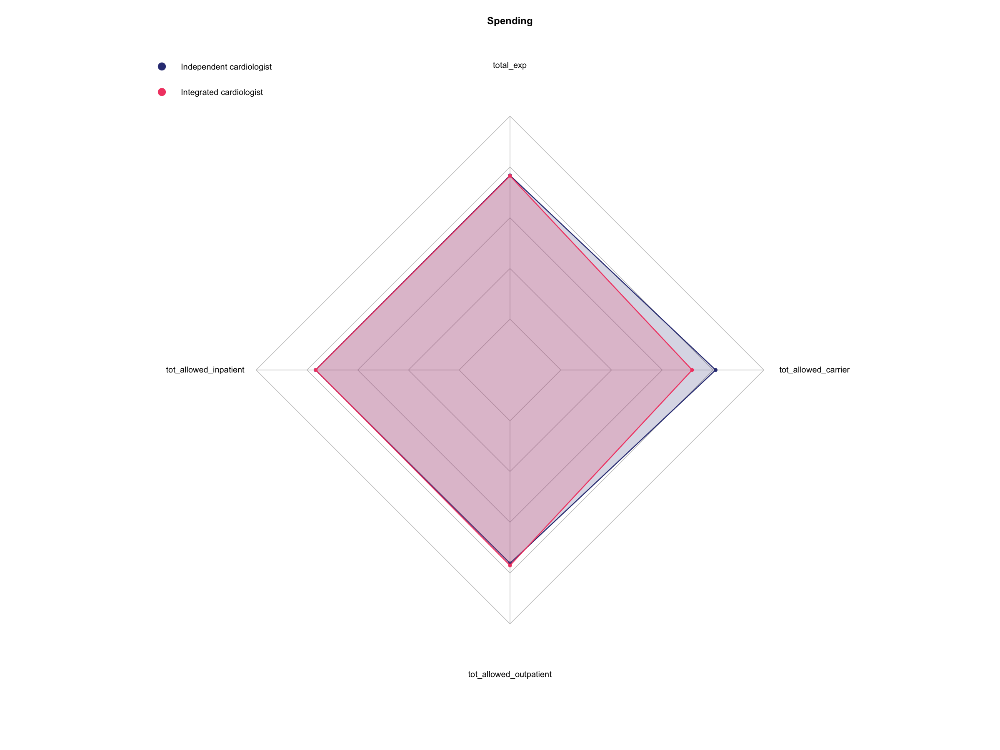

In [334]:
integration_colors <- c("#333C83", "#F24A72")

radarchart(
  df = spending_max_min,
  maxmin = TRUE,  # Do we want the function to calculate minimums and maximums? If yes, we set false
  pcol = integration_colors, # Color for each line
  cglty = 1,       # Line type for radar grids
  cglcol = "gray", # Line color for radar grids
  plwd = 2,        # Line Widths for variables
  plty = 1,        # Line Types for variables
  pfcol = scales::alpha(integration_colors, alpha = 0.2) #the lower the alpha, the higher the transparency.
)

legend("topleft", #where do we want the legend
       legend = rownames(spending_max_min[3:4,]), #The names of the cars (remember, the first two rows are maximum and minimum)
       bty = "n", #the type of box used for the legend
       pch = 20, #the plotting symbols appearing in the legend
       col = integration_colors, #same colors we used in the chart
       text.col = "Black",
       pt.cex = 3 #How big the points you want to be
)

title("Spending")

### Utilization counts

In [715]:
utilization_data=comparison_results_stable_angina_averages[integration_status %in% c("Independent most_common_cardiologist","Integrated most_common_cardiologist")]%>%
select(ends_with("count"))%>%
as.data.table

In [716]:
utilization_data

office_visit_count,cheap_prcdr_count,cardiology_visit_count,stress_test_count,echocardiography_count,expensive_prcdr_count,catheterization_count,cardiac_ct_count,angioplasty_count,ecg_count,cardiac_mri_count,CABG_count
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
14.24493,15.87048,3.022751,0.5226010,1.102943,0.7176753,0.4538970,0.02207539,0.2417030,3.424538,0.00390449,0.07959153
13.07204,14.86902,2.436776,0.5722922,1.224685,0.8795970,0.5476071,0.01813602,0.3138539,3.480605,0.01108312,0.09823678


In [717]:
utilization_data=scale(utilization_data,center=F)
rownames(utilization_data)=c("Independent cardiologist","Integrated cardiologist")

#### Adding Maximum and Minimum Values

In [718]:
colnames(utilization_data)

[1] "office_visit_count"     "cheap_prcdr_count"      "cardiology_visit_count" "stress_test_count"      "echocardiography_count" "expensive_prcdr_count"  "catheterization_count"  "cardiac_ct_count"       "angioplasty_count"      "ecg_count"              "cardiac_mri_count"     
[12] "CABG_count"

In [720]:
maxmin_utilization <- data.frame(
  office_visit_count=c(1,0),
  cheap_prcdr_count=c(1,0),
  cardiology_visit_count=c(1,0),
  stress_test_count=c(1,0),
  echocardiography_count=c(1,0),
  expensive_prcdr_count=c(1,0),
  catheterization_count=c(1,0),
  cardiac_ct_count=c(1,0),
  angioplasty_count=c(1,0),
  ecg_count=c(1,0),
  cardiac_mri_count=c(1,0),
  CABG_count=c(1,0)
)

utilization_max_min <- rbind(maxmin_utilization,utilization_data)
utilization_max_min=utilization_max_min[-c(8,11)]
head(utilization_max_min)


,office_visit_count,cheap_prcdr_count,cardiology_visit_count,stress_test_count,echocardiography_count,expensive_prcdr_count,catheterization_count,angioplasty_count,ecg_count,CABG_count
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000
2,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000
Independent cardiologist,0.7367885,0.7297564,0.7785297,0.6743210,0.6692083,0.6321846,0.6381558,0.6101498,0.7013423,0.6295160
Integrated cardiologist,0.6761232,0.6837073,0.6276078,0.7384384,0.7430748,0.7748178,0.7699073,0.7922861,0.7128246,0.7769875


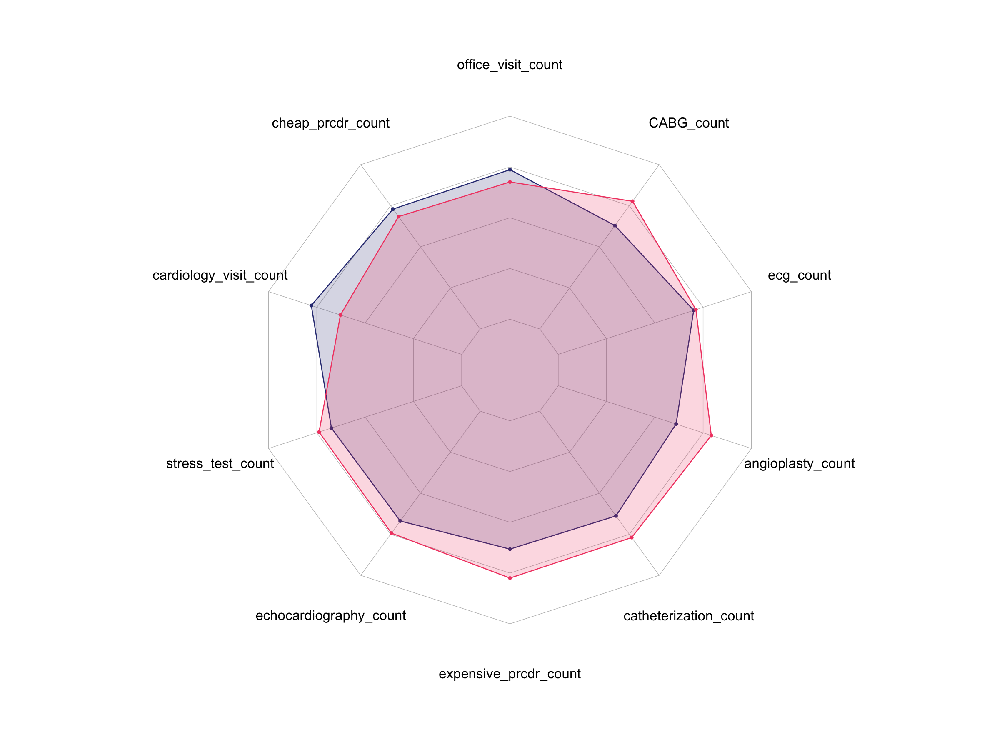

In [730]:
integration_colors <- c("#333C83", "#F24A72")

radarchart(
  df = utilization_max_min,
  maxmin = TRUE,  # Do we want the function to calculate minimums and maximums? If yes, we set false
  pcol = integration_colors, # Color for each line
  cglty = 1,       # Line type for radar grids
  cglcol = "gray", # Line color for radar grids
  plwd = 2,        # Line Widths for variables
  plty = 1,        # Line Types for variables
  pfcol = scales::alpha(integration_colors, alpha = 0.2) #the lower the alpha, the higher the transparency.
  ,vlcex = 1.65
)

#legend("bottomleft", #where do we want the legend
#       legend = rownames(utilization_max_min[3:4,]), #The names of the cars (remember, the first two rows are maximum and minimum)
#       bty = "n", #the type of box used for the legend
#       pch = 20, #the plotting symbols appearing in the legend
#       col = integration_colors, #same colors we used in the chart
#       text.col = "Black",
#       pt.cex = 3 #How big the points you want to be
#       ,cex = 1.65
#)

#title("Utilization Counts")

### Utilization true/false

In [731]:
utilization_tf_data=comparison_results_stable_angina_averages[integration_status %in% c("Independent most_common_cardiologist","Integrated most_common_cardiologist")]%>%
select(  
  cardiology_visit,
  stress_test,
  echocardiography,
  expensive_prcdr,
  catheterization,
  angioplasty,
  ecg,
  CABG,
)%>%
as.data.table

In [732]:
utilization_tf_data=scale(utilization_tf_data,center=F)
rownames(utilization_tf_data)=c("Independent cardiologist","Integrated cardiologist")

#### Adding Maximum and Minimum Values

In [733]:
maxmin_utilization_tf <- data.frame(
  cardiology_visit=c(1,0),
  stress_test=c(1,0),
  echocardiography=c(1,0),
  expensive_prcdr=c(1,0),
  catheterization=c(1,0),
  angioplasty=c(1,0),
  ecg=c(1,0),
  CABG=c(1,0)
)


utilization_tf_max_min <- rbind(maxmin_utilization_tf,utilization_tf_data)

head(utilization_tf_max_min)


,cardiology_visit,stress_test,echocardiography,expensive_prcdr,catheterization,angioplasty,ecg,CABG
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000
2,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000
Independent cardiologist,0.7113188,0.7356633,0.7043665,0.6624016,0.6553248,0.6157375,0.7075922,0.6148955
Integrated cardiologist,0.7028695,0.6773474,0.7098365,0.7491490,0.7553472,0.7879513,0.7066210,0.7886086


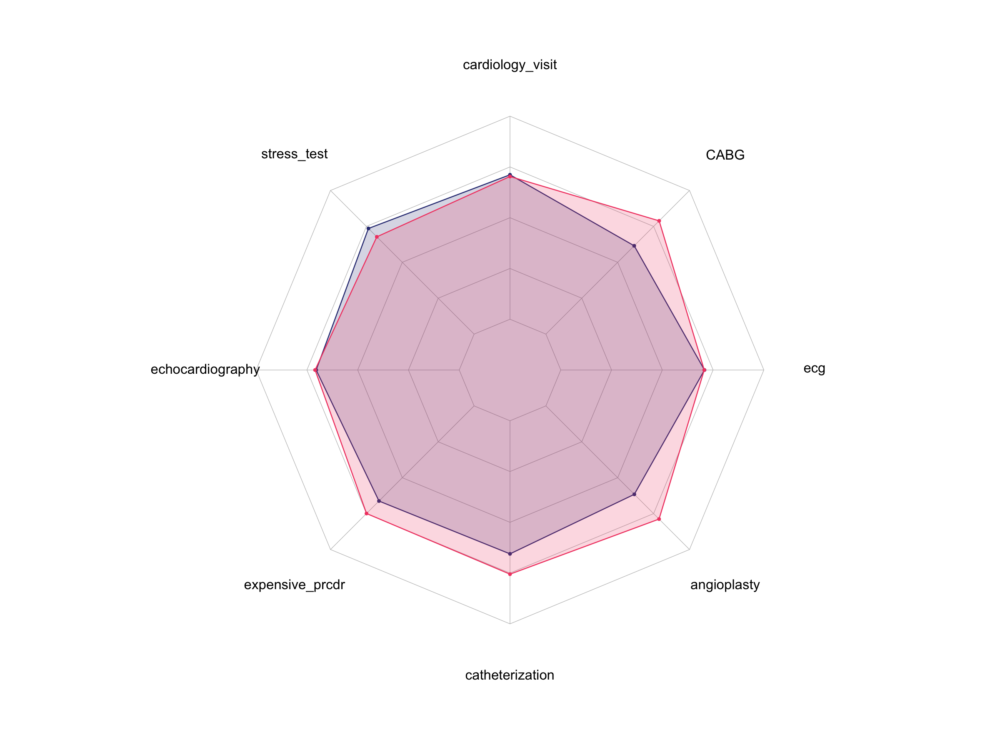

In [735]:
integration_colors <- c("#333C83", "#F24A72")

radarchart(
  df = utilization_tf_max_min,
  maxmin = TRUE,  # Do we want the function to calculate minimums and maximums? If yes, we set false
  pcol = integration_colors, # Color for each line
  cglty = 1,       # Line type for radar grids
  cglcol = "gray", # Line color for radar grids
  plwd = 2,        # Line Widths for variables
  plty = 1,        # Line Types for variables
  pfcol = scales::alpha(integration_colors, alpha = 0.2) #the lower the alpha, the higher the transparency.
  ,vlcex = 1.65
)

#legend("topleft", #where do we want the legend
#       legend = rownames(utilization_tf_max_min[3:4,]), #The names of the cars (remember, the first two rows are maximum and minimum)
#       bty = "n", #the type of box used for the legend
#       pch = 20, #the plotting symbols appearing in the legend
#       col = integration_colors, #same colors we used in the chart
#       text.col = "Black",
#       pt.cex = 3 #How big the points you want to be
#       ,cex = 1.65
#)
#
#title("Utilization Status")


### Comorbidities

In [736]:
comorbidity_data=comparison_results_stable_angina_averages[integration_status %in% c("Independent most_common_cardiologist","Integrated most_common_cardiologist")]%>%
select(
       Hypertension,
       COPD,
       Obesity,
       Depression,
       Diabetes,
       mean_weighted_charlson
)%>%
as.data.table



In [737]:
comorbidity_data=scale(comorbidity_data,center=F)
rownames(comorbidity_data)=c("Independent cardiologist","Integrated cardiologist")

#### Adding Maximum and Minimum Values

In [738]:
maxmin_comorbidity_data <- data.frame(
  Hypertension=c(1,0),
  COPD=c(1,0),
  Obesity=c(1,0),
  Depression=c(1,0),
  Diabetes=c(1,0),
  mean_weighted_charlson=c(1,0)
)


comorbidity_tf_max_min <- rbind(maxmin_comorbidity_data,comorbidity_data)

head(comorbidity_tf_max_min)


,Hypertension,COPD,Obesity,Depression,Diabetes,mean_weighted_charlson
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000
2,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000
Independent cardiologist,0.7592031,0.7423688,0.7626847,0.7131598,0.7325124,0.7305262
Integrated cardiologist,0.6508538,0.6699915,0.6467705,0.7010015,0.6807536,0.6828847


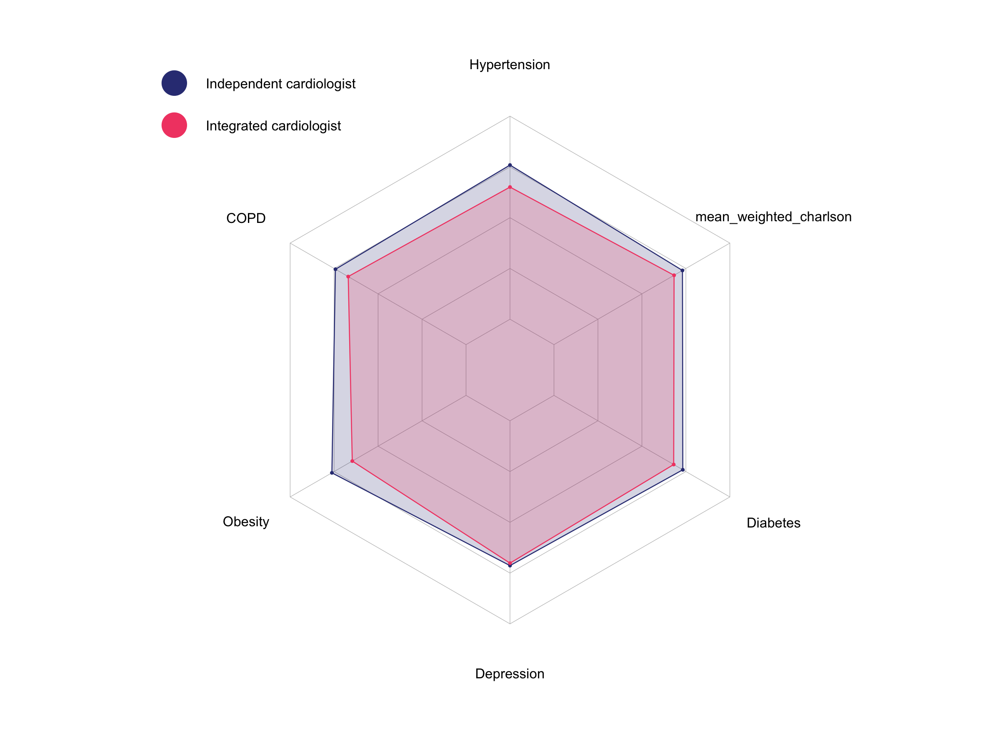

In [739]:
integration_colors <- c("#333C83", "#F24A72")

radarchart(
  df = comorbidity_tf_max_min,
  maxmin = TRUE,  # Do we want the function to calculate minimums and maximums? If yes, we set false
  pcol = integration_colors, # Color for each line
  cglty = 1,       # Line type for radar grids
  cglcol = "gray", # Line color for radar grids
  plwd = 2,        # Line Widths for variables
  plty = 1,        # Line Types for variables
  pfcol = scales::alpha(integration_colors, alpha = 0.2), #the lower the alpha, the higher the transparency.
  vlcex = 1.65
)

legend("topleft", #where do we want the legend
       legend = rownames(comorbidity_tf_max_min[3:4,]), #The names of the cars (remember, the first two rows are maximum and minimum)
       bty = "n", #the type of box used for the legend
       pch = 20, #the plotting symbols appearing in the legend
       col = integration_colors, #same colors we used in the chart
       text.col = "Black",
       pt.cex = 10, #How big the points you want to be
       cex = 1.65
)

#title("Comorbidities")


### Outcomes

In [740]:
colnames(comparison_results_stable_angina_averages)

[1] "integration_status"                           "n"                                            "N_distinct_patients"                          "N_distinct_specialist"                        "Male"                                         "Female"                                      
 [7] "Asian"                                        "Black"                                        "Hispanic"                                     "North_American_Native"                        "White"                                        "Other"                                       
[13] "avg_age"                                      "age_65_74"                                    "age_75_84"                                    "age_85_plus"                                  "West"                                         "South"                                       
[19] "Northeast"                                    "Midwest"                                      "rural_prp"                                    "urban_prp"                                    "year_of_diagnsosis_2014"                      "year_of_diagnsosis_2015"                     
[25] "year_of_diagnsosis_2016"                      "year_of_diagnsosis_2017"                      "year_of_diagnsosis_2018"                      "year_of_diagnsosis_2019"                      "Hypertension"                                 "COPD"                                        
[31] "Obesity"                                      "Depression"                                   "Diabetes"                                     "mean_weighted_charlson"                       "primary_care_physician_integrated"            "distinct_clinicians"                         
[37] "distinct_cardiologists"                       "distinct_primary_care_physicians"             "distinct_surgeons"                            "distinct_other_specialties"                   "total_exp"                                    "tot_allowed_inpatient"                       
[43] "tot_allowed_outpatient"                       "tot_allowed_carrier"                          "cheap_prcdr_cost"                             "expensive_prcdr_cost"                         "unstable_angina"                              "MI_prp"                                      
[49] "cardiac_arrest"                               "stroke"                                       "died_in_one_year_after_diagnosis"             "died_in_two_years_after_diagnosis"            "number_of_hospitalizations"                   "hospitalized_patients"                       
[55] "cardiology_visit"                             "stress_test"                                  "echocardiography"                             "office_visit_count"                           "cheap_prcdr_count"                            "cardiology_visit_count"                      
[61] "stress_test_count"                            "echocardiography_count"                       "expensive_prcdr"                              "catheterization"                              "cardiac_ct"                                   "angioplasty"                                 
[67] "expensive_prcdr_count"                        "catheterization_count"                        "angioplasty_during_year_after_cath_prp"       "angioplasty_at_time_of_cath_prp"              "angioplasty_during_year_after_cath_no_MI_prp" "angioplasty_at_time_of_cath_no_MI_prp"       
[73] "cardiac_ct_count"                             "angioplasty_count"                            "catheterization_cost"                         "ecg"                                          "ecg_count"                                    "ecg_cost"                                    
[79] "cardiac_ct_cost"                              "cardiac_mri"                                  "cardiac_mri_count"                            "cardiac_mri_cost"                             "stress_test_cost"                             "echocardiography_cost"       

In [741]:
comorbidity_data=comparison_results_stable_angina_averages[integration_status %in% c("Independent most_common_cardiologist","Integrated most_common_cardiologist")]%>%
select(
       MI_prp,
       cardiac_arrest,
       stroke,
       died_in_one_year_after_diagnosis,
       died_in_two_years_after_diagnosis,
       hospitalized_patients
)%>%
as.data.table


In [742]:
comorbidity_data=scale(comorbidity_data,center=F)
rownames(comorbidity_data)=c("Independent cardiologist","Integrated cardiologist")

#### Adding Maximum and Minimum Values

In [743]:
maxmin_comorbidity_data <- data.frame(
  MI_prp=c(1,0),
  cardiac_arrest=c(1,0),
  stroke=c(1,0),
  died_in_one_year_after_diagnosis=c(1,0),
  died_in_two_years_after_diagnosis=c(1,0),
  hospitalized_patients=c(1,0)
)


comorbidity_tf_max_min <- rbind(maxmin_comorbidity_data,comorbidity_data)

head(comorbidity_tf_max_min)


,MI_prp,cardiac_arrest,stroke,died_in_one_year_after_diagnosis,died_in_two_years_after_diagnosis,hospitalized_patients
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000
2,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000
Independent cardiologist,0.6142578,0.7907395,0.7643809,0.7330158,0.7226159,0.6777388
Integrated cardiologist,0.7891054,0.6121528,0.6447650,0.6802116,0.6912498,0.7353027


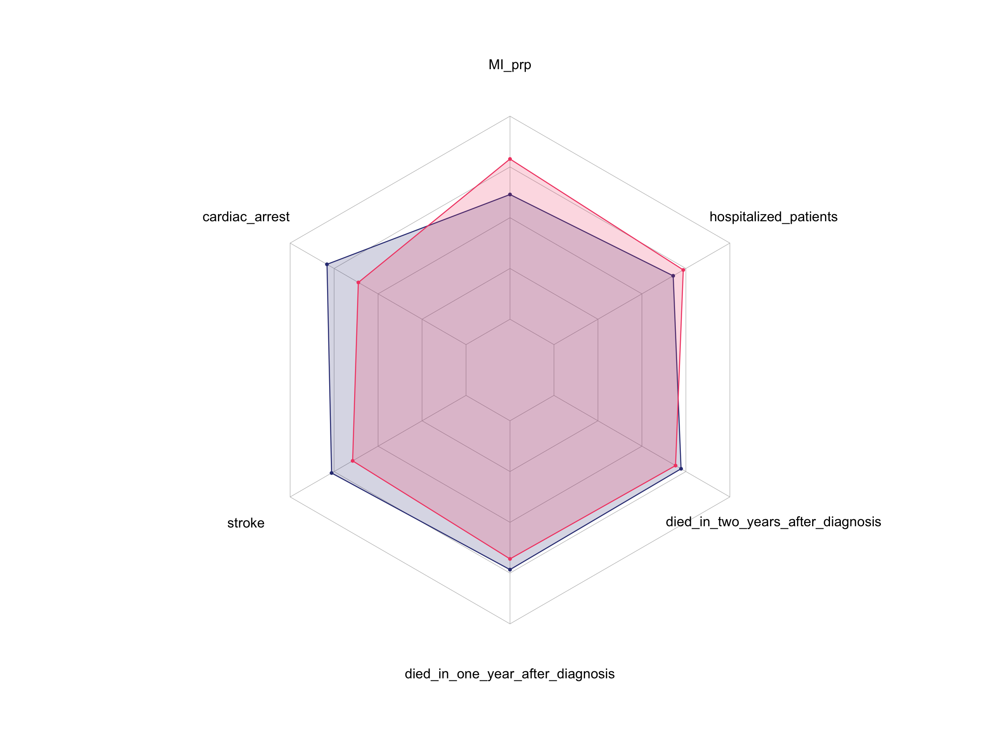

In [747]:
integration_colors <- c("#333C83", "#F24A72")

radarchart(
  df = comorbidity_tf_max_min,
  maxmin = TRUE,  # Do we want the function to calculate minimums and maximums? If yes, we set false
  pcol = integration_colors, # Color for each line
  cglty = 1,       # Line type for radar grids
  cglcol = "gray", # Line color for radar grids
  plwd = 2,        # Line Widths for variables
  plty = 1,        # Line Types for variables
  pfcol = scales::alpha(integration_colors, alpha = 0.2), #the lower the alpha, the higher the transparency.
  vlcex = 1.65
)

#legend("topleft", #where do we want the legend
#       legend = rownames(comorbidity_tf_max_min[3:4,]), #The names of the cars (remember, the first two rows are maximum and minimum)
#       bty = "n", #the type of box used for the legend
#       pch = 20, #the plotting symbols appearing in the legend
#       col = integration_colors, #same colors we used in the chart
#       text.col = "Black",
#       pt.cex = 10, #How big the points you want to be
#       cex = 1.65
#)

#title("Comorbidities")


# Models

In [478]:
length(unique(yearly_calculations_stable_angina$DESY_SORT_KEY))
nrow(yearly_calculations_stable_angina)

yearly_calculations_stable_angina=yearly_calculations_stable_angina %>%
mutate(
  cardio_int=
  case_when(cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS <= 0.2 ~ 0,
            cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS >= 0.5 ~ 1
           )
  )%>% as.data.table()

yearly_calculations_unstable_angina=yearly_calculations_unstable_angina %>%
mutate(
  cardio_int=
  case_when(cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS <= 0.2 ~ 0,
            cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS >= 0.5 ~ 1
           )
  )%>% as.data.table()


[1] 38419

[1] 38426

In [479]:
yearly_calculations_unstable_angina=
yearly_calculations_unstable_angina %>%
filter(state_at_diagnosis %!in% non_us_state_codes &
       age_at_diagnosis>=65&
       HMO_INDICATOR_sum == 12 &
       ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
       (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
      )%>% as.data.table()

head(yearly_calculations_unstable_angina)

DESY_SORT_KEY,first_diagnosis,tot_allowed_carrier,office_visit_count,office_visit_cost_carrier,cardiology_visit_count,distinct_clinicians,distinct_cardiologists,distinct_primary_care_physicians,distinct_surgeons,distinct_other_specialties,catheterization_count,catheterization_cost_carrier,ecg_count,ecg_cost_carrier,cardiac_ct_count,cardiac_ct_cost_carrier,cardiac_mri_count,cardiac_mri_cost_carrier,stress_test_count,stress_test_cost_carrier,echocardiography_count,echocardiography_cost_carrier,angioplasty_count,angioplasty_cost_carrier,CABG_count,CABG_cost_carrier,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,hypertension,copd,obesity,depression,diabetes,icd_9_pure,icd_10_pure,tot_cheap_prcdr,tot_expensive_prcdr,year_first_diagnosed,office_visit_cost_outpatient,catheterization_cost_outpatient,ecg_cost_outpatient,cardiac_ct_cost_outpatient,cardiac_mri_cost_outpatient,stress_test_cost_outpatient,echocardiography_cost_outpatient,angioplasty_cost_outpatient,CABG_cost_outpatient,office_visit_cost,catheterization_cost,ecg_cost,cardiac_ct_cost,cardiac_mri_cost,stress_test_cost,echocardiography_cost,angioplasty_cost,CABG_cost,tot_cheap_prcdr_cost,tot_expensive_prcdr_cost,REFERENCE_YEAR_2013,STATE_CODE_2013,COUNTY_CODE_2013,SEX_CODE_2013,RACE_CODE_2013,AGE_2013,ORIG_REASON_FOR_ENTITLEMENT_2013,CURR_REASON_FOR_ENTITLEMENT_2013,ENTITLEMENT_BUY_IN_IND01_2013,ENTITLEMENT_BUY_IN_IND02_2013,ENTITLEMENT_BUY_IN_IND03_2013,ENTITLEMENT_BUY_IN_IND04_2013,ENTITLEMENT_BUY_IN_IND05_2013,ENTITLEMENT_BUY_IN_IND06_2013,ENTITLEMENT_BUY_IN_IND07_2013,ENTITLEMENT_BUY_IN_IND08_2013,ENTITLEMENT_BUY_IN_IND09_2013,ENTITLEMENT_BUY_IN_IND10_2013,ENTITLEMENT_BUY_IN_IND11_2013,ENTITLEMENT_BUY_IN_IND12_2013,HMO_INDICATOR01_2013,HMO_INDICATOR02_2013,HMO_INDICATOR03_2013,HMO_INDICATOR04_2013,HMO_INDICATOR05_2013,HMO_INDICATOR06_2013,HMO_INDICATOR07_2013,HMO_INDICATOR08_2013,HMO_INDICATOR09_2013,HMO_INDICATOR10_2013,HMO_INDICATOR11_2013,HMO_INDICATOR12_2013,VALID_DATE_OF_DEATH_SWITCH_2013,DATE_OF_DEATH_2013,REFERENCE_YEAR_2014,STATE_CODE_2014,COUNTY_CODE_2014,SEX_CODE_2014,RACE_CODE_2014,AGE_2014,ORIG_REASON_FOR_ENTITLEMENT_2014,CURR_REASON_FOR_ENTITLEMENT_2014,ENTITLEMENT_BUY_IN_IND01_2014,ENTITLEMENT_BUY_IN_IND02_2014,ENTITLEMENT_BUY_IN_IND03_2014,ENTITLEMENT_BUY_IN_IND04_2014,ENTITLEMENT_BUY_IN_IND05_2014,ENTITLEMENT_BUY_IN_IND06_2014,ENTITLEMENT_BUY_IN_IND07_2014,ENTITLEMENT_BUY_IN_IND08_2014,ENTITLEMENT_BUY_IN_IND09_2014,ENTITLEMENT_BUY_IN_IND10_2014,ENTITLEMENT_BUY_IN_IND11_2014,ENTITLEMENT_BUY_IN_IND12_2014,HMO_INDICATOR01_2014,HMO_INDICATOR02_2014,HMO_INDICATOR03_2014,HMO_INDICATOR04_2014,HMO_INDICATOR05_2014,HMO_INDICATOR06_2014,HMO_INDICATOR07_2014,HMO_INDICATOR08_2014,HMO_INDICATOR09_2014,HMO_INDICATOR10_2014,HMO_INDICATOR11_2014,HMO_INDICATOR12_2014,VALID_DATE_OF_DEATH_SWITCH_2014,DATE_OF_DEATH_2014,REFERENCE_YEAR_2015,STATE_CODE_2015,COUNTY_CODE_2015,SEX_CODE_2015,RACE_CODE_2015,AGE_2015,ORIG_REASON_FOR_ENTITLEMENT_2015,CURR_REASON_FOR_ENTITLEMENT_2015,ENTITLEMENT_BUY_IN_IND01_2015,ENTITLEMENT_BUY_IN_IND02_2015,ENTITLEMENT_BUY_IN_IND03_2015,ENTITLEMENT_BUY_IN_IND04_2015,ENTITLEMENT_BUY_IN_IND05_2015,ENTITLEMENT_BUY_IN_IND06_2015,ENTITLEMENT_BUY_IN_IND07_2015,ENTITLEMENT_BUY_IN_IND08_2015,ENTITLEMENT_BUY_IN_IND09_2015,ENTITLEMENT_BUY_IN_IND10_2015,ENTITLEMENT_BUY_IN_IND11_2015,ENTITLEMENT_BUY_IN_IND12_2015,⋯,ENTITLEMENT_BUY_IN_IND01_2018,ENTITLEMENT_BUY_IN_IND02_2018,ENTITLEMENT_BUY_IN_IND03_2018,ENTITLEMENT_BUY_IN_IND04_2018,ENTITLEMENT_BUY_IN_IND05_2018,ENTITLEMENT_BUY_IN_IND06_2018,ENTITLEMENT_BUY_IN_IND07_2018,ENTITLEMENT_BUY_IN_IND08_2018,ENTITLEMENT_BUY_IN_IND09_2018,ENTITLEMENT_BUY_IN_IND10_2018,ENTITLEMENT_BUY_IN_IND11_2018,ENTITLEMENT_BUY_IN_IND12_2018,HMO_INDICATOR01_2018,HMO_INDICATOR02_2018,HMO_INDICATOR03_2018,HMO_INDICATOR04_2018,HMO_INDICATOR05_2018,HMO_INDICATOR06_2018,HMO_INDICATOR07_2018,HMO_INDICATOR08_2018,HMO_INDICATOR09_2018,HMO_INDICATOR10_2018,HMO_INDICATOR11_2018,HMO_INDICATOR12_2018,VALID_DATE_OF_DEATH_SWITCH_2018,DATE_OF_

In [480]:
yearly_calculations_stable_angina=
yearly_calculations_stable_angina %>%
filter(state_at_diagnosis %!in% non_us_state_codes &
       age_at_diagnosis>=65&
       HMO_INDICATOR_sum == 12 &
       ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
       (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))
      )%>% as.data.table()

head(yearly_calculations_stable_angina)

DESY_SORT_KEY,first_diagnosis,tot_allowed_carrier,office_visit_count,office_visit_cost_carrier,cardiology_visit_count,distinct_clinicians,distinct_cardiologists,distinct_primary_care_physicians,distinct_surgeons,distinct_other_specialties,catheterization_count,catheterization_cost_carrier,ecg_count,ecg_cost_carrier,cardiac_ct_count,cardiac_ct_cost_carrier,cardiac_mri_count,cardiac_mri_cost_carrier,stress_test_count,stress_test_cost_carrier,echocardiography_count,echocardiography_cost_carrier,angioplasty_count,angioplasty_cost_carrier,CABG_count,CABG_cost_carrier,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,hypertension,copd,obesity,depression,diabetes,icd_9_pure,icd_10_pure,tot_cheap_prcdr,tot_expensive_prcdr,year_first_diagnosed,office_visit_cost_outpatient,catheterization_cost_outpatient,ecg_cost_outpatient,cardiac_ct_cost_outpatient,cardiac_mri_cost_outpatient,stress_test_cost_outpatient,echocardiography_cost_outpatient,angioplasty_cost_outpatient,CABG_cost_outpatient,office_visit_cost,catheterization_cost,ecg_cost,cardiac_ct_cost,cardiac_mri_cost,stress_test_cost,echocardiography_cost,angioplasty_cost,CABG_cost,tot_cheap_prcdr_cost,tot_expensive_prcdr_cost,REFERENCE_YEAR_2013,STATE_CODE_2013,COUNTY_CODE_2013,SEX_CODE_2013,RACE_CODE_2013,AGE_2013,ORIG_REASON_FOR_ENTITLEMENT_2013,CURR_REASON_FOR_ENTITLEMENT_2013,ENTITLEMENT_BUY_IN_IND01_2013,ENTITLEMENT_BUY_IN_IND02_2013,ENTITLEMENT_BUY_IN_IND03_2013,ENTITLEMENT_BUY_IN_IND04_2013,ENTITLEMENT_BUY_IN_IND05_2013,ENTITLEMENT_BUY_IN_IND06_2013,ENTITLEMENT_BUY_IN_IND07_2013,ENTITLEMENT_BUY_IN_IND08_2013,ENTITLEMENT_BUY_IN_IND09_2013,ENTITLEMENT_BUY_IN_IND10_2013,ENTITLEMENT_BUY_IN_IND11_2013,ENTITLEMENT_BUY_IN_IND12_2013,HMO_INDICATOR01_2013,HMO_INDICATOR02_2013,HMO_INDICATOR03_2013,HMO_INDICATOR04_2013,HMO_INDICATOR05_2013,HMO_INDICATOR06_2013,HMO_INDICATOR07_2013,HMO_INDICATOR08_2013,HMO_INDICATOR09_2013,HMO_INDICATOR10_2013,HMO_INDICATOR11_2013,HMO_INDICATOR12_2013,VALID_DATE_OF_DEATH_SWITCH_2013,DATE_OF_DEATH_2013,REFERENCE_YEAR_2014,STATE_CODE_2014,COUNTY_CODE_2014,SEX_CODE_2014,RACE_CODE_2014,AGE_2014,ORIG_REASON_FOR_ENTITLEMENT_2014,CURR_REASON_FOR_ENTITLEMENT_2014,ENTITLEMENT_BUY_IN_IND01_2014,ENTITLEMENT_BUY_IN_IND02_2014,ENTITLEMENT_BUY_IN_IND03_2014,ENTITLEMENT_BUY_IN_IND04_2014,ENTITLEMENT_BUY_IN_IND05_2014,ENTITLEMENT_BUY_IN_IND06_2014,ENTITLEMENT_BUY_IN_IND07_2014,ENTITLEMENT_BUY_IN_IND08_2014,ENTITLEMENT_BUY_IN_IND09_2014,ENTITLEMENT_BUY_IN_IND10_2014,ENTITLEMENT_BUY_IN_IND11_2014,ENTITLEMENT_BUY_IN_IND12_2014,HMO_INDICATOR01_2014,HMO_INDICATOR02_2014,HMO_INDICATOR03_2014,HMO_INDICATOR04_2014,HMO_INDICATOR05_2014,HMO_INDICATOR06_2014,HMO_INDICATOR07_2014,HMO_INDICATOR08_2014,HMO_INDICATOR09_2014,HMO_INDICATOR10_2014,HMO_INDICATOR11_2014,HMO_INDICATOR12_2014,VALID_DATE_OF_DEATH_SWITCH_2014,DATE_OF_DEATH_2014,REFERENCE_YEAR_2015,STATE_CODE_2015,COUNTY_CODE_2015,SEX_CODE_2015,RACE_CODE_2015,AGE_2015,ORIG_REASON_FOR_ENTITLEMENT_2015,CURR_REASON_FOR_ENTITLEMENT_2015,ENTITLEMENT_BUY_IN_IND01_2015,ENTITLEMENT_BUY_IN_IND02_2015,ENTITLEMENT_BUY_IN_IND03_2015,ENTITLEMENT_BUY_IN_IND04_2015,ENTITLEMENT_BUY_IN_IND05_2015,ENTITLEMENT_BUY_IN_IND06_2015,ENTITLEMENT_BUY_IN_IND07_2015,ENTITLEMENT_BUY_IN_IND08_2015,ENTITLEMENT_BUY_IN_IND09_2015,ENTITLEMENT_BUY_IN_IND10_2015,ENTITLEMENT_BUY_IN_IND11_2015,ENTITLEMENT_BUY_IN_IND12_2015,⋯,ENTITLEMENT_BUY_IN_IND01_2018,ENTITLEMENT_BUY_IN_IND02_2018,ENTITLEMENT_BUY_IN_IND03_2018,ENTITLEMENT_BUY_IN_IND04_2018,ENTITLEMENT_BUY_IN_IND05_2018,ENTITLEMENT_BUY_IN_IND06_2018,ENTITLEMENT_BUY_IN_IND07_2018,ENTITLEMENT_BUY_IN_IND08_2018,ENTITLEMENT_BUY_IN_IND09_2018,ENTITLEMENT_BUY_IN_IND10_2018,ENTITLEMENT_BUY_IN_IND11_2018,ENTITLEMENT_BUY_IN_IND12_2018,HMO_INDICATOR01_2018,HMO_INDICATOR02_2018,HMO_INDICATOR03_2018,HMO_INDICATOR04_2018,HMO_INDICATOR05_2018,HMO_INDICATOR06_2018,HMO_INDICATOR07_2018,HMO_INDICATOR08_2018,HMO_INDICATOR09_2018,HMO_INDICATOR10_2018,HMO_INDICATOR11_2018,HMO_INDICATOR12_2018,VALID_DATE_OF_DEATH_SWITCH_2018,DATE_OF_

In [481]:
library(plm)

In [482]:
physician_unique_patients_count=yearly_calculations_stable_angina %>%
filter(!is.na(cardio_int)) %>%
group_by(most_common_cardiologist_PRF_PHYSN_NPI)%>%
summarise(distinct_patients_for_cardiologist=length(unique(DESY_SORT_KEY)))%>%
as.data.table()
                      


In [483]:
head(physician_unique_patients_count)

most_common_cardiologist_PRF_PHYSN_NPI,distinct_patients_for_cardiologist
<chr>,<int>
1003000936,1
1003009861,1
1003017666,1
1003017963,1
1003019563,3
1003022708,2


In [484]:
yearly_calculations_stable_angina=left_join(yearly_calculations_stable_angina,physician_unique_patients_count,
                                            by="most_common_cardiologist_PRF_PHYSN_NPI")%>% as.data.table


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



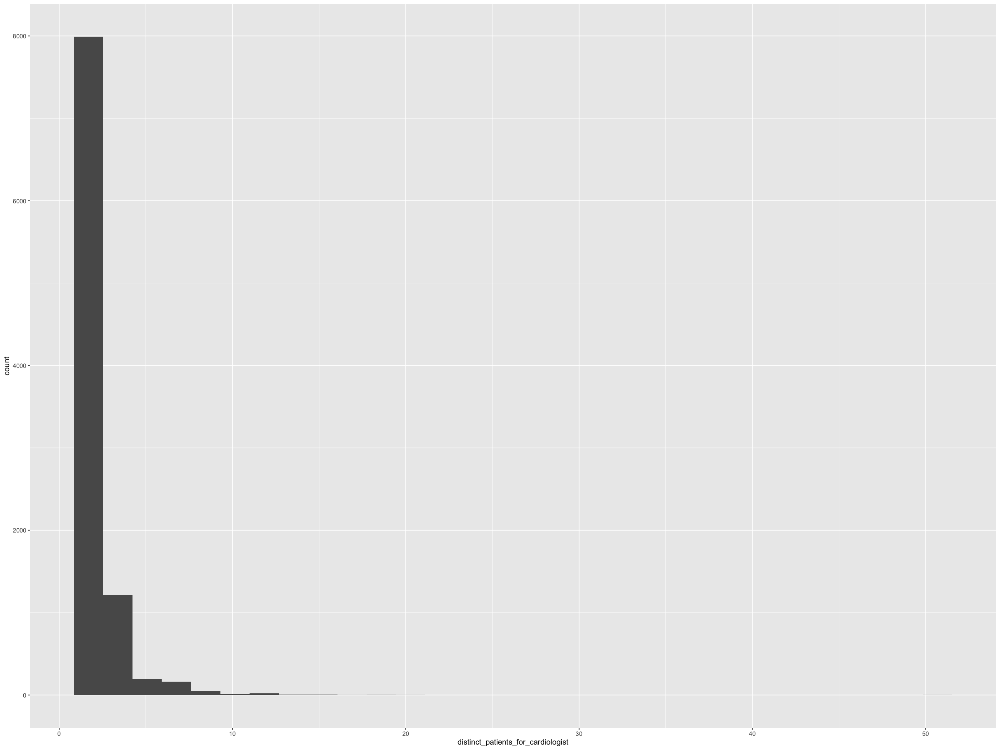

In [486]:
ggplot(data=physician_unique_patients_count)+geom_histogram(aes(distinct_patients_for_cardiologist))

In [465]:
head(yearly_calculations_stable_angina)

DESY_SORT_KEY,first_diagnosis,tot_allowed_carrier,office_visit_count,office_visit_cost_carrier,cardiology_visit_count,distinct_clinicians,distinct_cardiologists,distinct_primary_care_physicians,distinct_surgeons,distinct_other_specialties,catheterization_count,catheterization_cost_carrier,ecg_count,ecg_cost_carrier,cardiac_ct_count,cardiac_ct_cost_carrier,cardiac_mri_count,cardiac_mri_cost_carrier,stress_test_count,stress_test_cost_carrier,echocardiography_count,echocardiography_cost_carrier,angioplasty_count,angioplasty_cost_carrier,CABG_count,CABG_cost_carrier,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,hypertension,copd,obesity,depression,diabetes,icd_9_pure,icd_10_pure,tot_cheap_prcdr,tot_expensive_prcdr,year_first_diagnosed,office_visit_cost_outpatient,catheterization_cost_outpatient,ecg_cost_outpatient,cardiac_ct_cost_outpatient,cardiac_mri_cost_outpatient,stress_test_cost_outpatient,echocardiography_cost_outpatient,angioplasty_cost_outpatient,CABG_cost_outpatient,office_visit_cost,catheterization_cost,ecg_cost,cardiac_ct_cost,cardiac_mri_cost,stress_test_cost,echocardiography_cost,angioplasty_cost,CABG_cost,tot_cheap_prcdr_cost,tot_expensive_prcdr_cost,REFERENCE_YEAR_2013,STATE_CODE_2013,COUNTY_CODE_2013,SEX_CODE_2013,RACE_CODE_2013,AGE_2013,ORIG_REASON_FOR_ENTITLEMENT_2013,CURR_REASON_FOR_ENTITLEMENT_2013,ENTITLEMENT_BUY_IN_IND01_2013,ENTITLEMENT_BUY_IN_IND02_2013,ENTITLEMENT_BUY_IN_IND03_2013,ENTITLEMENT_BUY_IN_IND04_2013,ENTITLEMENT_BUY_IN_IND05_2013,ENTITLEMENT_BUY_IN_IND06_2013,ENTITLEMENT_BUY_IN_IND07_2013,ENTITLEMENT_BUY_IN_IND08_2013,ENTITLEMENT_BUY_IN_IND09_2013,ENTITLEMENT_BUY_IN_IND10_2013,ENTITLEMENT_BUY_IN_IND11_2013,ENTITLEMENT_BUY_IN_IND12_2013,HMO_INDICATOR01_2013,HMO_INDICATOR02_2013,HMO_INDICATOR03_2013,HMO_INDICATOR04_2013,HMO_INDICATOR05_2013,HMO_INDICATOR06_2013,HMO_INDICATOR07_2013,HMO_INDICATOR08_2013,HMO_INDICATOR09_2013,HMO_INDICATOR10_2013,HMO_INDICATOR11_2013,HMO_INDICATOR12_2013,VALID_DATE_OF_DEATH_SWITCH_2013,DATE_OF_DEATH_2013,REFERENCE_YEAR_2014,STATE_CODE_2014,COUNTY_CODE_2014,SEX_CODE_2014,RACE_CODE_2014,AGE_2014,ORIG_REASON_FOR_ENTITLEMENT_2014,CURR_REASON_FOR_ENTITLEMENT_2014,ENTITLEMENT_BUY_IN_IND01_2014,ENTITLEMENT_BUY_IN_IND02_2014,ENTITLEMENT_BUY_IN_IND03_2014,ENTITLEMENT_BUY_IN_IND04_2014,ENTITLEMENT_BUY_IN_IND05_2014,ENTITLEMENT_BUY_IN_IND06_2014,ENTITLEMENT_BUY_IN_IND07_2014,ENTITLEMENT_BUY_IN_IND08_2014,ENTITLEMENT_BUY_IN_IND09_2014,ENTITLEMENT_BUY_IN_IND10_2014,ENTITLEMENT_BUY_IN_IND11_2014,ENTITLEMENT_BUY_IN_IND12_2014,HMO_INDICATOR01_2014,HMO_INDICATOR02_2014,HMO_INDICATOR03_2014,HMO_INDICATOR04_2014,HMO_INDICATOR05_2014,HMO_INDICATOR06_2014,HMO_INDICATOR07_2014,HMO_INDICATOR08_2014,HMO_INDICATOR09_2014,HMO_INDICATOR10_2014,HMO_INDICATOR11_2014,HMO_INDICATOR12_2014,VALID_DATE_OF_DEATH_SWITCH_2014,DATE_OF_DEATH_2014,REFERENCE_YEAR_2015,STATE_CODE_2015,COUNTY_CODE_2015,SEX_CODE_2015,RACE_CODE_2015,AGE_2015,ORIG_REASON_FOR_ENTITLEMENT_2015,CURR_REASON_FOR_ENTITLEMENT_2015,ENTITLEMENT_BUY_IN_IND01_2015,ENTITLEMENT_BUY_IN_IND02_2015,ENTITLEMENT_BUY_IN_IND03_2015,ENTITLEMENT_BUY_IN_IND04_2015,ENTITLEMENT_BUY_IN_IND05_2015,ENTITLEMENT_BUY_IN_IND06_2015,ENTITLEMENT_BUY_IN_IND07_2015,ENTITLEMENT_BUY_IN_IND08_2015,ENTITLEMENT_BUY_IN_IND09_2015,ENTITLEMENT_BUY_IN_IND10_2015,ENTITLEMENT_BUY_IN_IND11_2015,ENTITLEMENT_BUY_IN_IND12_2015,⋯,HMO_INDICATOR03_2018,HMO_INDICATOR04_2018,HMO_INDICATOR05_2018,HMO_INDICATOR06_2018,HMO_INDICATOR07_2018,HMO_INDICATOR08_2018,HMO_INDICATOR09_2018,HMO_INDICATOR10_2018,HMO_INDICATOR11_2018,HMO_INDICATOR12_2018,VALID_DATE_OF_DEATH_SWITCH_2018,DATE_OF_DEATH_2018,REFERENCE_YEAR_2019,STATE_CODE_2019,COUNTY_CODE_2019,SEX_CODE_2019,RACE_CODE_2019,AGE_2019,ORIG_REASON_FOR_ENTITLEMENT_2019,CURR_REASON_FOR_ENTITLEMENT_2019,ENTITLEMENT_BUY_IN_IND01_2019,ENTITLEMENT_BUY_IN_IND02_2019,ENTITLEMENT_BUY_IN_IND03_2019,ENTITLEMENT_BUY_IN_IND04_2019,ENTITLEMENT_BUY_IN_IND05_2019,ENTITLEMENT_BUY_IN_IND06_2019,ENTITLEMENT_BUY_IN_IND07_2019,ENTITLEMENT_BUY_IN_IND08

In [489]:
model_stable=plm(total_exp ~ as.character(cardio_int)+age_at_diagnosis+census_region+race+sex+hypertension+copd+obesity+depression+diabetes+as.character(year_first_diagnosed),
                 index="most_common_cardiologist_PRF_PHYSN_NPI",
                 model="within",
                 data = yearly_calculations_stable_angina %>% filter(!is.na(cardio_int) & distinct_patients_for_cardiologist>1)
                )

In [490]:
summary(model_stable)

Oneway (individual) effect Within Model

Call:
plm(formula = total_exp ~ as.character(cardio_int) + age_at_diagnosis + 
    census_region + race + sex + hypertension + copd + obesity + 
    depression + diabetes + as.character(year_first_diagnosed), 
    data = yearly_calculations_stable_angina %>% filter(!is.na(cardio_int) & 
        distinct_patients_for_cardiologist > 1), model = "within", 
    index = "most_common_cardiologist_PRF_PHYSN_NPI")

Unbalanced Panel: n = 3870, T = 1-50, N = 11562

Residuals:
    Min.  1st Qu.   Median  3rd Qu.     Max. 
-2573555   -50186    -6463    35234  2573555 

Coefficients:
                                        Estimate Std. Error t-value  Pr(>|t|)
as.character(cardio_int)1              -22110.62   17915.58 -1.2342 0.2171826
age_at_diagnosis                         -615.12     294.79 -2.0866 0.0369565
census_regionNortheast                  16265.75   26355.45  0.6172 0.5371419
census_regionSouth                     -17571.67   18917.08 -0.9289 0

In [416]:
model_lm_stable=lm(CABG_count>0 ~ as.character(cardio_int)+age_at_diagnosis+race+sex+hypertension+copd+obesity+depression+diabetes+as.character(year_first_diagnosed),
                 data = yearly_calculations_stable_angina %>% filter(!is.na(cardio_int)))

In [417]:
summary(model_lm_stable)


Call:
lm(formula = CABG_count > 0 ~ as.character(cardio_int) + age_at_diagnosis + 
    race + sex + hypertension + copd + obesity + depression + 
    diabetes + as.character(year_first_diagnosed), data = yearly_calculations_stable_angina %>% 
    filter(!is.na(cardio_int)))

Residuals:
     Min       1Q   Median       3Q      Max 
-0.10359 -0.05850 -0.03703 -0.01737  1.01802 

Coefficients:
                                         Estimate Std. Error t value Pr(>|t|)
(Intercept)                             0.1169466  0.0185060   6.319 2.69e-10
as.character(cardio_int)1               0.0141259  0.0031741   4.450 8.62e-06
age_at_diagnosis                       -0.0014583  0.0001995  -7.311 2.76e-13
raceBlack                              -0.0115615  0.0110272  -1.048 0.294445
raceHispanic                           -0.0074177  0.0139175  -0.533 0.594058
raceNorth American Native               0.0131639  0.0233680   0.563 0.573219
raceOther                              -0.0004412  0.014718

In [364]:
yearly_calculations_stable_angina %>%
filter(census_region=="Midwest")%>%
filter(!is.na(cardio_int))%>%
summarise(mean(total_exp))

Source: local data table [1 x 1]
Call:   `_DT120`[census_region == "Midwest"][!is.na(cardio_int), .(`mean(total_exp)` = mean(total_exp))]

  `mean(total_exp)`
              <dbl>
1            90276.

# Use as.data.table()/as.data.frame()/as_tibble() to access results

## Old IV

In [13]:
model_for_vi_prediction=lm(cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS>0.5~primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS>0.5,
   data = yearly_calculations_stable_angina)

In [14]:
summary(model_for_vi_prediction)


Call:
lm(formula = cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS > 
    0.5 ~ primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS > 
    0.5, data = yearly_calculations_stable_angina)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.5768 -0.1859 -0.1859 -0.1859  0.8141 

Coefficients:
                                                                      Estimate Std. Error t value Pr(>|t|)    
(Intercept)                                                           0.185911   0.004066   45.72   <2e-16 ***
primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS > 0.5TRUE 0.390918   0.014493   26.97   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3983 on 10414 degrees of freedom
  (4900 observations deleted due to missingness)
Multiple R-squared:  0.0653,	Adjusted R-squared:  0.06521 
F-statistic: 727.5 on 1 and 10414 DF,  p-value: < 2.2e-16


In [135]:
library(jtools)
library(knitr)
library(kableExtra)

In [192]:
naive_model=lm(catheterization_count>0~
               (cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS>0.5)+
               sex+
               race+
               age_at_diagnosis+
               census_region+
               hypertension+
               copd+
               obesity+
               depression+
               diabetes+
               wscore,
               data = yearly_calculations_stable_angina
              )



In [193]:
summ(naive_model)

MODEL INFO:
Observations: 12549 (2767 missing obs. deleted)
Dependent Variable: catheterization_count > 0
Type: OLS linear regression 

MODEL FIT:
F(18,12530) = 34.18, p = 0.00
R² = 0.05
Adj. R² = 0.05 

Standard errors: OLS
----------------------------------------------------------------------------
                                                                 Est.   S.E.
------------------------------------------------------------- ------- ------
(Intercept)                                                      1.04   0.06
cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS        0.05   0.01
> 0.5TRUE                                                                   
sexMale                                                          0.06   0.01
raceBlack                                                        0.05   0.03
raceHispanic                                                     0.05   0.04
raceNorth American Native                                        0.15   0.07
raceO

## IV model

In [149]:
tail(yearly_calculations_stable_angina,20)

DESY_SORT_KEY,first_diagnosis,tot_allowed_carrier,office_visit_count,office_visit_cost_carrier,cardiology_visit_count,distinct_clinicians,distinct_cardiologists,distinct_primary_care_physicians,distinct_surgeons,distinct_other_specialties,catheterization_count,catheterization_cost_carrier,ecg_count,ecg_cost_carrier,cardiac_ct_count,cardiac_ct_cost_carrier,cardiac_mri_count,cardiac_mri_cost_carrier,stress_test_count,stress_test_cost_carrier,echocardiography_count,echocardiography_cost_carrier,angioplasty_count,angioplasty_cost_carrier,CABG_count,CABG_cost_carrier,stable_angina,unstable_angina,MI,cardiac_arrest,stroke,hypertension,copd,obesity,depression,diabetes,icd_9_pure,icd_10_pure,year_first_diagnosed,tot_allowed_carrier_cardiology_related,office_visit_count_cardiology_related,office_visit_cost_carrier_cardiology_related,cardiology_visit_count_cardiology_related,distinct_clinicians_cardiology_related,distinct_cardiologists_cardiology_related,distinct_primary_care_physicians_cardiology_related,distinct_surgeons_cardiology_related,distinct_other_specialties_cardiology_related,catheterization_count_cardiology_related,catheterization_cost_carrier_cardiology_related,ecg_count_cardiology_related,ecg_cost_carrier_cardiology_related,cardiac_ct_count_cardiology_related,cardiac_ct_cost_carrier_cardiology_related,cardiac_mri_count_cardiology_related,cardiac_mri_cost_carrier_cardiology_related,stress_test_count_cardiology_related,stress_test_cost_carrier_cardiology_related,echocardiography_count_cardiology_related,echocardiography_cost_carrier_cardiology_related,angioplasty_count_cardiology_related,angioplasty_cost_carrier_cardiology_related,CABG_count_cardiology_related,CABG_cost_carrier_cardiology_related,office_visit_cost_outpatient,catheterization_cost_outpatient,ecg_cost_outpatient,cardiac_ct_cost_outpatient,cardiac_mri_cost_outpatient,stress_test_cost_outpatient,echocardiography_cost_outpatient,angioplasty_cost_outpatient,CABG_cost_outpatient,office_visit_cost_outpatient_cardiology_related,catheterization_cost_outpatient_cardiology_related,ecg_cost_outpatient_cardiology_related,cardiac_ct_cost_outpatient_cardiology_related,cardiac_mri_cost_outpatient_cardiology_related,stress_test_cost_outpatient_cardiology_related,echocardiography_cost_outpatient_cardiology_related,angioplasty_cost_outpatient_cardiology_related,CABG_cost_outpatient_cardiology_related,office_visit_cost,catheterization_cost,ecg_cost,cardiac_ct_cost,cardiac_mri_cost,stress_test_cost,echocardiography_cost,angioplasty_cost,CABG_cost,office_visit_cost_cardiology_related,catheterization_cost_cardiology_related,ecg_cost_cardiology_related,cardiac_ct_cost_cardiology_related,cardiac_mri_cost_cardiology_related,stress_test_cost_cardiology_related,echocardiography_cost_cardiology_related,angioplasty_cost_cardiology_related,CABG_cost_cardiology_related,tot_cheap_prcdr_cost,tot_expensive_prcdr_cost,tot_cheap_prcdr_cost_cardiology_related,tot_expensive_prcdr_cost_cardiology_related,REFERENCE_YEAR_2013,STATE_CODE_2013,COUNTY_CODE_2013,SEX_CODE_2013,RACE_CODE_2013,AGE_2013,ORIG_REASON_FOR_ENTITLEMENT_2013,CURR_REASON_FOR_ENTITLEMENT_2013,ENTITLEMENT_BUY_IN_IND01_2013,ENTITLEMENT_BUY_IN_IND02_2013,ENTITLEMENT_BUY_IN_IND03_2013,ENTITLEMENT_BUY_IN_IND04_2013,ENTITLEMENT_BUY_IN_IND05_2013,ENTITLEMENT_BUY_IN_IND06_2013,ENTITLEMENT_BUY_IN_IND07_2013,ENTITLEMENT_BUY_IN_IND08_2013,ENTITLEMENT_BUY_IN_IND09_2013,ENTITLEMENT_BUY_IN_IND10_2013,ENTITLEMENT_BUY_IN_IND11_2013,ENTITLEMENT_BUY_IN_IND12_2013,HMO_INDICATOR01_2013,HMO_INDICATOR02_2013,HMO_INDICATOR03_2013,HMO_INDICATOR04_2013,HMO_INDICATOR05_2013,HMO_INDICATOR06_2013,HMO_INDICATOR07_2013,HMO_INDICATOR08_2013,HMO_INDICATOR09_2013,HMO_INDICATOR10_2013,HMO_INDICATOR11_2013,HMO_INDICATOR12_2013,VALID_DATE_OF_DEATH_SWITCH_2013,DATE_OF_DEATH_2013,REFERENCE_YEAR_2014,STATE_CODE_2014,COUNTY_CODE_2014,SEX_CODE_2014,RACE_CODE_2014,AGE_2014,ORIG_REASON_FOR_ENTITLEMENT_2014,CURR_REASON_FOR_ENTITLEMENT_2014,ENTITLEMENT_BUY_IN_IND01_2014,ENTITLE

In [162]:
sum(yearly_calculations_stable_angina[,primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS]<0.5,na.rm=T)
sum(yearly_calculations_unstable_angina[,primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS]<0.5,na.rm=T)


[1] 9591

[1] 6067

In [202]:
iv_model=lm((cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS>=0.5)~
               primary_care_physician_2013_avg_in_year_of_diagnosis_more_than_half+
               sex+
               race+
               age_at_diagnosis+
               census_region+
               hypertension+
               copd+
               obesity+
               depression+
               diabetes+
               wscore,
               data = yearly_calculations_stable_angina[primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS<0.5,]
              )

In [203]:
summ(iv_model)

MODEL INFO:
Observations: 6768 (2823 missing obs. deleted)
Dependent Variable: (cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS >= 0.5)
Type: OLS linear regression 

MODEL FIT:
F(18,6749) = 16.72, p = 0.00
R² = 0.04
Adj. R² = 0.04 

Standard errors: OLS
-------------------------------------------------------------------------------------
                                                                                 Est.
----------------------------------------------------------------------------- -------
(Intercept)                                                                      0.25
primary_care_physician_2013_avg_in_year_of_diagnosis_more_than_halfTRUE          0.23
sexMale                                                                         -0.00
raceBlack                                                                        0.06
raceHispanic                                                                    -0.01
raceNorth American Native                       

In [182]:
yearly_calculations_stable_angina[,primary_care_physician_2013_avg_in_year_of_diagnosis_more_than_half
                                  :=(primary_care_physician_2013_avg_in_year_of_diagnosis_non_exclusive_HCPCS>=0.5)
                                 ]

In [204]:
predictions_iv=predict(iv_model,
        newdata = yearly_calculations_stable_angina[primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS<0.5,
                                                    .(primary_care_physician_2013_avg_in_year_of_diagnosis_more_than_half,
                                                    sex,
                                                    race,
                                                    age_at_diagnosis,
                                                    census_region,
                                                    hypertension,
                                                    copd,
                                                    obesity,
                                                    depression,
                                                    diabetes,
                                                    wscore)])

In [205]:
head(predictions_iv)

1         2         3         4         5         6 
0.1669053 0.2104425 0.1848067 0.2079860 0.1733503        NA

In [206]:
yearly_calculations_stable_angina[primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS<0.5,predictions_iv:=predictions_iv]

In [207]:
iv_model_stage_2=lm(catheterization_count>0~
                    predictions_iv+
                    sex+
                    race+
                    age_at_diagnosis+
                    census_region+
                    hypertension+
                    copd+
                    obesity+
                    depression+
                    diabetes+
                    wscore,
                    data = yearly_calculations_stable_angina[primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS<0.5]
                   )

In [208]:
  summ(iv_model_stage_2, robust = "HC1")

MODEL INFO:
Observations: 6771 (2820 missing obs. deleted)
Dependent Variable: catheterization_count > 0
Type: OLS linear regression 

MODEL FIT:
F(18,6752) = 19.82, p = 0.00
R² = 0.05
Adj. R² = 0.05 

Standard errors: Robust, type = HC1
--------------------------------------------------------------
                                   Est.   S.E.   t val.      p
------------------------------- ------- ------ -------- ------
(Intercept)                        1.14   0.08    14.65   0.00
predictions_iv                     0.23   0.10     2.35   0.02
sexMale                            0.05   0.01     4.30   0.00
raceBlack                          0.03   0.04     0.67   0.50
raceHispanic                       0.10   0.06     1.65   0.10
raceNorth American Native          0.10   0.11     0.89   0.37
raceOther                          0.01   0.05     0.16   0.87
raceUnknown                        0.03   0.08     0.42   0.67
raceWhite                          0.09   0.03     2.67   0.01
age_at

In [218]:
iv_model_stage_2=lm(catheterization_count>0~
                    predictions_iv+
                    sex+
                    race+
                    age_at_diagnosis+
                    census_region+
                    hypertension+
                    copd+
                    obesity+
                    depression+
                    diabetes+
                    wscore,
                    data = yearly_calculations_stable_angina[primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS<0.5]
                   )

In [219]:
  summ(iv_model_stage_2, robust = "HC1")

MODEL INFO:
Observations: 6771 (2820 missing obs. deleted)
Dependent Variable: catheterization_count > 0
Type: OLS linear regression 

MODEL FIT:
F(18,6752) = 19.82, p = 0.00
R² = 0.05
Adj. R² = 0.05 

Standard errors: Robust, type = HC1
--------------------------------------------------------------
                                   Est.   S.E.   t val.      p
------------------------------- ------- ------ -------- ------
(Intercept)                        1.14   0.08    14.65   0.00
predictions_iv                     0.23   0.10     2.35   0.02
sexMale                            0.05   0.01     4.30   0.00
raceBlack                          0.03   0.04     0.67   0.50
raceHispanic                       0.10   0.06     1.65   0.10
raceNorth American Native          0.10   0.11     0.89   0.37
raceOther                          0.01   0.05     0.16   0.87
raceUnknown                        0.03   0.08     0.42   0.67
raceWhite                          0.09   0.03     2.67   0.01
age_at

In [113]:
model_for_vi_prediction=lm(cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS>0.5~primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS>0.5,
   data = yearly_calculations_stable_angina)



In [114]:
summary(model_for_vi_prediction)


Call:
lm(formula = cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS > 
    0.5 ~ primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS > 
    0.5, data = yearly_calculations_stable_angina)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.5528 -0.1796 -0.1796 -0.1796  0.8204 

Coefficients:
                                                                      Estimate
(Intercept)                                                            0.17957
primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS > 0.5TRUE  0.37321
                                                                      Std. Error
(Intercept)                                                              0.00313
primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS > 0.5TRUE    0.01098
                                                                      t value
(Intercept)                                                             57.38
primary_care_physician_2013_avg_in_2013_non_exclus

In [106]:
data.frame(summary_naive_model[,c("coefficients",])

,naive_model.coefficients
,<dbl>
(Intercept),0.4620868369
cardiologist_avg_in_year_of_diagnosis_non_exclusive_HCPCS > 0.5TRUE,0.0057857648
sexMale,-0.0082758015
raceBlack,-0.0079291916
raceHispanic,-0.0535267498
raceNorth American Native,-0.0166116322
raceOther,0.0068311557
raceUnknown,-0.0137014046
raceWhite,-0.0602084491


In [126]:
data_for_analysis_stable_angina=
yearly_calculations_stable_angina%>%
filter(state_code_at_diagnosis %!in% non_us_state_codes &
          HMO_INDICATOR_sum == 12 &
          ((died_in_one_year_after_diagnosis==T & ENTITLEMENT_BUY_IN_IND_sum>0) |
           (died_in_one_year_after_diagnosis==F & ENTITLEMENT_BUY_IN_IND_sum==12))&
       !is.na(primary_care_physician_2013_avg_in_2013_non_exclusive_HCPCS))%>%
   as.data.table()


In [127]:
nrow(data_for_analysis_stable_angina)

[1] 19852

In [121]:
nrow(yearly_calculations_stable_angina)

[1] 38426